In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
import tensorflow as tf
from keras.constraints import max_norm
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize



files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
  
dates=list()
prices=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    #priceData = get_price_data(param)
    #stock = StockDataFrame.retype(priceData)
    #price = pd.DataFrame(stock)
    #string=['close_2_sma','close_4_sma','close_6_sma','close_8_sma','close_10_sma','close_12_sma','close_14_sma','close_16_sma','close_18_sma','pdi','mdi','dx','adx','adxr','cr','cr-ma1','cr-ma2','cr-ma3','boll','boll_ub','boll_lb','volume_-2_d','volume_-4_d','volume_-6_d','volume_-8_d','volume_-10_d','volume_-12_d','macd','macds','macdh','kdjk','kdjd','kdjj','tr','atr','wr_2','wr_10','wr_6','wr_8','wr_12','wr_14','close_-2_d','close_-4_d','close_-6_d','close_-8_d','close_-10_d','close_-12_d','close_-14_d','close_-16_d','rsi_2','rsi_4','rsi_6','rsi_8','rsi_10','rsi_12','rsi_14','rsi_16']
    #string=['close_2_sma','close_4_sma','close_6_sma','close_8_sma','close_10_sma','close_12_sma','close_14_sma','close_16_sma','close_18_sma','pdi','mdi','dx','adx','adxr','cr','cr-ma1','cr-ma2','cr-ma3','boll','boll_ub','boll_lb','volume_-2_d','volume_-4_d','volume_-6_d','volume_-8_d','volume_-10_d','volume_-12_d','macd','macds','macdh','kdjk','kdjd','kdjj','tr','atr','wr_2','wr_10','wr_6','wr_8','wr_12','wr_14','close_-2_d','close_-4_d','close_-6_d','close_-8_d','close_-10_d','close_-12_d','close_-14_d','close_-16_d','rsi_2','rsi_4','rsi_6','rsi_8','rsi_10','rsi_12','rsi_14','rsi_16']
    #stock.get(string)
    
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    dates.append(price['Unnamed: 0'])
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    
    price=price.drop(['Unnamed: 0'],axis=1)
   
    
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    print(file)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


AAPL
AMZN
PEP
GOOGL
MSFT
FB
INTC
CSCO
CMCSA
NVDA
NFLX
BKNG
ADBE
AMGN
TXN
AVGO
PYPL
GILD
COST
QCOM


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
            
def buildModel(l,n,d,le):
    opt=optimizers.Adam(lr=le)
    model = Sequential()  
    model.add(Dense(n, input_dim=111,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model

           


Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


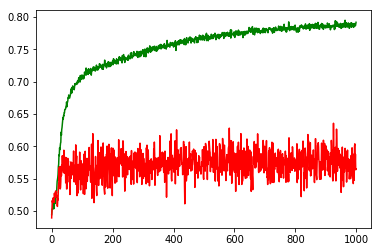

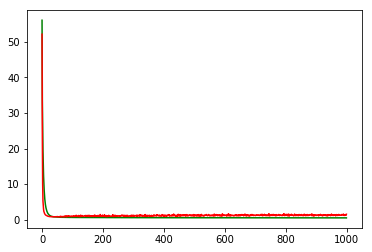

working on d,u and l,le 0.5 64 0.01 0.0001


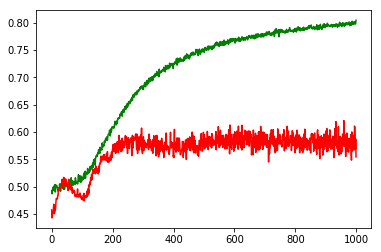

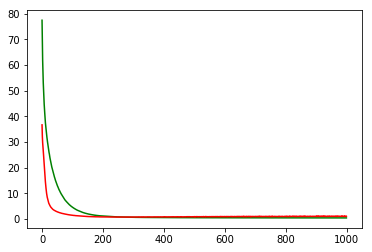

working on d,u and l,le 0.5 64 0.01 1e-05


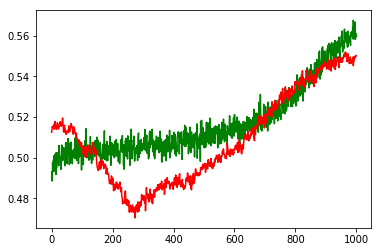

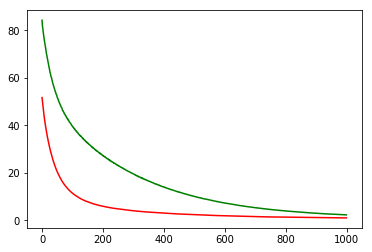

working on d,u and l,le 0.5 64 0.05 0.001


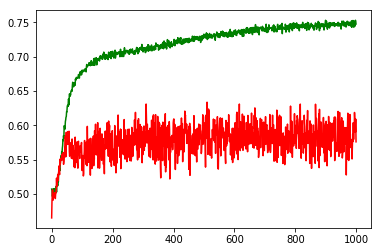

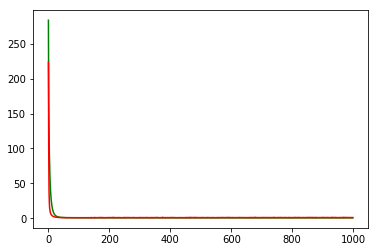

working on d,u and l,le 0.5 64 0.05 0.0001


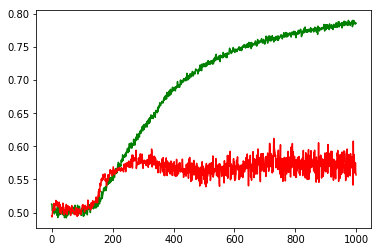

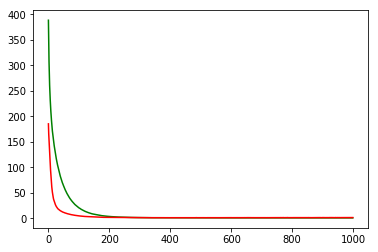

working on d,u and l,le 0.5 64 0.05 1e-05


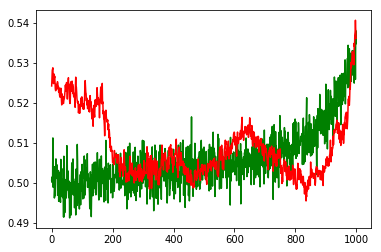

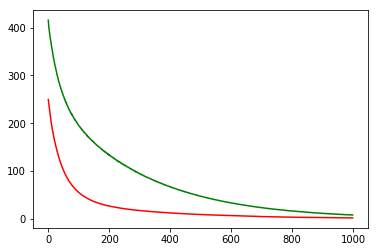

working on d,u and l,le 0.5 128 0.01 0.001


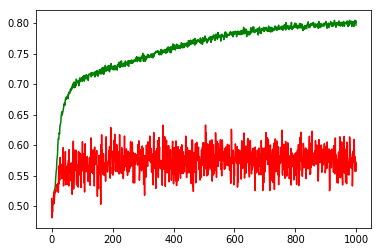

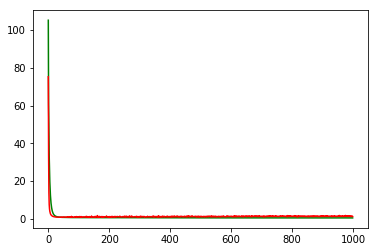

working on d,u and l,le 0.5 128 0.01 0.0001


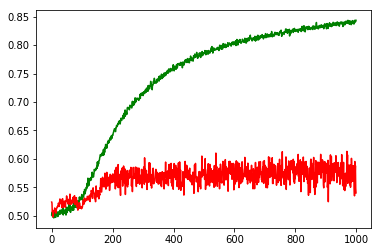

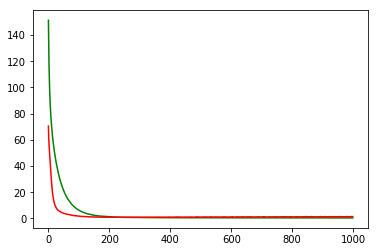

working on d,u and l,le 0.5 128 0.01 1e-05


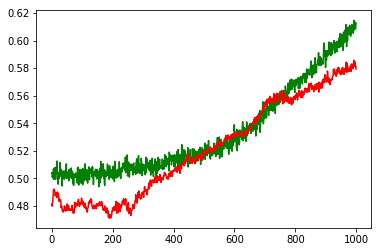

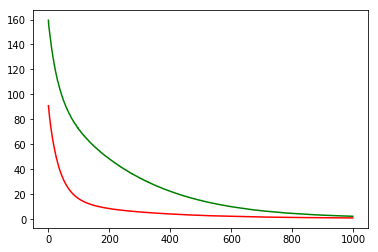

working on d,u and l,le 0.5 128 0.05 0.001


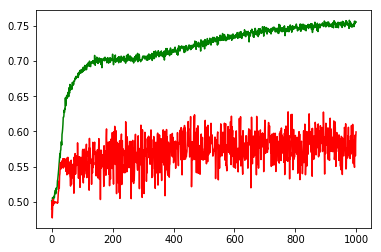

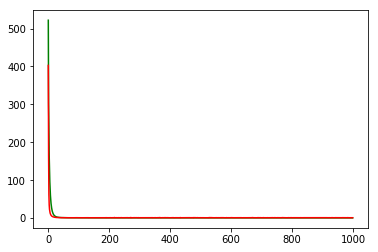

working on d,u and l,le 0.5 128 0.05 0.0001


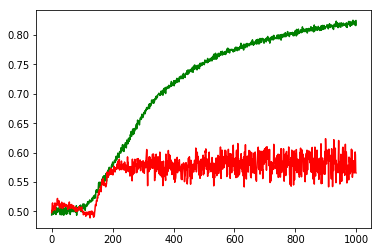

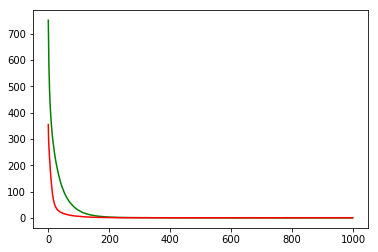

working on d,u and l,le 0.5 128 0.05 1e-05


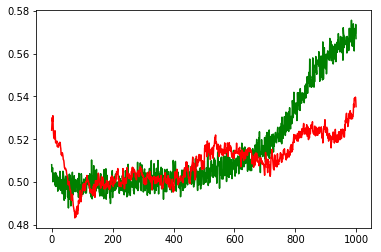

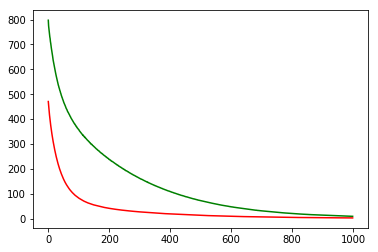

working on d,u and l,le 0.5 256 0.01 0.001


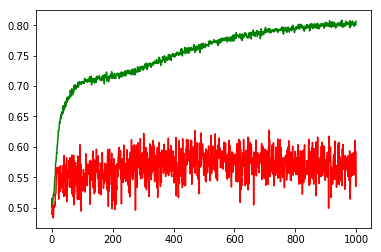

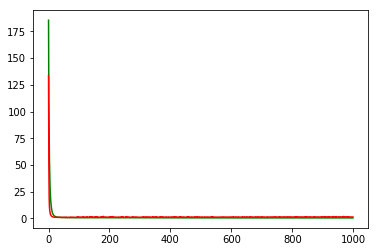

working on d,u and l,le 0.5 256 0.01 0.0001


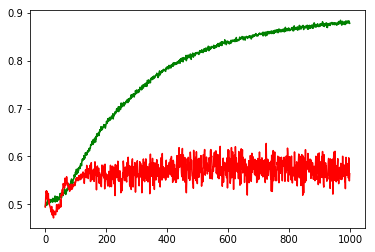

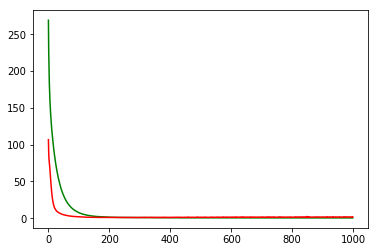

working on d,u and l,le 0.5 256 0.01 1e-05


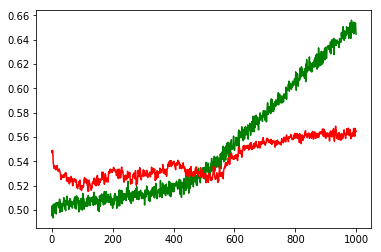

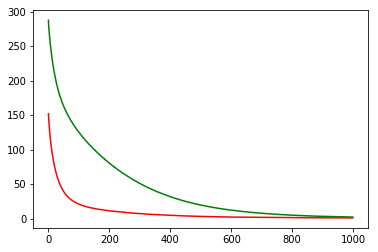

working on d,u and l,le 0.5 256 0.05 0.001


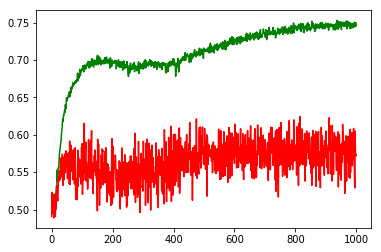

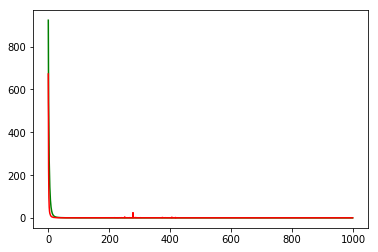

working on d,u and l,le 0.5 256 0.05 0.0001


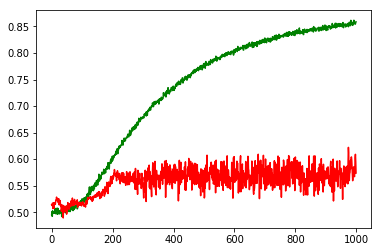

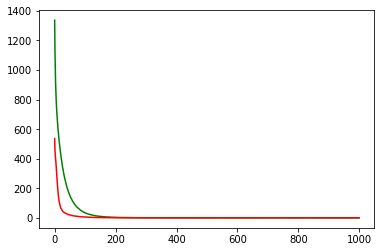

working on d,u and l,le 0.5 256 0.05 1e-05


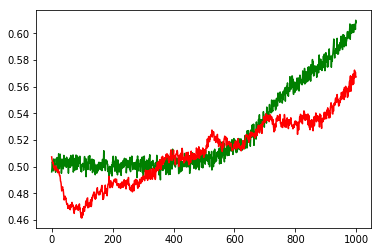

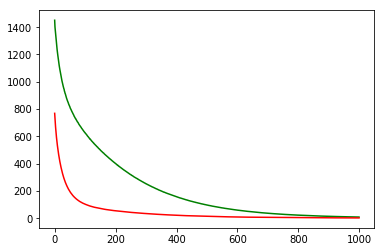

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: AAPL


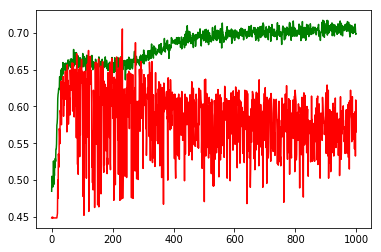

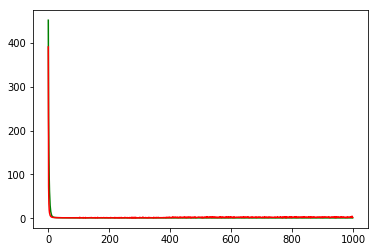

F1,score 0.3970588235294118
G-score: 0.494250713113991
Accuracy 0.5653710247349824
Window: 140
[[478  30]
 [462 162]]
Vol pos 3.6505703100769984
Vol neg 2.5156165461828706
Real Percentage of gain: 23.871622880847163
Percentage of gain: 0.9705668354481507
Total gain: 1098.6816577273066
000000000000000000000000000000000000000000000000
Percentile:  0
[[370  14]
 [367   8]]
759/759 [==============================] - 0s 25us/step
[2.400690514996785, 0.4980237154150198]
Percentile:  1
[[58  8]
 [46 38]]
150/150 [==============================] - 0s 36us/step
[1.8092414524157843, 0.64]
Percentile:  2
[[50  8]
 [17 62]]
137/137 [==============================] - 0s 29us/step
[0.4159899229442116, 0.8175182481751825]
Percentile:  3
[[ 0  0]
 [10 39]]
49/49 [==============================] - 0s 56us/step
[0.4213209018415334, 0.7959183673469388]
Percentile:  4
[[ 0  0]
 [20 15]]
35/35 [==============================] - 0s 86us/step
[0.7209233624594552, 0.42857142857142855]
000000000000000000000000

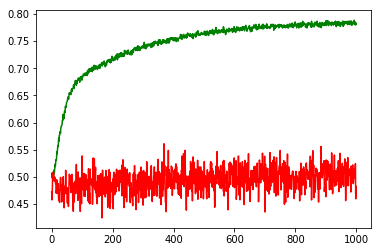

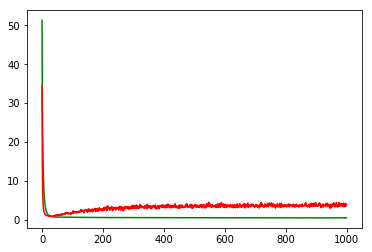

working on d,u and l,le 0.5 64 0.01 0.0001


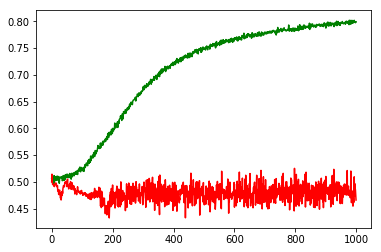

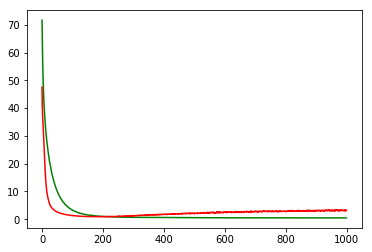

working on d,u and l,le 0.5 64 0.01 1e-05


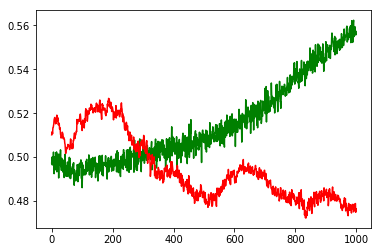

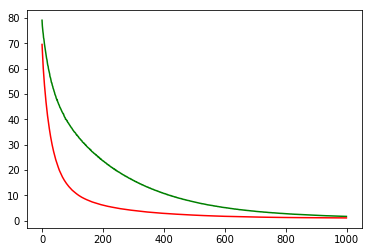

working on d,u and l,le 0.5 64 0.05 0.001


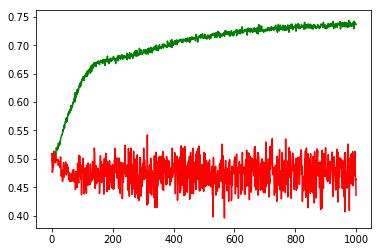

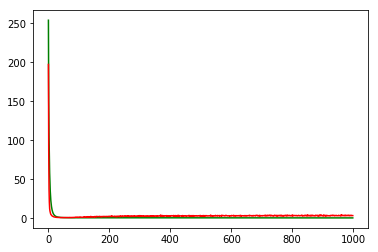

working on d,u and l,le 0.5 64 0.05 0.0001


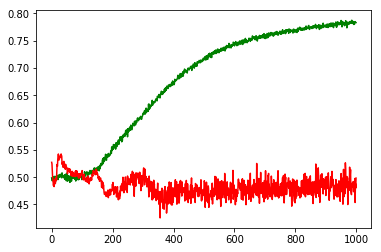

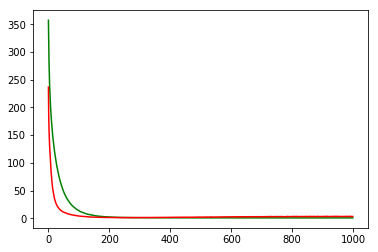

working on d,u and l,le 0.5 64 0.05 1e-05


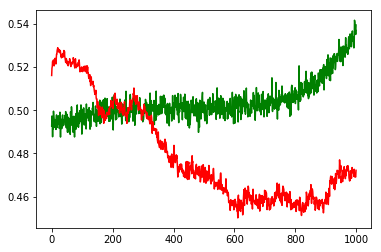

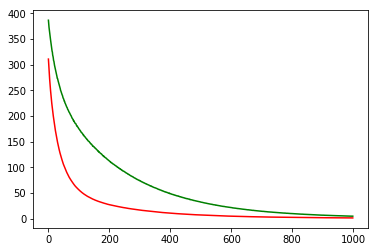

working on d,u and l,le 0.5 128 0.01 0.001


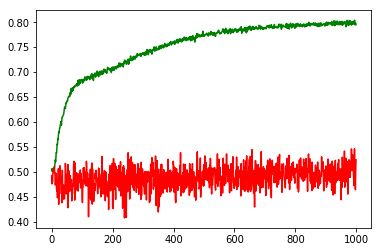

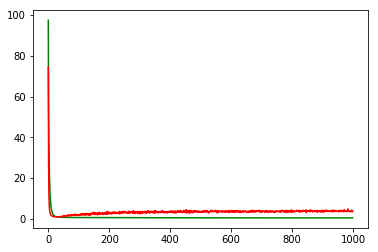

working on d,u and l,le 0.5 128 0.01 0.0001


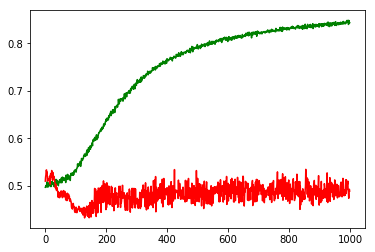

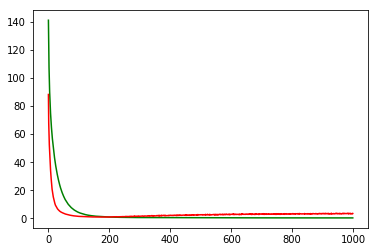

working on d,u and l,le 0.5 128 0.01 1e-05


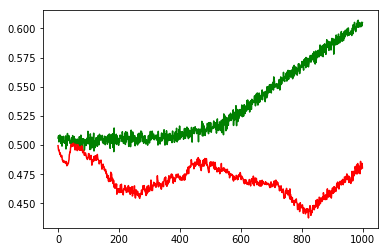

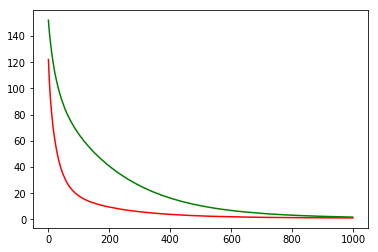

working on d,u and l,le 0.5 128 0.05 0.001


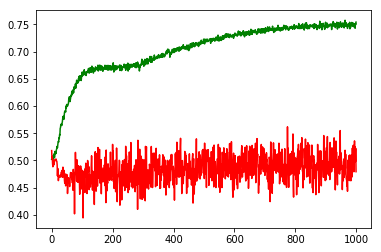

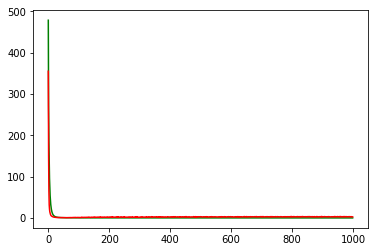

working on d,u and l,le 0.5 128 0.05 0.0001


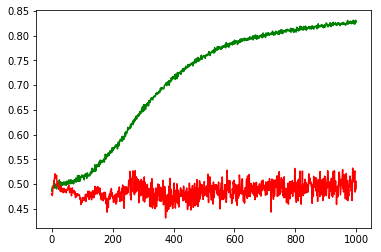

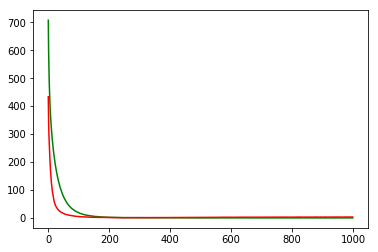

working on d,u and l,le 0.5 128 0.05 1e-05


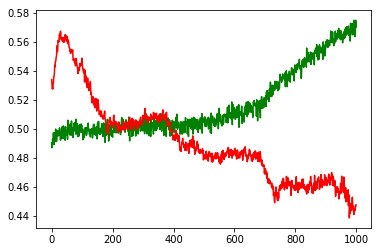

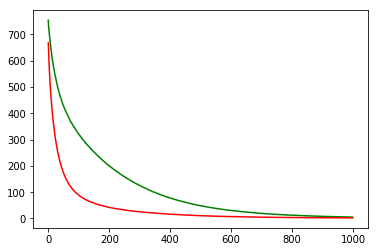

working on d,u and l,le 0.5 256 0.01 0.001


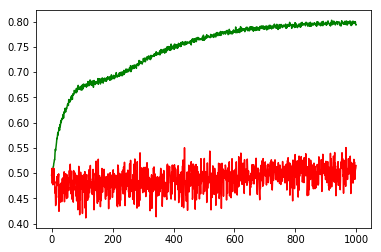

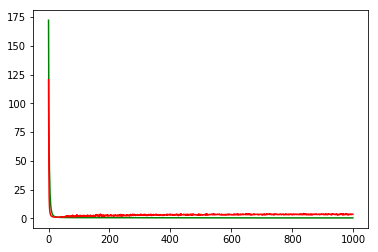

working on d,u and l,le 0.5 256 0.01 0.0001


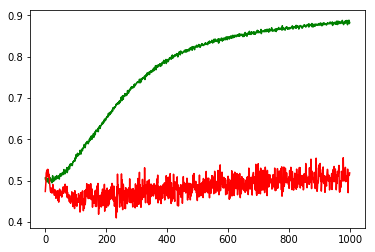

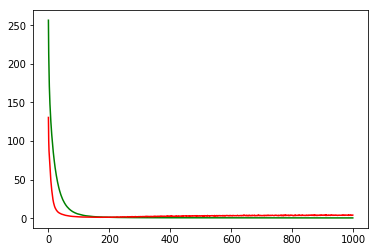

working on d,u and l,le 0.5 256 0.01 1e-05


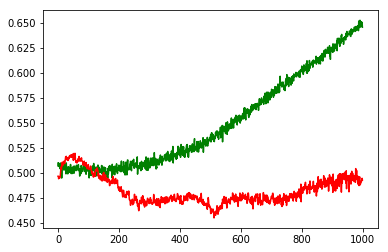

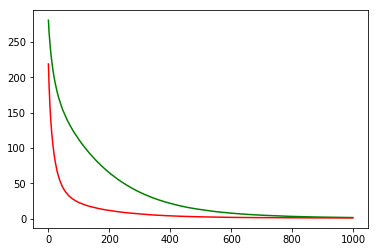

working on d,u and l,le 0.5 256 0.05 0.001


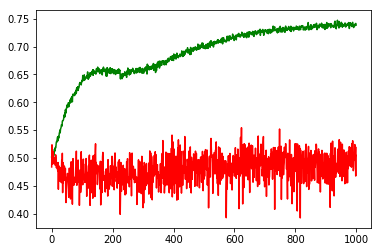

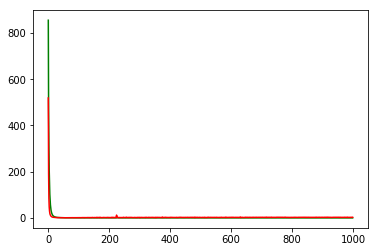

working on d,u and l,le 0.5 256 0.05 0.0001


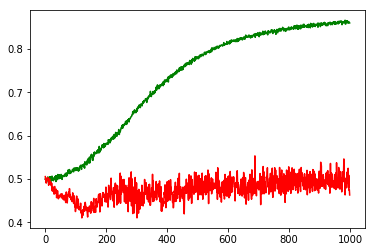

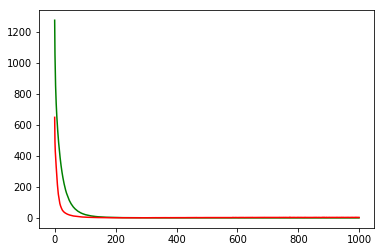

working on d,u and l,le 0.5 256 0.05 1e-05


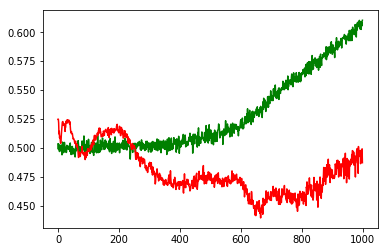

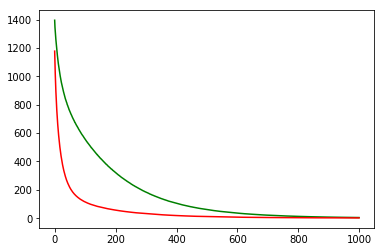

maxd,maxu,maxl,maxle: 0.5 256 0.01 1e-05
Chart for BEST MODEL FOR: AMZN


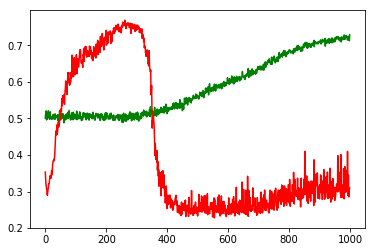

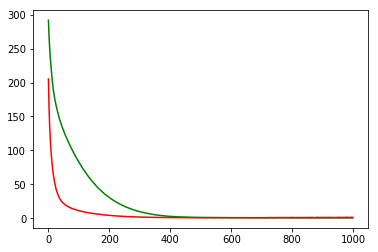

F1,score 0.2718808193668529
G-score: 0.3670005344147283
Accuracy 0.30918727902030774
Window: 140
[[204  47]
 [735 146]]
Vol pos 2.31196158915752
Vol neg 2.3792650493057317
Real Percentage of gain: -163.75227690417293
Percentage of gain: -0.9287974490741608
Total gain: -1051.39871235195
000000000000000000000000000000000000000000000000
Percentile:  0
[[168  31]
 [381  51]]
631/631 [==============================] - 0s 30us/step
[1.2963650179362713, 0.34706814591839275]
Percentile:  1
[[ 24  12]
 [283  66]]
385/385 [==============================] - 0s 33us/step
[1.277579710700295, 0.23376623376623376]
Percentile:  2
[[12  4]
 [54  5]]
75/75 [==============================] - 0s 47us/step
[1.172982897758484, 0.22666666706403096]
Percentile:  3
[[ 0  0]
 [16 17]]
33/33 [==============================] - 0s 88us/step
[0.7595340212186178, 0.5151515151515151]
Percentile:  4
[[0 0]
 [1 5]]
6/6 [==============================] - 0s 133us/step
[0.5416484475135803, 0.8333333134651184]
00000000000

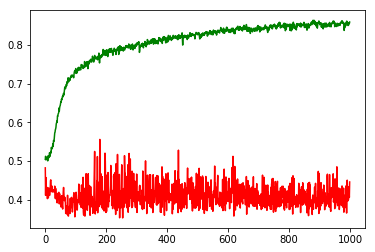

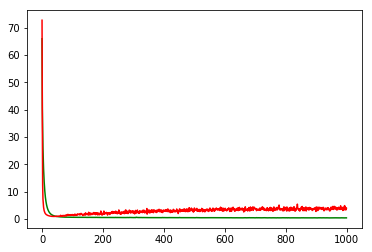

working on d,u and l,le 0.5 64 0.01 0.0001


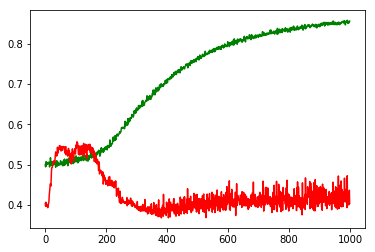

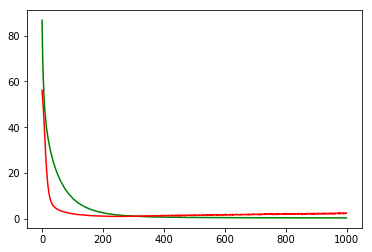

working on d,u and l,le 0.5 64 0.01 1e-05


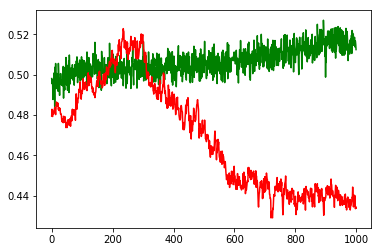

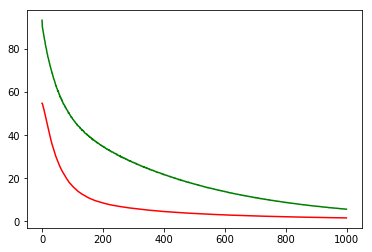

working on d,u and l,le 0.5 64 0.05 0.001


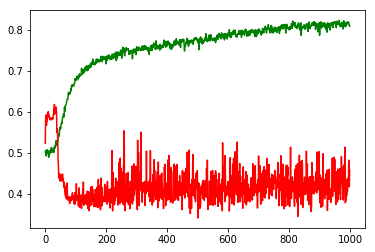

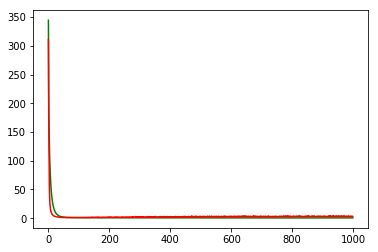

working on d,u and l,le 0.5 64 0.05 0.0001


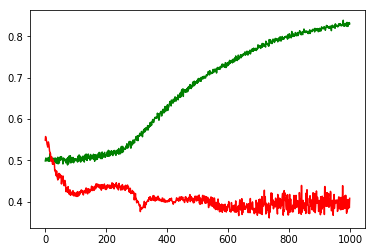

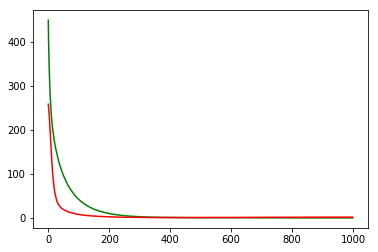

working on d,u and l,le 0.5 64 0.05 1e-05


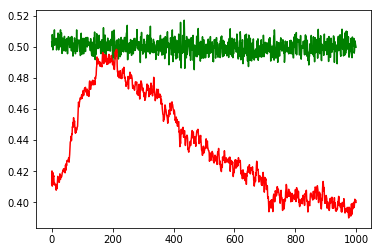

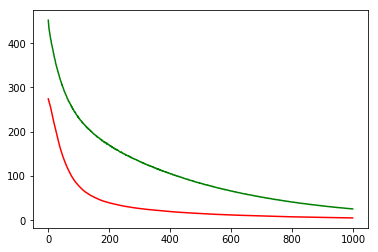

working on d,u and l,le 0.5 128 0.01 0.001


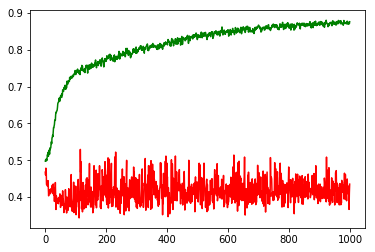

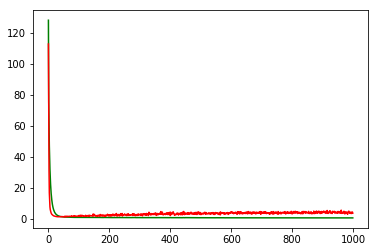

working on d,u and l,le 0.5 128 0.01 0.0001


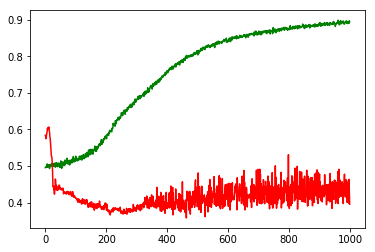

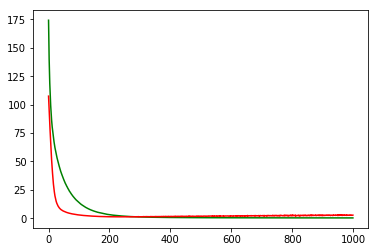

working on d,u and l,le 0.5 128 0.01 1e-05


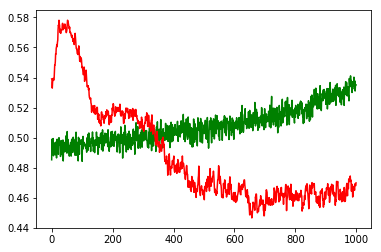

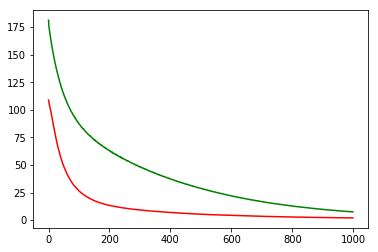

working on d,u and l,le 0.5 128 0.05 0.001


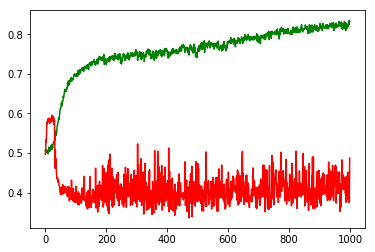

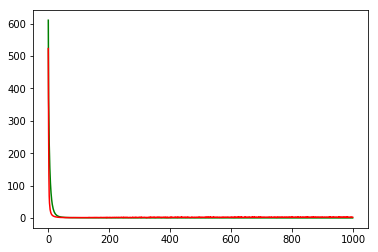

working on d,u and l,le 0.5 128 0.05 0.0001


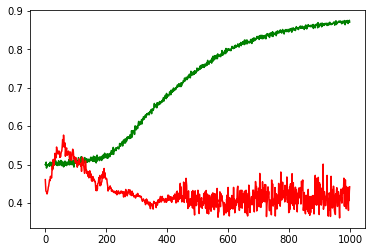

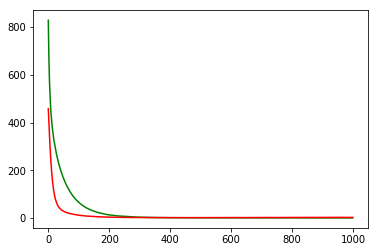

working on d,u and l,le 0.5 128 0.05 1e-05


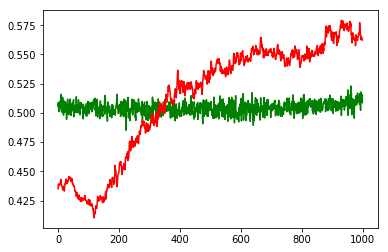

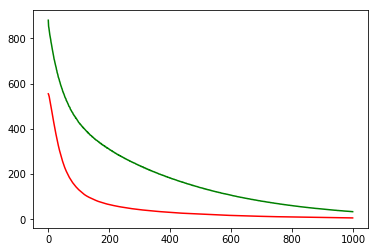

working on d,u and l,le 0.5 256 0.01 0.001


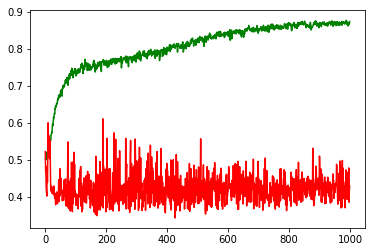

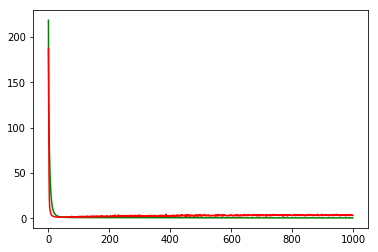

working on d,u and l,le 0.5 256 0.01 0.0001


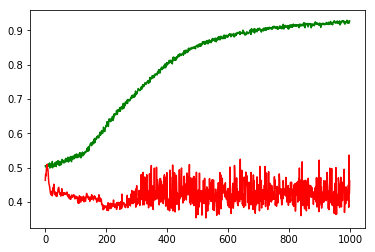

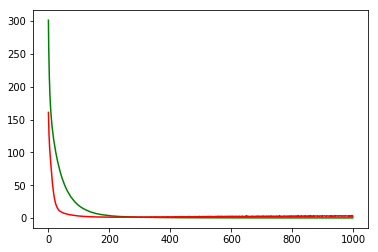

working on d,u and l,le 0.5 256 0.01 1e-05


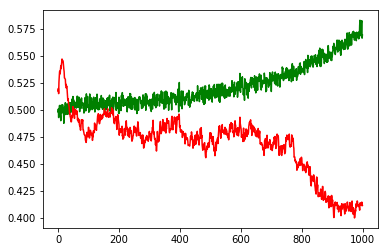

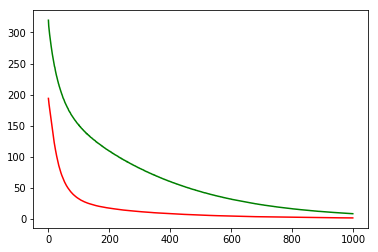

working on d,u and l,le 0.5 256 0.05 0.001


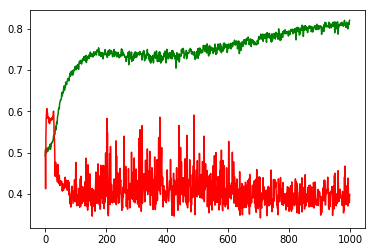

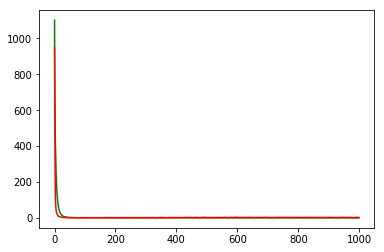

working on d,u and l,le 0.5 256 0.05 0.0001


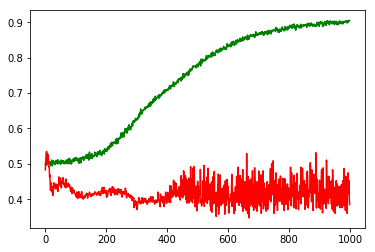

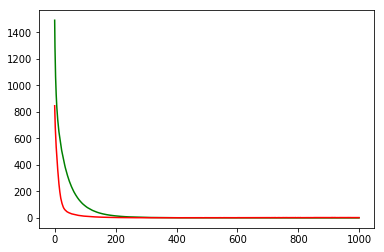

working on d,u and l,le 0.5 256 0.05 1e-05


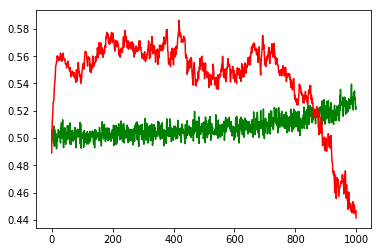

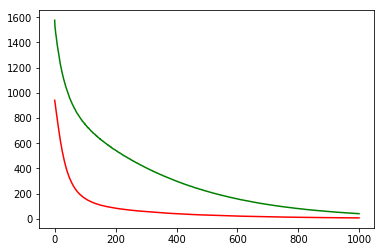

maxd,maxu,maxl,maxle: 0.5 256 0.01 1e-05
Chart for BEST MODEL FOR: PEP


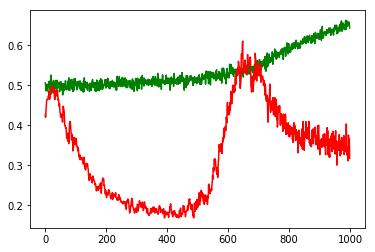

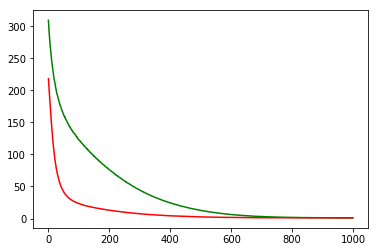

F1,score 0.41059602649006627
G-score: 0.40106828427971974
Accuracy 0.3174846625766871
Window: 140
[[ 52  37]
 [408 155]]
Vol pos 2.1802918430177867
Vol neg 2.0493452893848985
Real Percentage of gain: -38.60683789587596
Percentage of gain: -0.7065003715822054
Total gain: -460.63824227159796
000000000000000000000000000000000000000000000000
Percentile:  0
[[44 26]
 [92 17]]
179/179 [==============================] - 0s 41us/step
[0.8908402523514944, 0.3407821215730806]
Percentile:  1
[[  8  11]
 [104  42]]
165/165 [==============================] - 0s 43us/step
[0.9476195046395967, 0.30303030303030304]
Percentile:  2
[[  0   0]
 [147  39]]
186/186 [==============================] - 0s 33us/step
[0.926766780114943, 0.20967741943495247]
Percentile:  3
[[ 0  0]
 [37 39]]
76/76 [==============================] - 0s 57us/step
[0.7952189476866471, 0.5131578947368421]
Percentile:  4
[[ 0  0]
 [27 18]]
45/45 [==============================] - 0s 48us/step
[0.765615991751353, 0.4000000003311369]
0

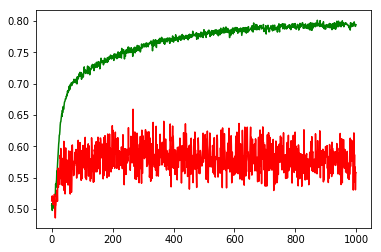

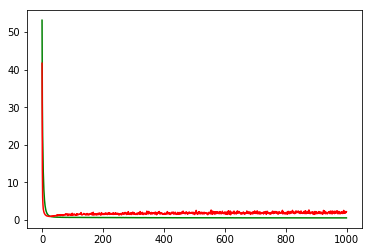

working on d,u and l,le 0.5 64 0.01 0.0001


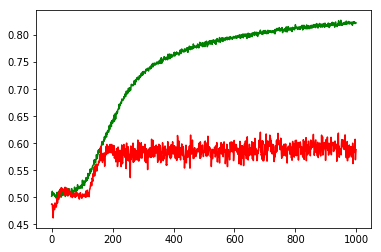

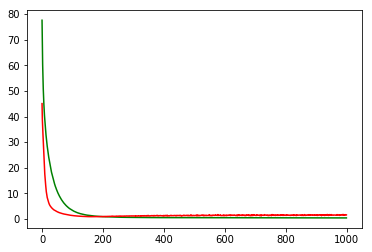

working on d,u and l,le 0.5 64 0.01 1e-05


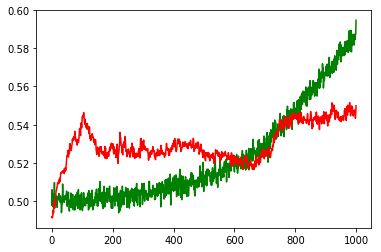

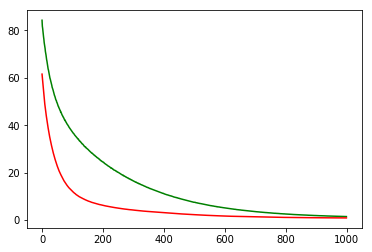

working on d,u and l,le 0.5 64 0.05 0.001


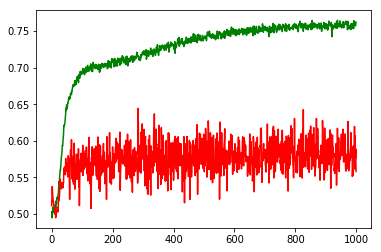

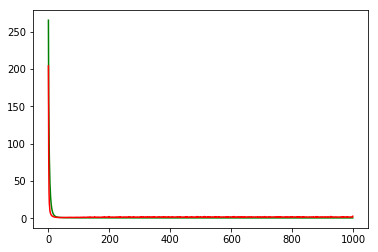

working on d,u and l,le 0.5 64 0.05 0.0001


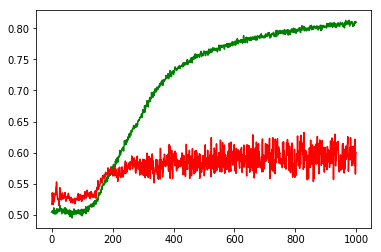

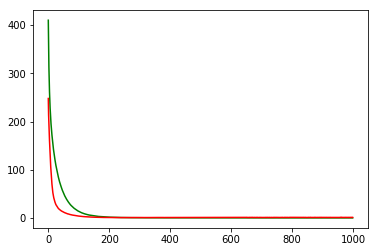

working on d,u and l,le 0.5 64 0.05 1e-05


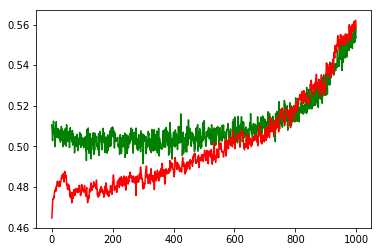

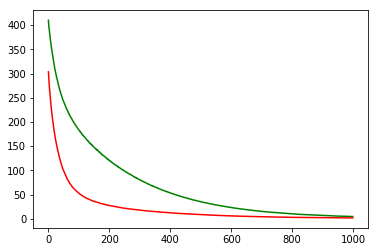

working on d,u and l,le 0.5 128 0.01 0.001


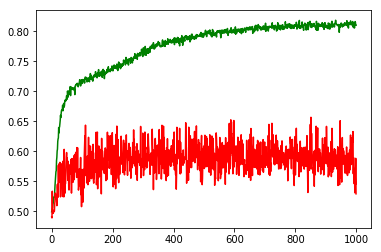

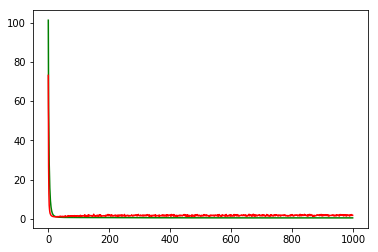

working on d,u and l,le 0.5 128 0.01 0.0001


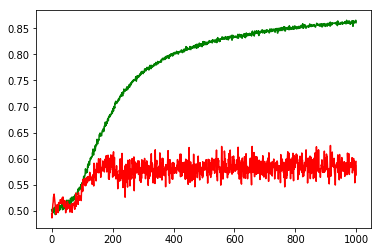

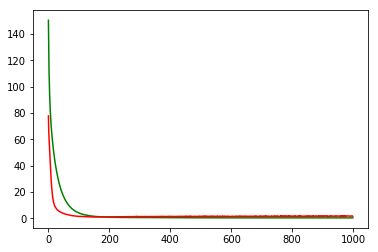

working on d,u and l,le 0.5 128 0.01 1e-05


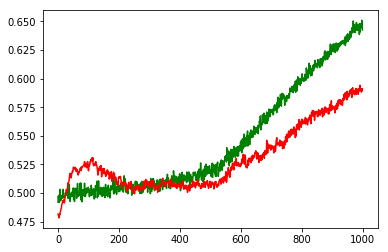

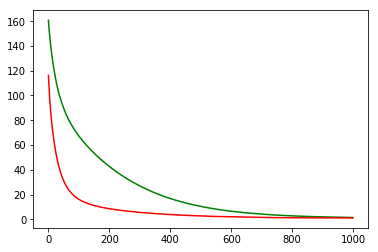

working on d,u and l,le 0.5 128 0.05 0.001


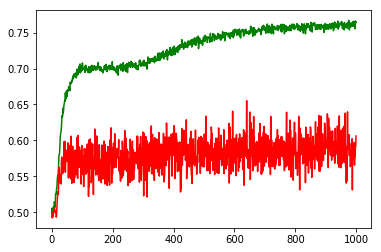

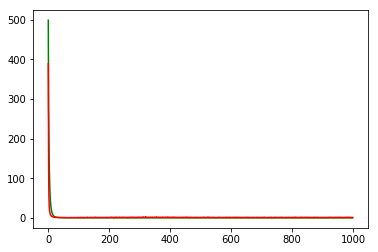

working on d,u and l,le 0.5 128 0.05 0.0001


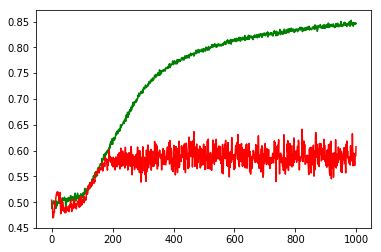

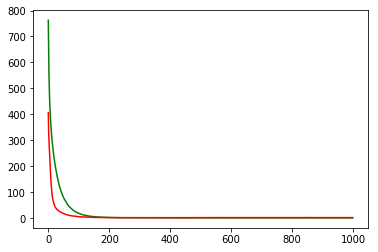

working on d,u and l,le 0.5 128 0.05 1e-05


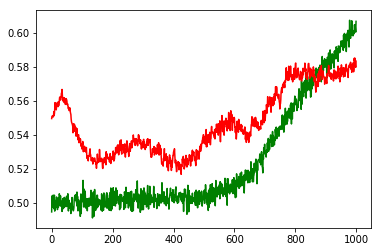

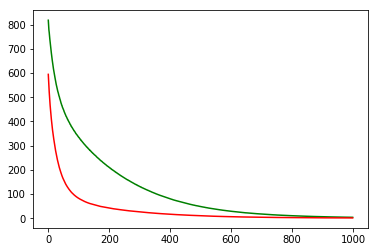

working on d,u and l,le 0.5 256 0.01 0.001


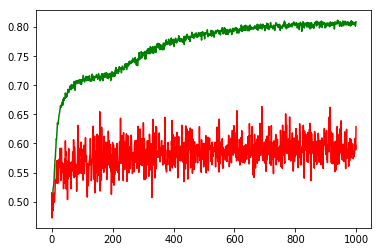

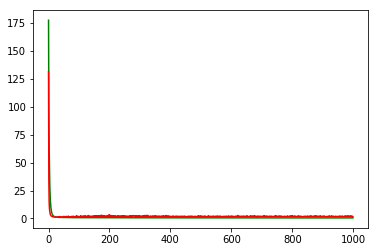

working on d,u and l,le 0.5 256 0.01 0.0001


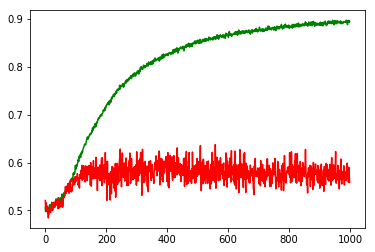

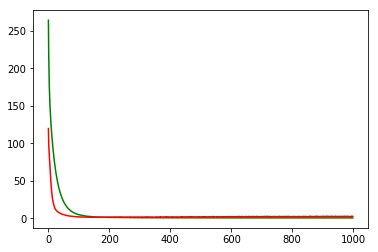

working on d,u and l,le 0.5 256 0.01 1e-05


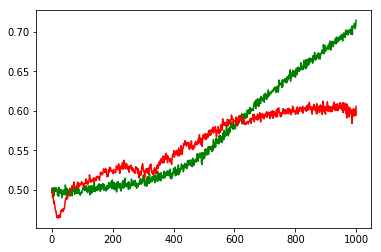

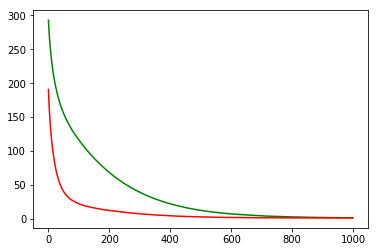

working on d,u and l,le 0.5 256 0.05 0.001


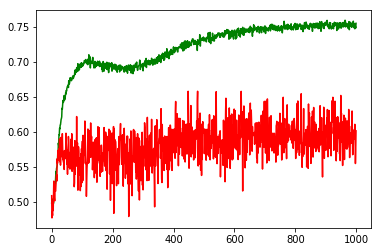

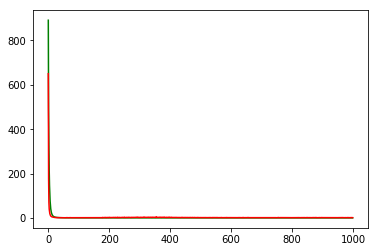

working on d,u and l,le 0.5 256 0.05 0.0001


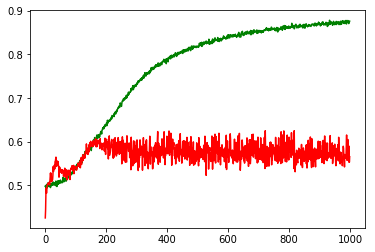

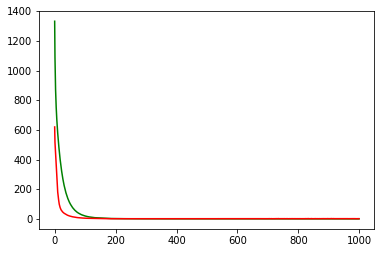

working on d,u and l,le 0.5 256 0.05 1e-05


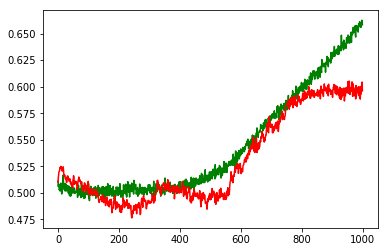

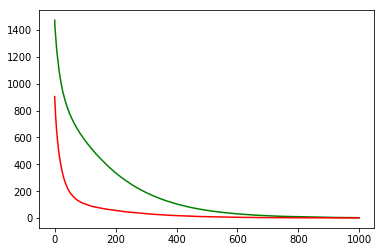

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: GOOGL


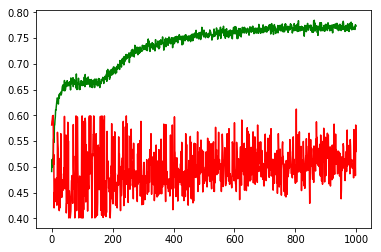

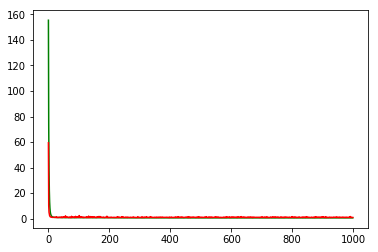

F1,score 0.6486129458388376
G-score: 0.4169761562898991
Accuracy 0.5300353371633658
Window: 140
[[109 345]
 [187 491]]
Vol pos 3.176198835253373
Vol neg 2.6864666996346718
Real Percentage of gain: 34.19463994153478
Percentage of gain: 0.420953195182313
Total gain: 476.5190169463783
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 80 151]
 [ 58 127]]
416/416 [==============================] - 0s 29us/step
[0.9252164524335128, 0.49759615384615385]
Percentile:  1
[[ 18  93]
 [ 83 166]]
360/360 [==============================] - 0s 34us/step
[0.86493092974027, 0.5111111111111111]
Percentile:  2
[[ 11  86]
 [  6 103]]
206/206 [==============================] - 0s 36us/step
[0.7730892721599746, 0.5533980582524272]
Percentile:  3
[[ 0 14]
 [32 55]]
101/101 [==============================] - 0s 41us/step
[0.9268115693979925, 0.5445544566258346]
Percentile:  4
[[ 0  0]
 [ 8 39]]
47/47 [==============================] - 0s 107us/step
[0.4505840780887198, 0.8297872403834728]
000

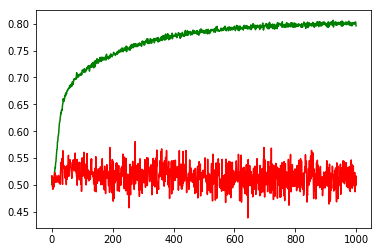

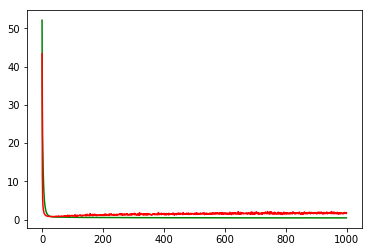

working on d,u and l,le 0.5 64 0.01 0.0001


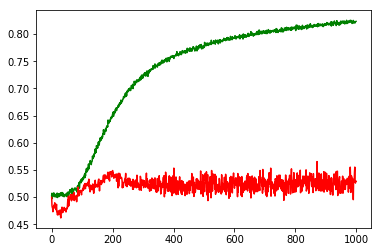

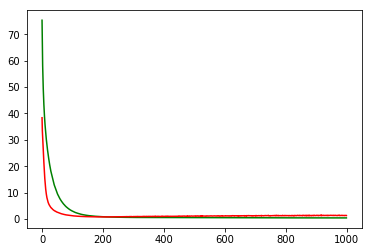

working on d,u and l,le 0.5 64 0.01 1e-05


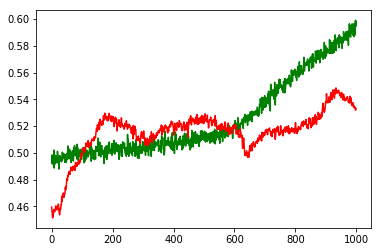

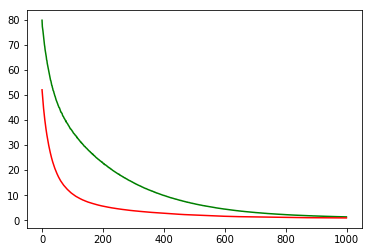

working on d,u and l,le 0.5 64 0.05 0.001


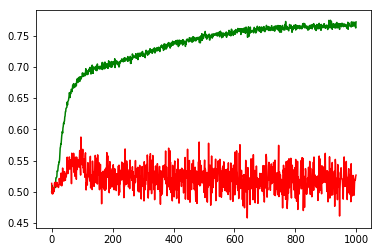

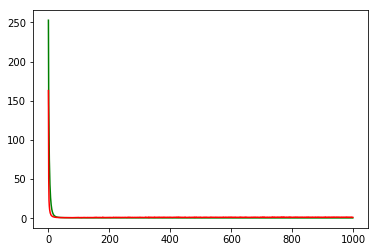

working on d,u and l,le 0.5 64 0.05 0.0001


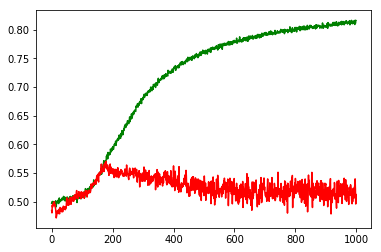

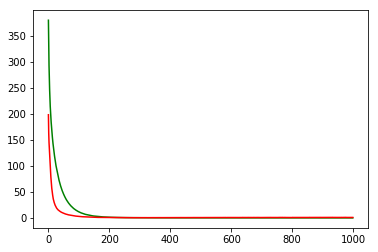

working on d,u and l,le 0.5 64 0.05 1e-05


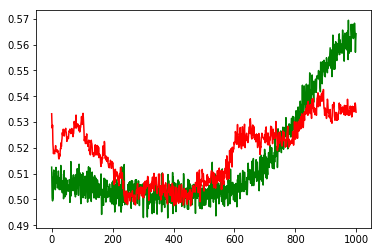

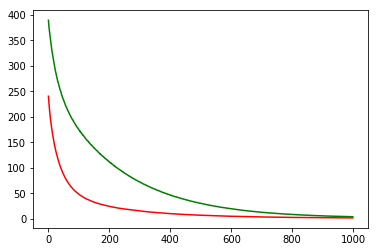

working on d,u and l,le 0.5 128 0.01 0.001


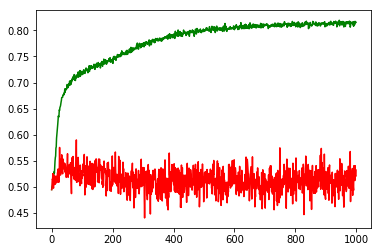

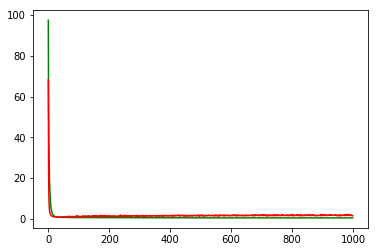

working on d,u and l,le 0.5 128 0.01 0.0001


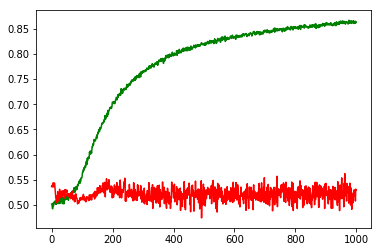

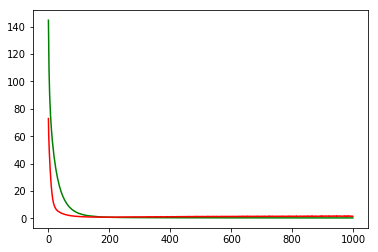

working on d,u and l,le 0.5 128 0.01 1e-05


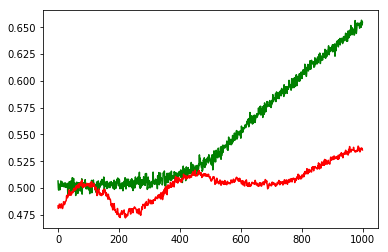

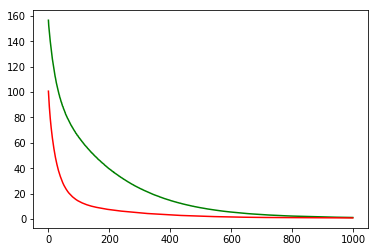

working on d,u and l,le 0.5 128 0.05 0.001


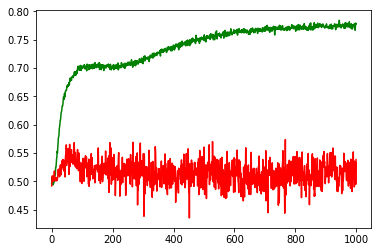

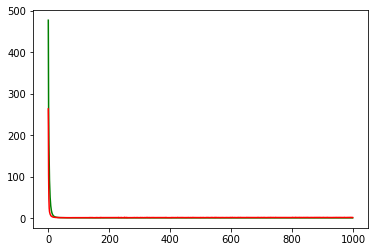

working on d,u and l,le 0.5 128 0.05 0.0001


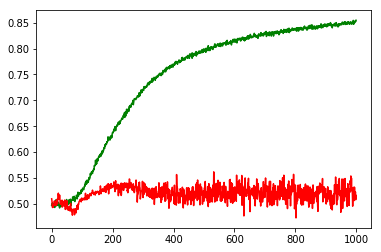

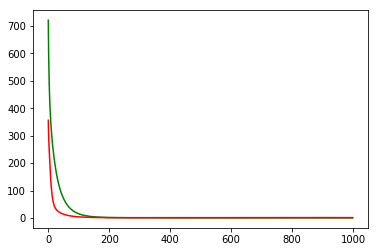

working on d,u and l,le 0.5 128 0.05 1e-05


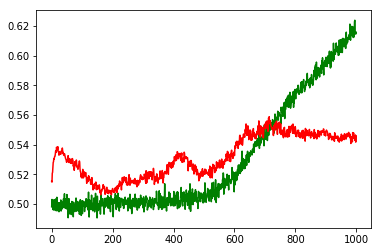

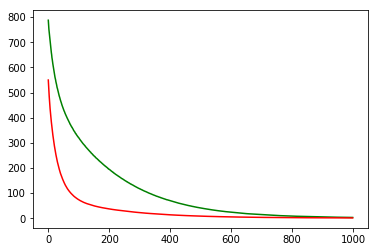

working on d,u and l,le 0.5 256 0.01 0.001


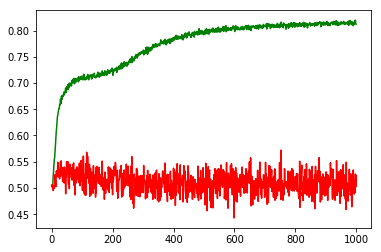

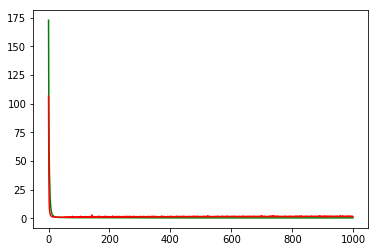

working on d,u and l,le 0.5 256 0.01 0.0001


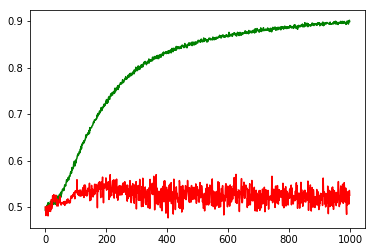

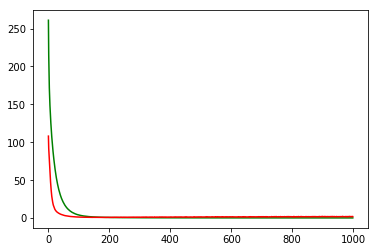

working on d,u and l,le 0.5 256 0.01 1e-05


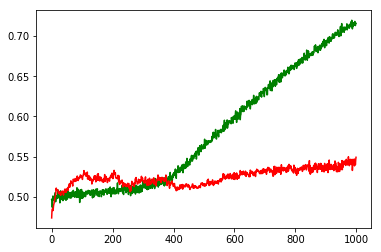

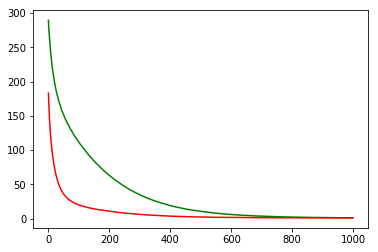

working on d,u and l,le 0.5 256 0.05 0.001


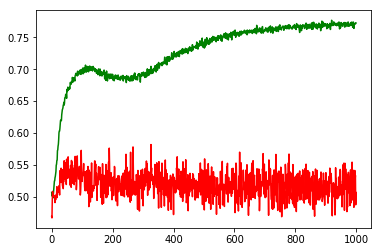

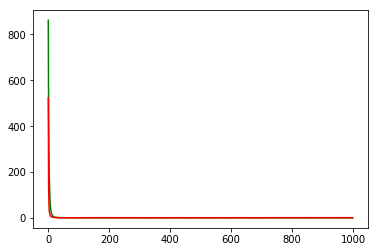

working on d,u and l,le 0.5 256 0.05 0.0001


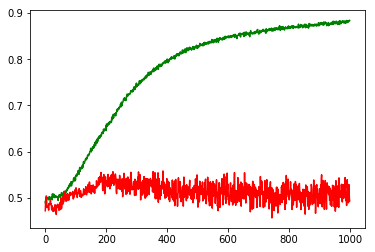

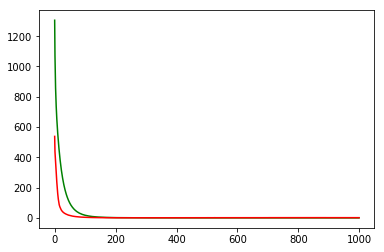

working on d,u and l,le 0.5 256 0.05 1e-05


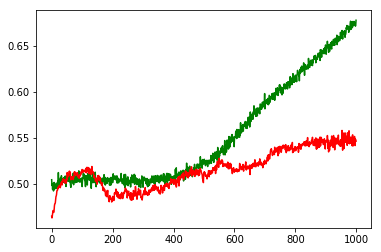

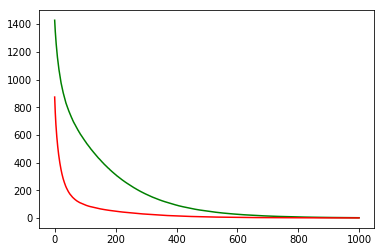

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: MSFT


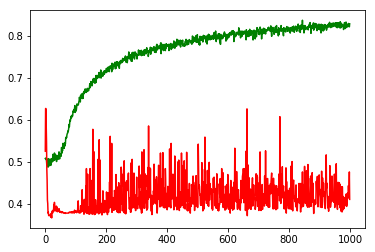

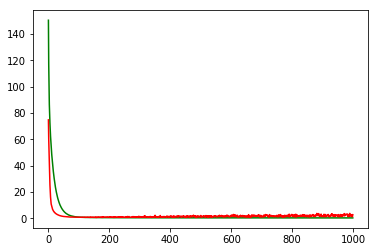

F1,score 0.15869017632241814
G-score: 0.2896903076795047
Accuracy 0.40989399019483963
Window: 140
[[401  26]
 [642  63]]
Vol pos 1.284759418156607
Vol neg 1.7632956624252252
Real Percentage of gain: -43.78653812111058
Percentage of gain: -0.5139161947662408
Total gain: -581.7531324753846
000000000000000000000000000000000000000000000000
Percentile:  0
[[285  15]
 [238  11]]
549/549 [==============================] - 0s 39us/step
[2.5512054078408157, 0.5391621129326047]
Percentile:  1
[[ 71   3]
 [219  17]]
310/310 [==============================] - 0s 31us/step
[2.925769894353805, 0.2838709681264816]
Percentile:  2
[[ 21   2]
 [115  25]]
163/163 [==============================] - 0s 35us/step
[3.184731097309136, 0.2822085889570552]
Percentile:  3
[[15  5]
 [52  9]]
81/81 [==============================] - 0s 45us/step
[3.638665829175784, 0.2962962962962963]
Percentile:  4
[[ 9  1]
 [17  1]]
28/28 [==============================] - 0s 24us/step
[2.161384344100952, 0.3571428656578064]
000

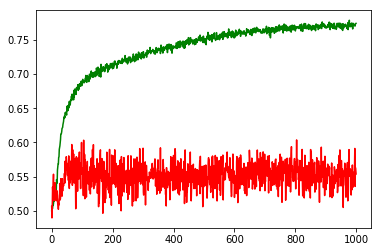

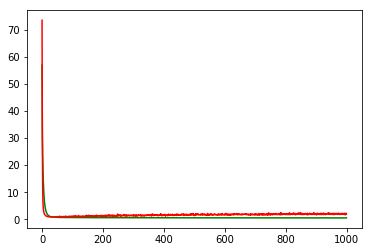

working on d,u and l,le 0.5 64 0.01 0.0001


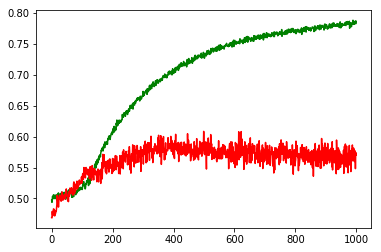

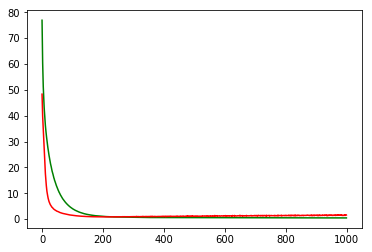

working on d,u and l,le 0.5 64 0.01 1e-05


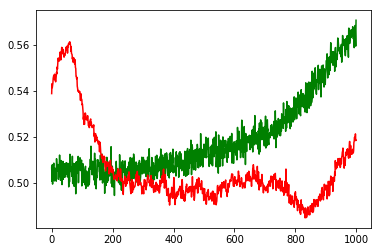

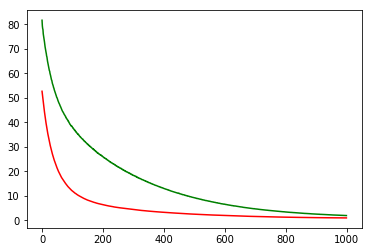

working on d,u and l,le 0.5 64 0.05 0.001


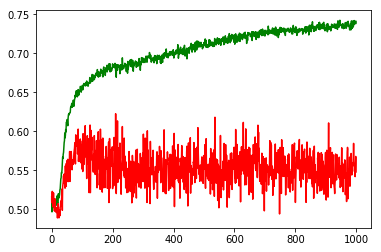

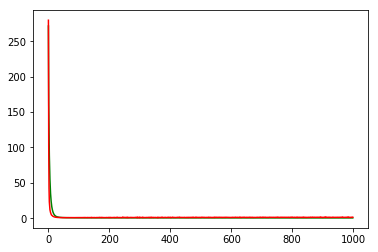

working on d,u and l,le 0.5 64 0.05 0.0001


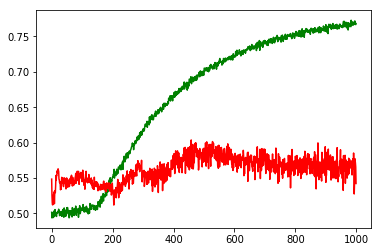

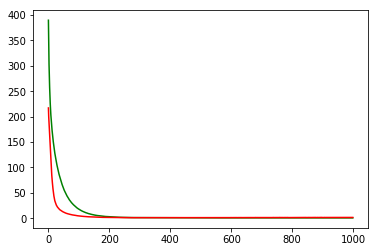

working on d,u and l,le 0.5 64 0.05 1e-05


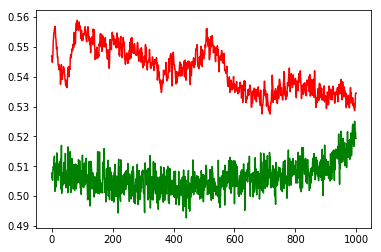

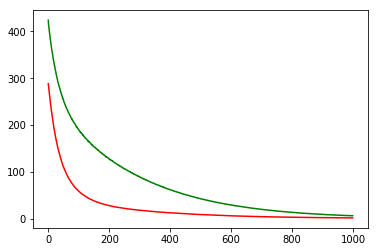

working on d,u and l,le 0.5 128 0.01 0.001


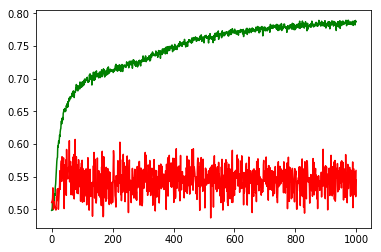

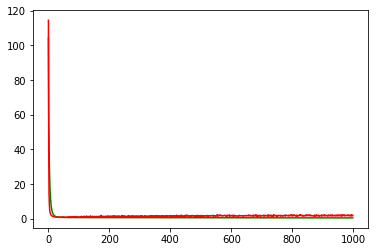

working on d,u and l,le 0.5 128 0.01 0.0001


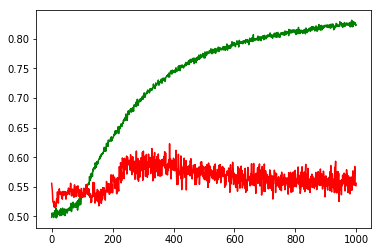

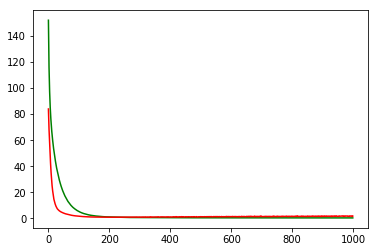

working on d,u and l,le 0.5 128 0.01 1e-05


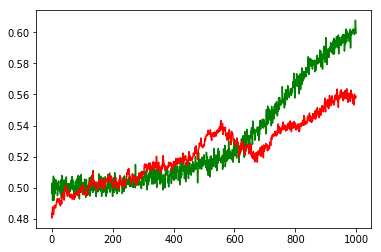

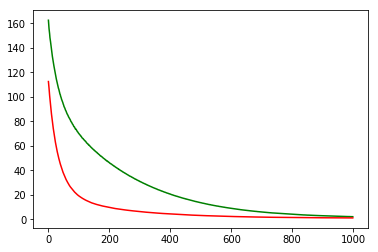

working on d,u and l,le 0.5 128 0.05 0.001


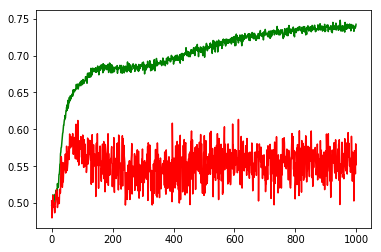

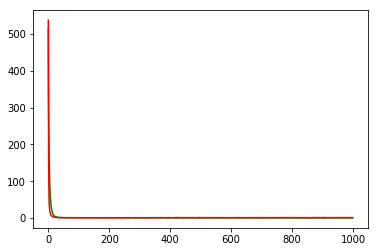

working on d,u and l,le 0.5 128 0.05 0.0001


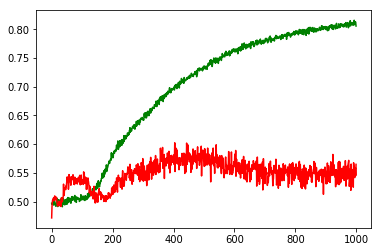

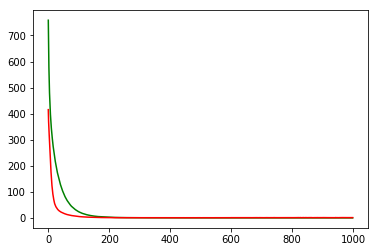

working on d,u and l,le 0.5 128 0.05 1e-05


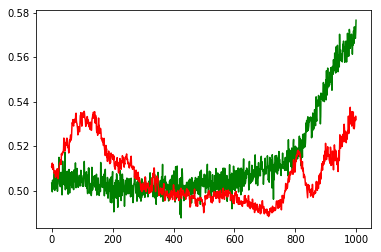

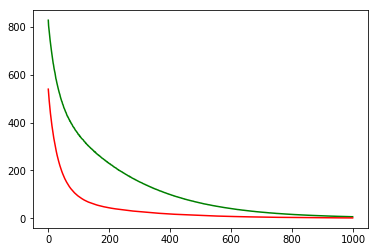

working on d,u and l,le 0.5 256 0.01 0.001


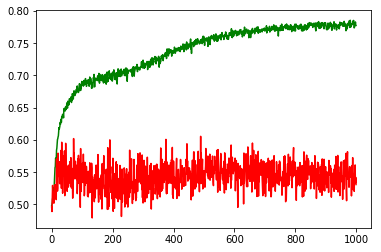

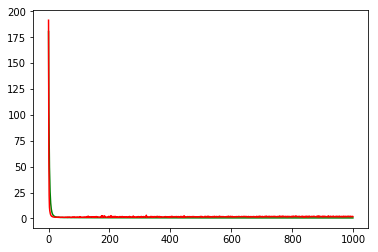

working on d,u and l,le 0.5 256 0.01 0.0001


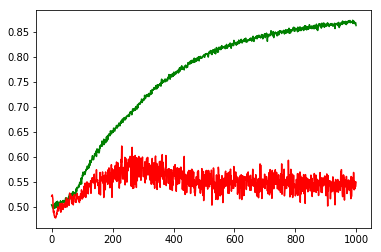

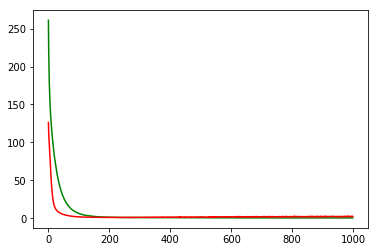

working on d,u and l,le 0.5 256 0.01 1e-05


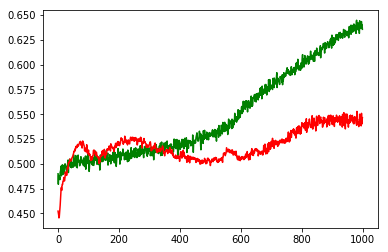

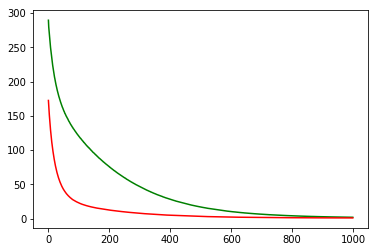

working on d,u and l,le 0.5 256 0.05 0.001


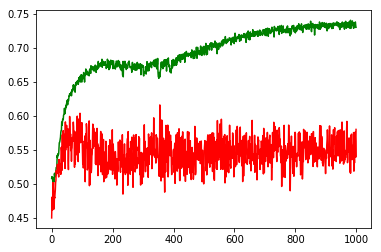

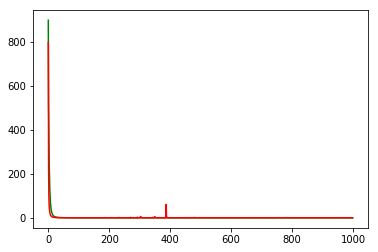

working on d,u and l,le 0.5 256 0.05 0.0001


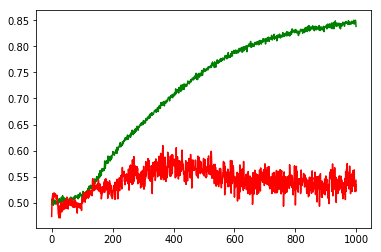

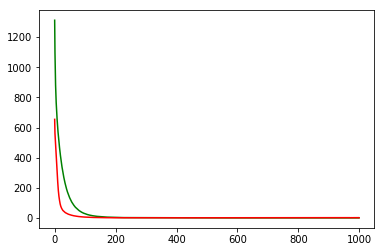

working on d,u and l,le 0.5 256 0.05 1e-05


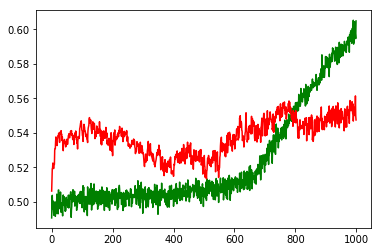

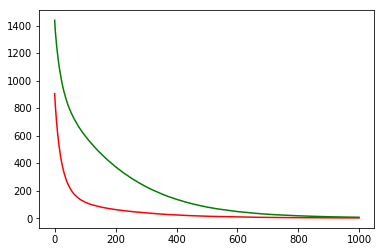

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: FB


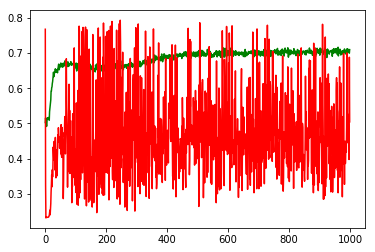

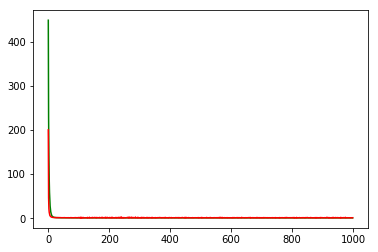

F1,score 0.5746777862016679
G-score: 0.564264147684204
Accuracy 0.5044169611307421
Window: 140
[[192  71]
 [490 379]]
Vol pos 3.2632075031834167
Vol neg 2.892911211989006
Real Percentage of gain: -59.30453493068952
Percentage of gain: 0.21233948267835548
Total gain: 240.36829439189844
000000000000000000000000000000000000000000000000
Percentile:  0
[[188  24]
 [225  85]]
522/522 [==============================] - 0s 28us/step
[0.7828823277776725, 0.5229885057471264]
Percentile:  1
[[  3  34]
 [247 184]]
468/468 [==============================] - 0s 26us/step
[1.006582832743979, 0.3995726495726496]
Percentile:  2
[[ 0 13]
 [18 74]]
105/105 [==============================] - 0s 39us/step
[0.6364987725303286, 0.7047619047619048]
Percentile:  3
[[ 0  0]
 [ 0 14]]
14/14 [==============================] - 0s 60us/step
[0.10238088667392731, 1.0]
Percentile:  4
[[ 0  0]
 [ 0 21]]
21/21 [==============================] - 0s 33us/step
[0.09352830052375793, 1.0]
00000000000000000000000000000000000

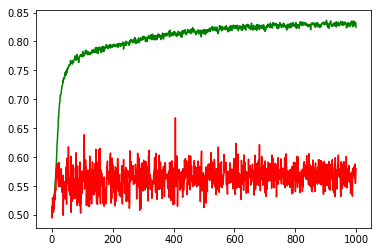

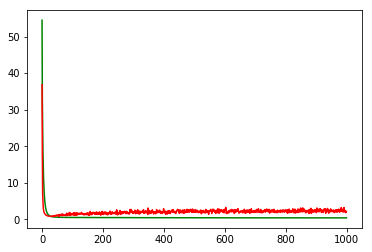

working on d,u and l,le 0.5 64 0.01 0.0001


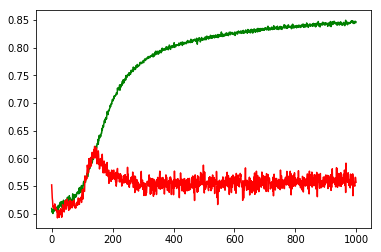

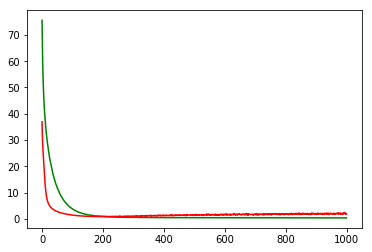

working on d,u and l,le 0.5 64 0.01 1e-05


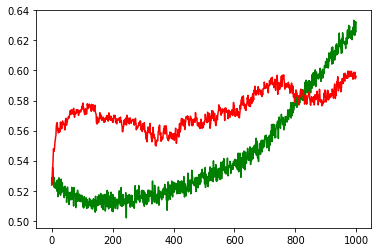

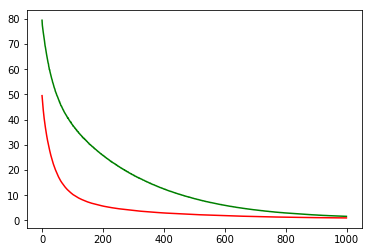

working on d,u and l,le 0.5 64 0.05 0.001


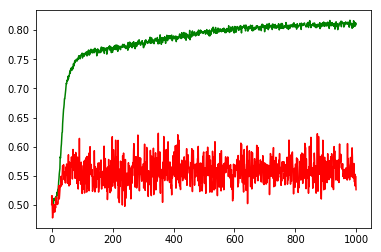

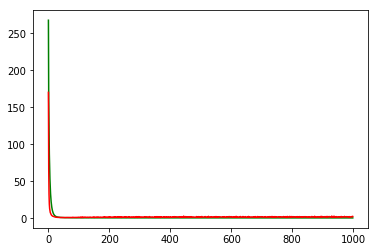

working on d,u and l,le 0.5 64 0.05 0.0001


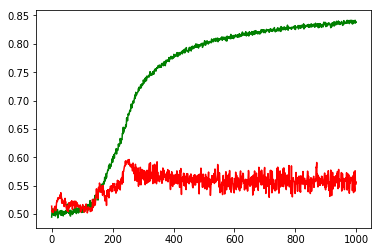

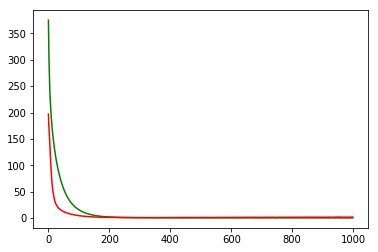

working on d,u and l,le 0.5 64 0.05 1e-05


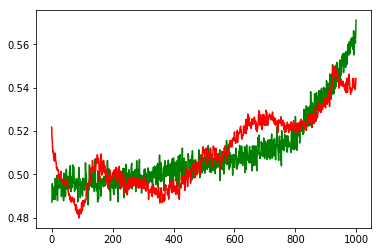

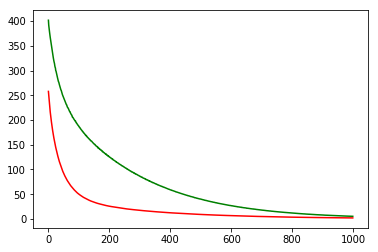

working on d,u and l,le 0.5 128 0.01 0.001


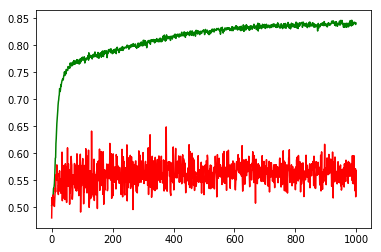

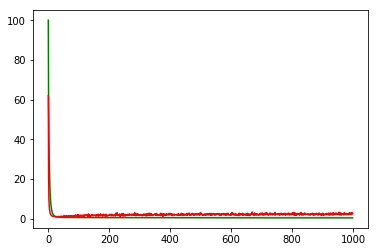

working on d,u and l,le 0.5 128 0.01 0.0001


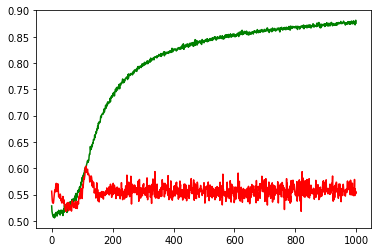

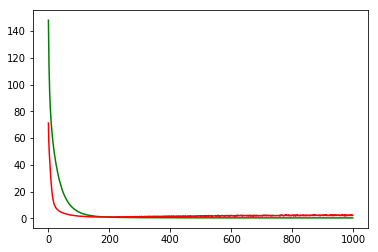

working on d,u and l,le 0.5 128 0.01 1e-05


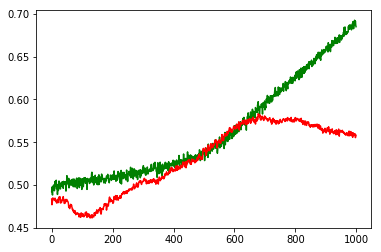

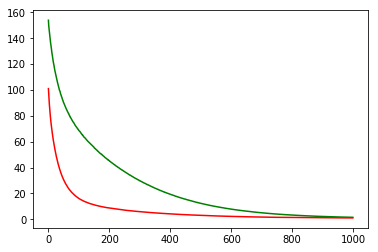

working on d,u and l,le 0.5 128 0.05 0.001


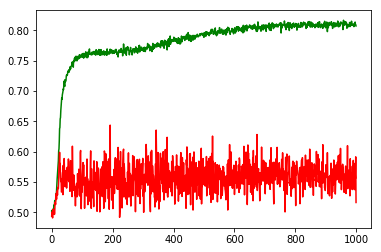

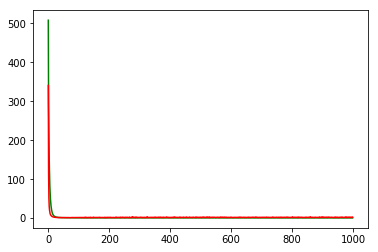

working on d,u and l,le 0.5 128 0.05 0.0001


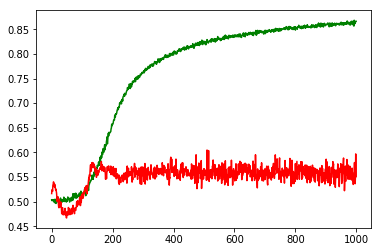

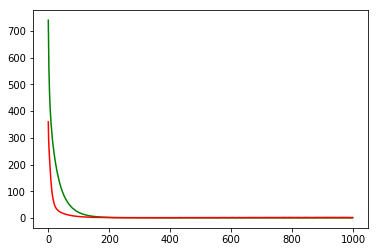

working on d,u and l,le 0.5 128 0.05 1e-05


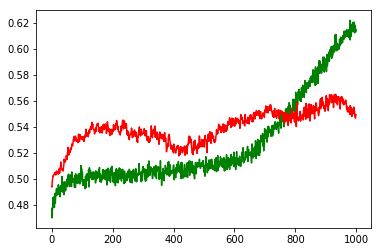

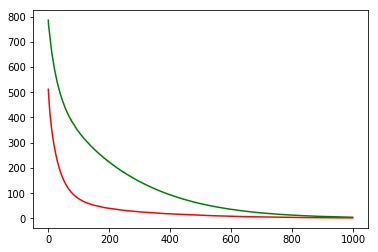

working on d,u and l,le 0.5 256 0.01 0.001


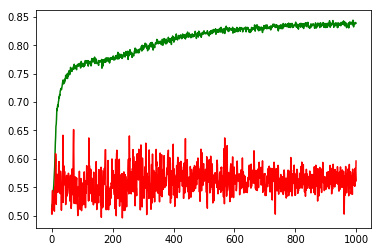

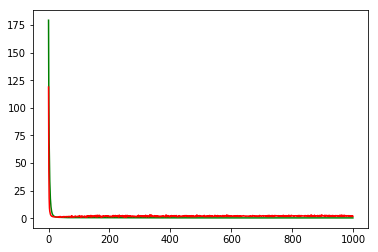

working on d,u and l,le 0.5 256 0.01 0.0001


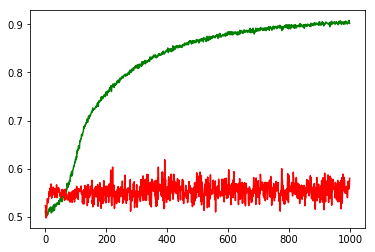

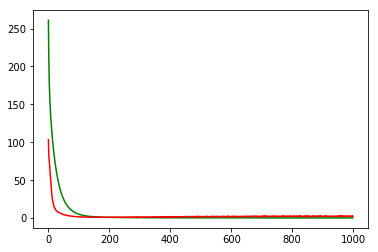

working on d,u and l,le 0.5 256 0.01 1e-05


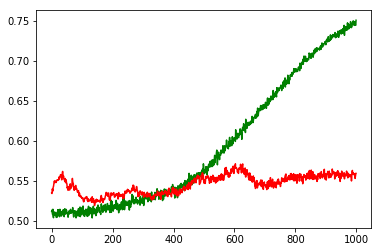

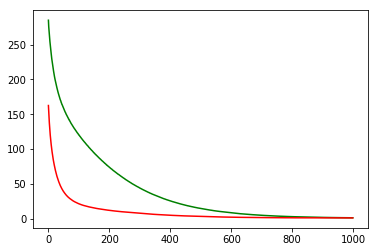

working on d,u and l,le 0.5 256 0.05 0.001


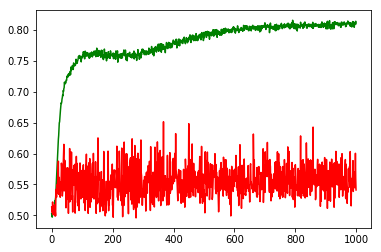

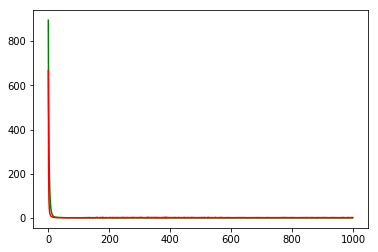

working on d,u and l,le 0.5 256 0.05 0.0001


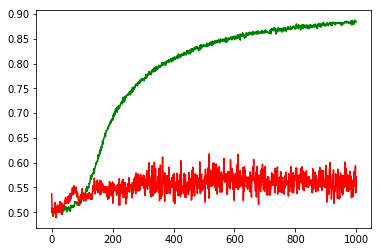

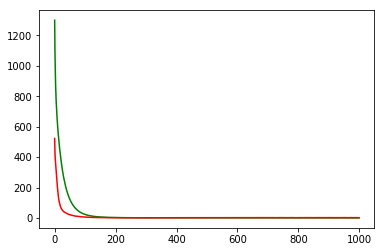

working on d,u and l,le 0.5 256 0.05 1e-05


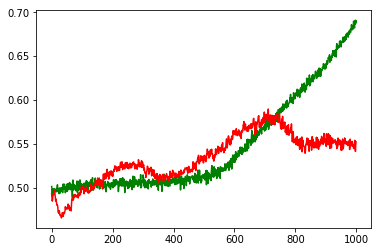

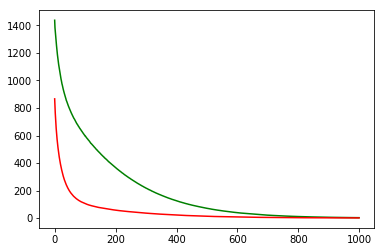

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: INTC


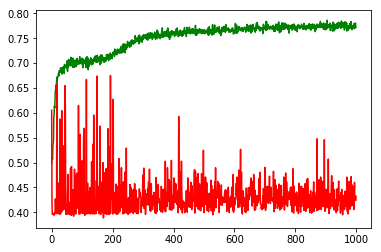

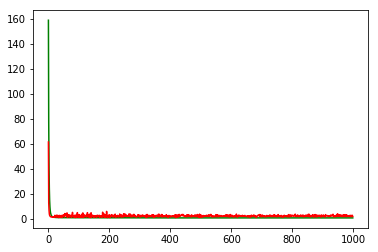

F1,score 0.15782664941785252
G-score: 0.2890387300221888
Accuracy 0.4249116607773852
Window: 140
[[420  29]
 [622  61]]
Vol pos 2.6769590592103945
Vol neg 2.0811144382642572
Real Percentage of gain: -89.65943028905994
Percentage of gain: -0.05935352635144151
Total gain: -67.1881918298318
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 97  19]
 [219  19]]
354/354 [==============================] - 0s 31us/step
[2.004854013690841, 0.327683615819209]
Percentile:  1
[[105   9]
 [209  18]]
341/341 [==============================] - 0s 35us/step
[1.8171480546140077, 0.36070381231671556]
Percentile:  2
[[126   1]
 [127  24]]
278/278 [==============================] - 0s 36us/step
[1.3408493906688348, 0.539568345323741]
Percentile:  3
[[63  0]
 [51  0]]
114/114 [==============================] - 0s 51us/step
[1.1252607543740356, 0.5526315789473685]
Percentile:  4
[[29  0]
 [14  0]]
43/43 [==============================] - 0s 84us/step
[0.7638933952291345, 0.6744186046511628]

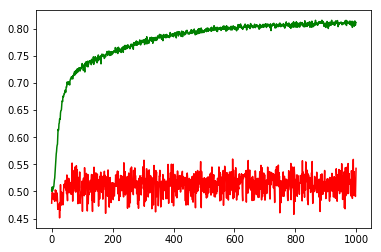

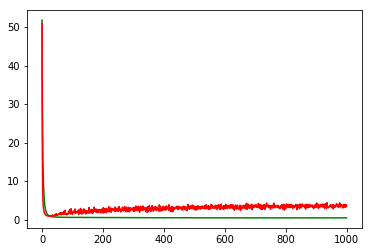

working on d,u and l,le 0.5 64 0.01 0.0001


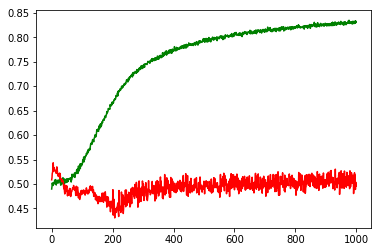

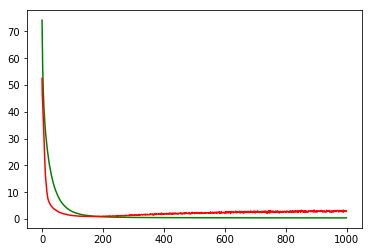

working on d,u and l,le 0.5 64 0.01 1e-05


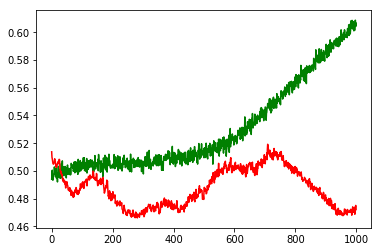

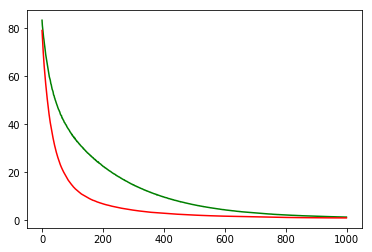

working on d,u and l,le 0.5 64 0.05 0.001


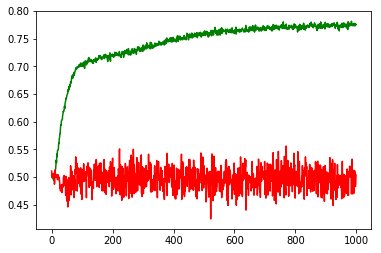

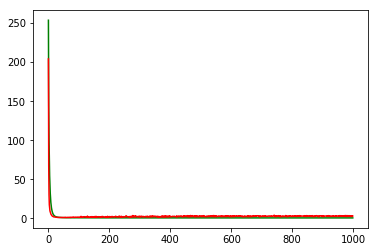

working on d,u and l,le 0.5 64 0.05 0.0001


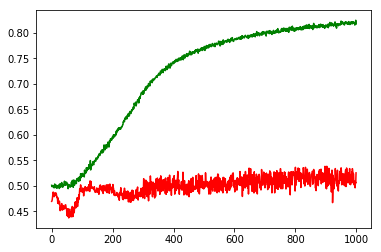

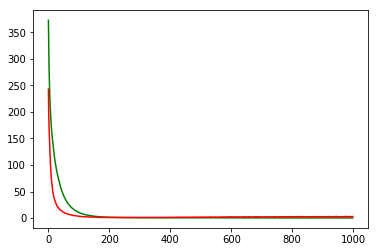

working on d,u and l,le 0.5 64 0.05 1e-05


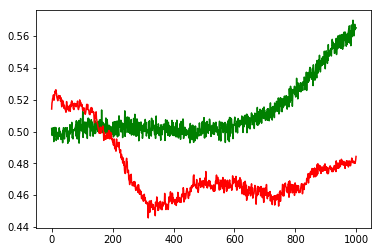

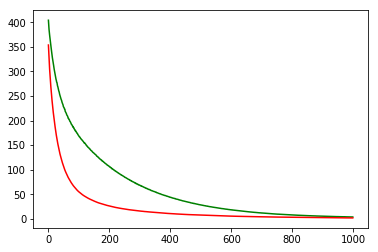

working on d,u and l,le 0.5 128 0.01 0.001


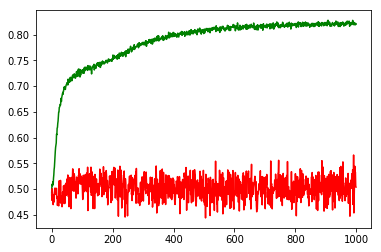

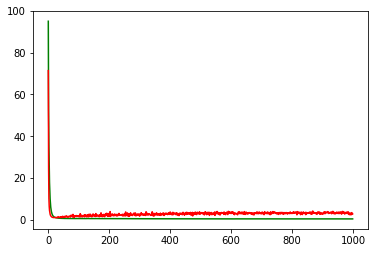

working on d,u and l,le 0.5 128 0.01 0.0001


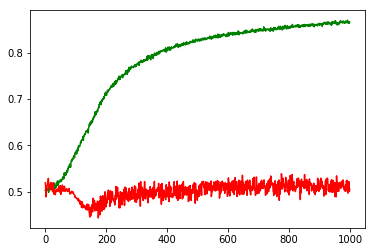

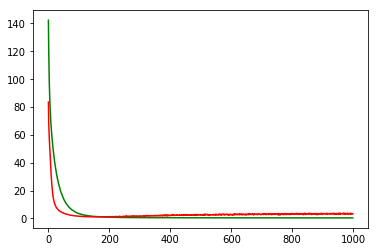

working on d,u and l,le 0.5 128 0.01 1e-05


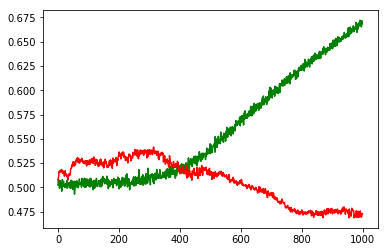

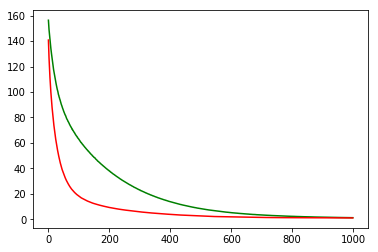

working on d,u and l,le 0.5 128 0.05 0.001


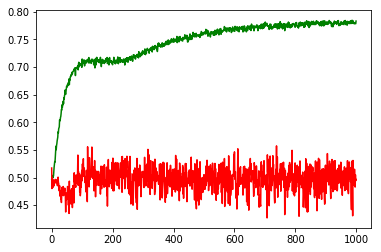

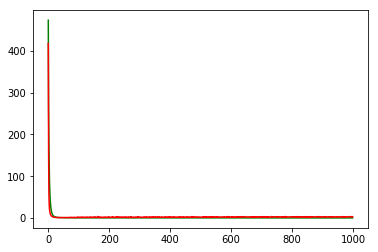

working on d,u and l,le 0.5 128 0.05 0.0001


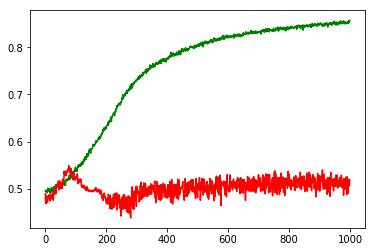

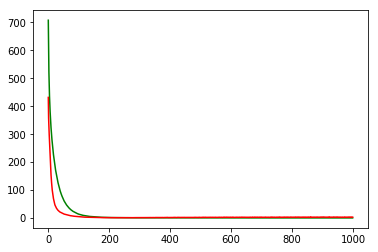

working on d,u and l,le 0.5 128 0.05 1e-05


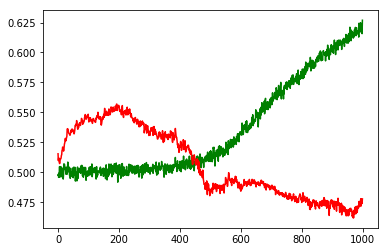

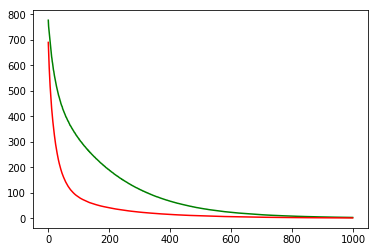

working on d,u and l,le 0.5 256 0.01 0.001


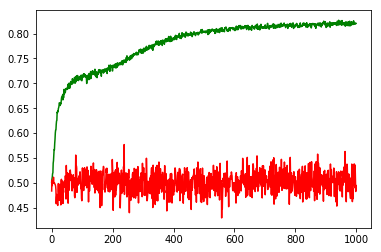

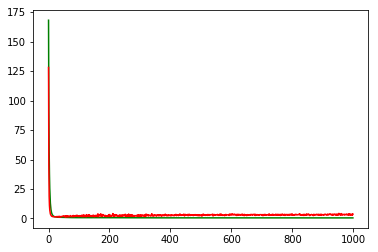

working on d,u and l,le 0.5 256 0.01 0.0001


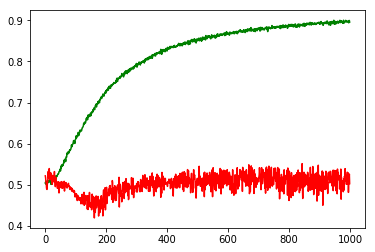

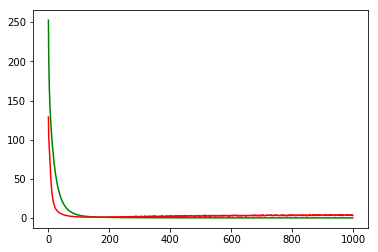

working on d,u and l,le 0.5 256 0.01 1e-05


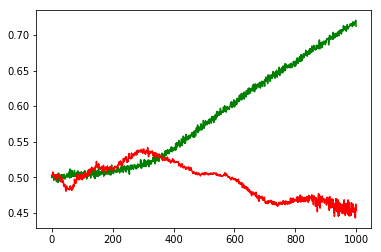

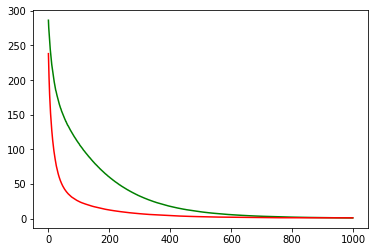

working on d,u and l,le 0.5 256 0.05 0.001


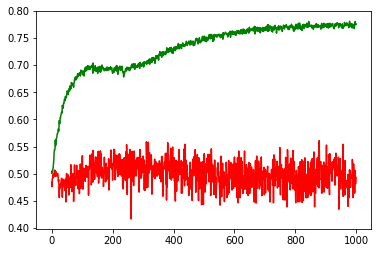

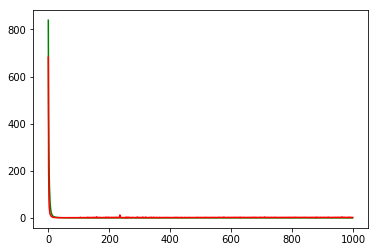

working on d,u and l,le 0.5 256 0.05 0.0001


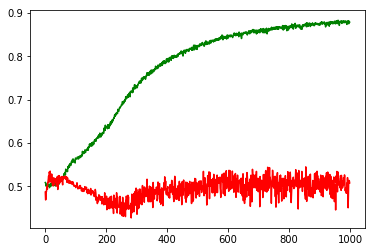

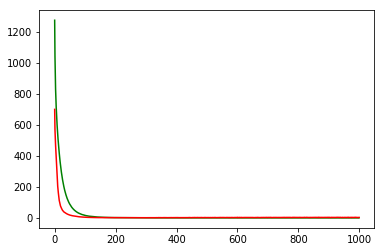

working on d,u and l,le 0.5 256 0.05 1e-05


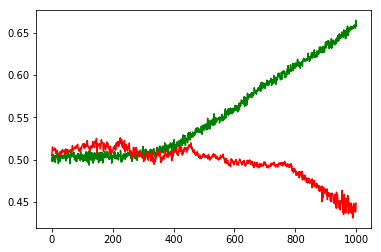

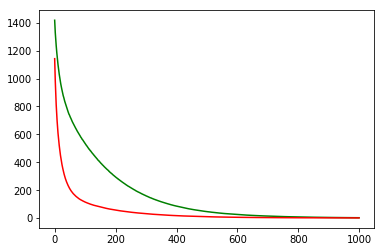

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: CSCO


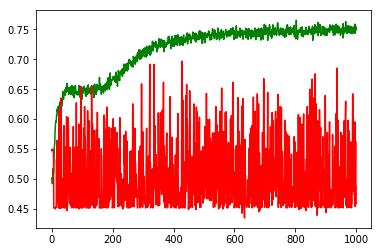

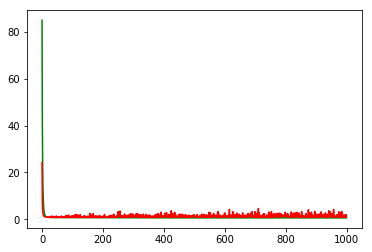

F1,score 0.4632034632034631
G-score: 0.5334661434041439
Accuracy 0.5618374541454517
Window: 140
[[422  89]
 [407 214]]
Vol pos 2.149273627982599
Vol neg 1.4528205817316882
Real Percentage of gain: 81.99176411417092
Percentage of gain: 0.5709708647155615
Total gain: 646.3390188580156
000000000000000000000000000000000000000000000000
Percentile:  0
[[172  59]
 [199  91]]
521/521 [==============================] - 0s 28us/step
[1.0805655247934034, 0.504798464605767]
Percentile:  1
[[ 77  28]
 [133  80]]
318/318 [==============================] - 0s 27us/step
[0.8830738393765576, 0.49371069107415544]
Percentile:  2
[[63  1]
 [44 37]]
145/145 [==============================] - 0s 40us/step
[0.6694921974478096, 0.6896551736469927]
Percentile:  3
[[57  1]
 [24  4]]
86/86 [==============================] - 0s 59us/step
[0.46583369339621344, 0.7093023255813954]
Percentile:  4
[[52  0]
 [ 6  0]]
58/58 [==============================] - 0s 60us/step
[0.20948610120806202, 0.896551724137931]
0000000

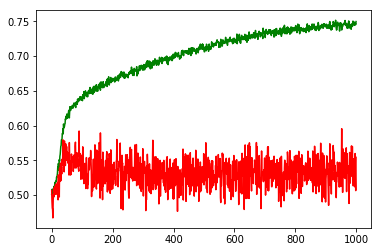

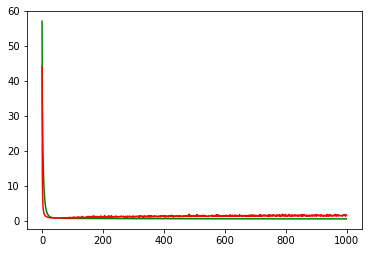

working on d,u and l,le 0.5 64 0.01 0.0001


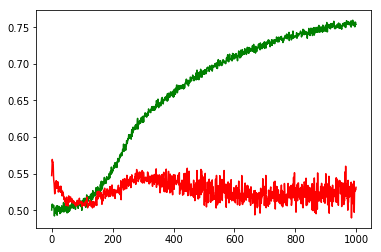

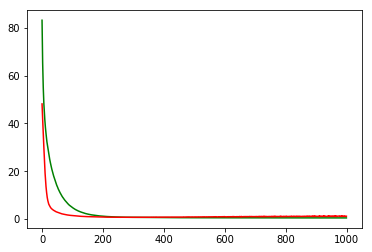

working on d,u and l,le 0.5 64 0.01 1e-05


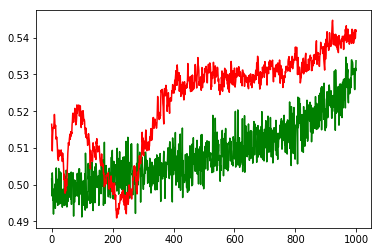

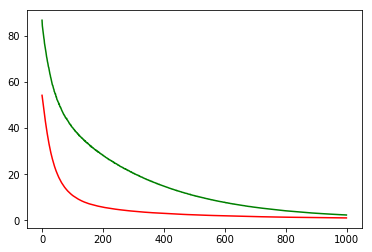

working on d,u and l,le 0.5 64 0.05 0.001


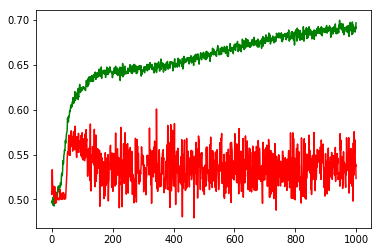

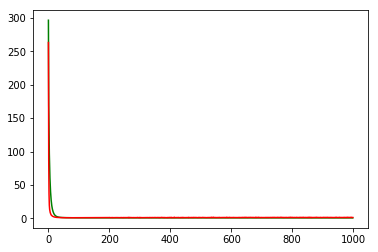

working on d,u and l,le 0.5 64 0.05 0.0001


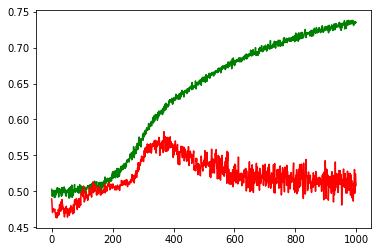

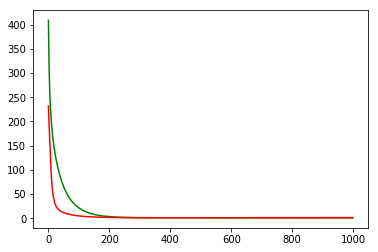

working on d,u and l,le 0.5 64 0.05 1e-05


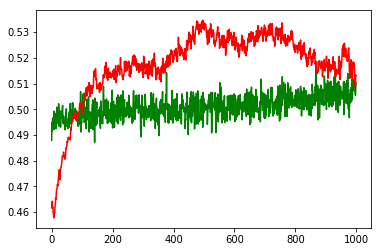

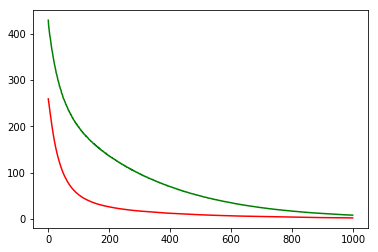

working on d,u and l,le 0.5 128 0.01 0.001


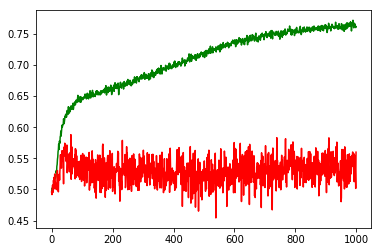

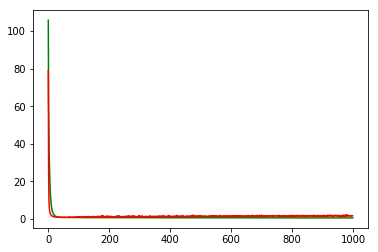

working on d,u and l,le 0.5 128 0.01 0.0001


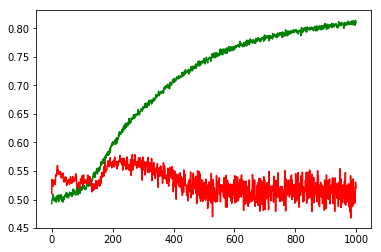

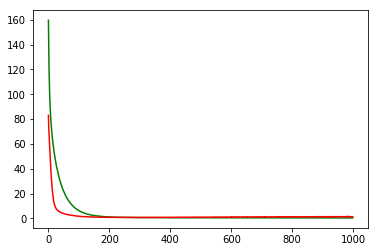

working on d,u and l,le 0.5 128 0.01 1e-05


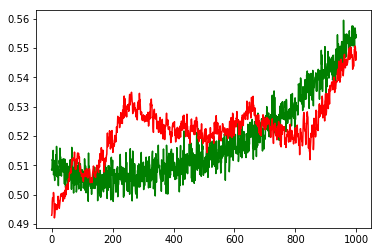

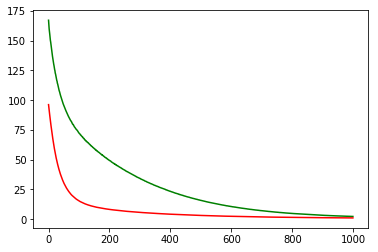

working on d,u and l,le 0.5 128 0.05 0.001


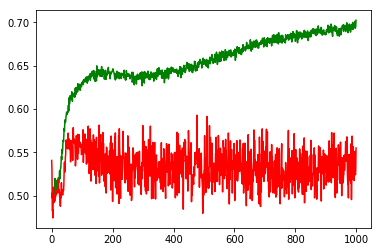

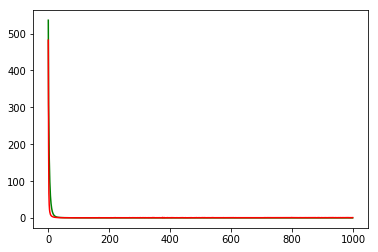

working on d,u and l,le 0.5 128 0.05 0.0001


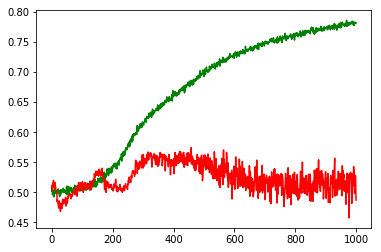

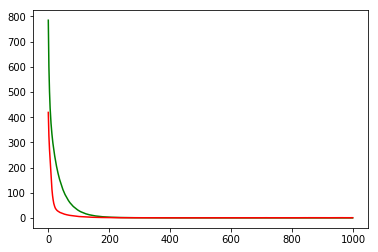

working on d,u and l,le 0.5 128 0.05 1e-05


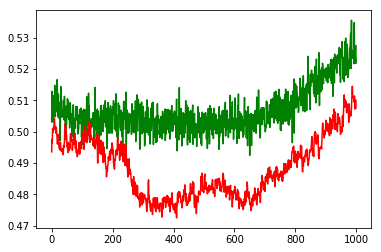

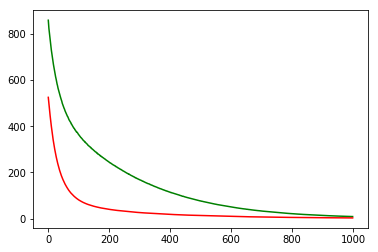

working on d,u and l,le 0.5 256 0.01 0.001


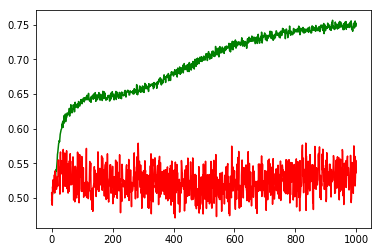

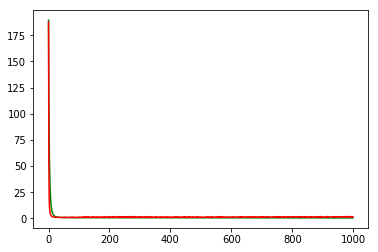

working on d,u and l,le 0.5 256 0.01 0.0001


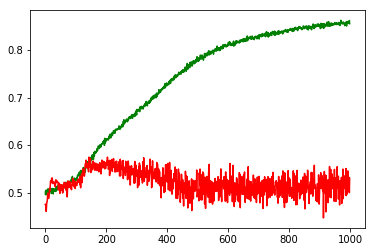

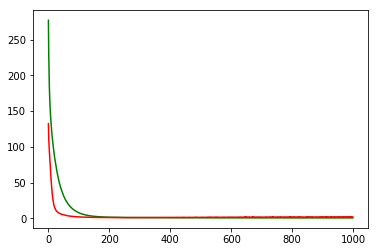

working on d,u and l,le 0.5 256 0.01 1e-05


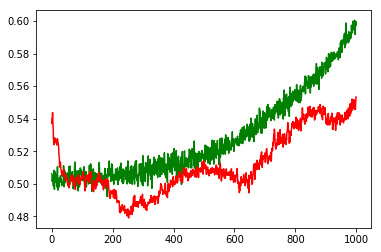

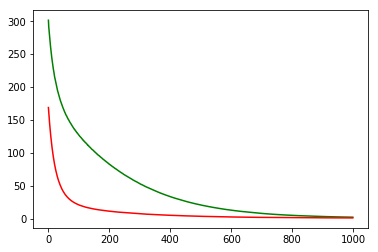

working on d,u and l,le 0.5 256 0.05 0.001


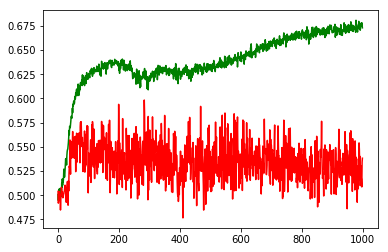

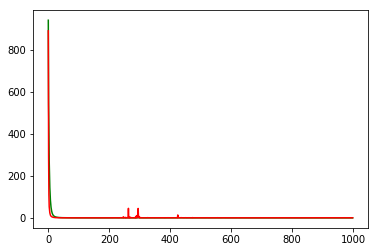

working on d,u and l,le 0.5 256 0.05 0.0001


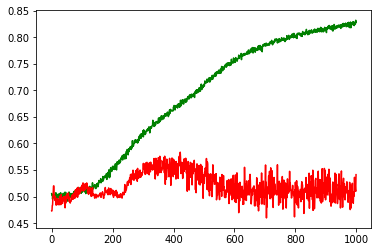

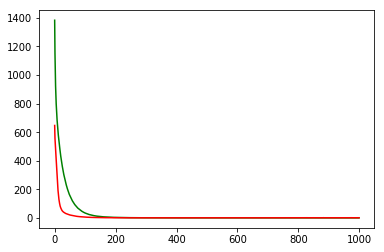

working on d,u and l,le 0.5 256 0.05 1e-05


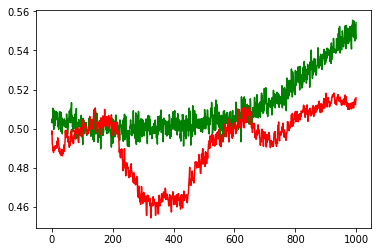

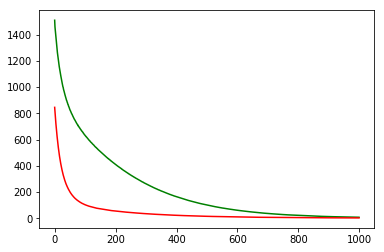

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: CMCSA


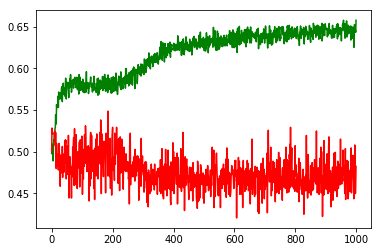

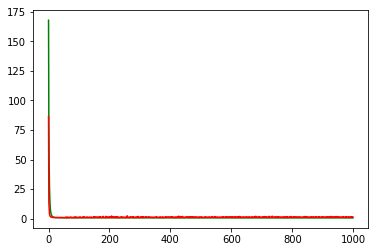

F1,score 0.5400313971742543
G-score: 0.4661895486784148
Accuracy 0.4823321542133291
Window: 140
[[202 339]
 [247 344]]
Vol pos 2.9654546175247387
Vol neg 2.7587791795746424
Real Percentage of gain: 57.371446378062174
Percentage of gain: 0.002202846234776391
Total gain: 2.493621937766875
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 71 156]
 [ 95 105]]
427/427 [==============================] - 0s 47us/step
[1.3360363705655172, 0.41217798601827244]
Percentile:  1
[[ 94 104]
 [130 174]]
502/502 [==============================] - 0s 27us/step
[1.1698135394024185, 0.5338645415952006]
Percentile:  2
[[19 23]
 [18 56]]
116/116 [==============================] - 0s 37us/step
[0.6745331616237246, 0.6465517200272659]
Percentile:  3
[[18 42]
 [ 3  9]]
72/72 [==============================] - 0s 37us/step
[0.907771646976471, 0.375]
Percentile:  4
[[ 0 13]
 [ 0  0]]
13/13 [==============================] - 0s 44us/step
[1.2064403295516968, 0.0]
00000000000000000000000000000000

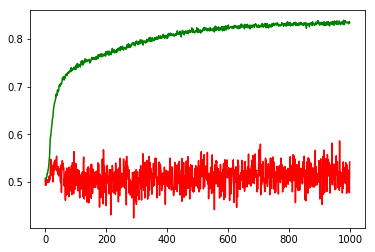

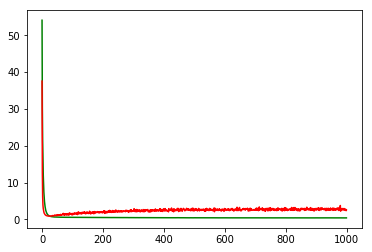

working on d,u and l,le 0.5 64 0.01 0.0001


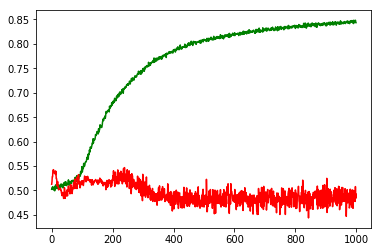

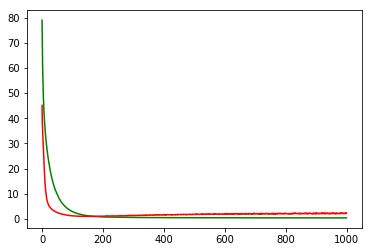

working on d,u and l,le 0.5 64 0.01 1e-05


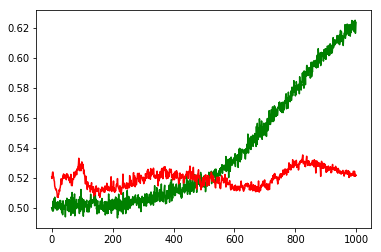

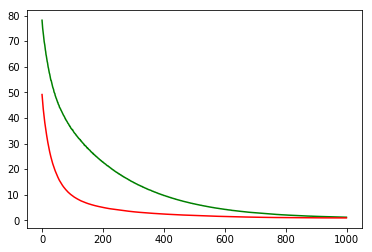

working on d,u and l,le 0.5 64 0.05 0.001


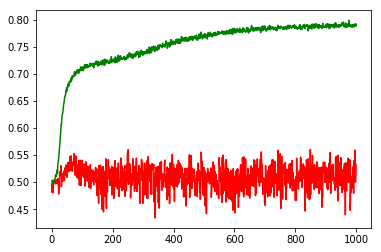

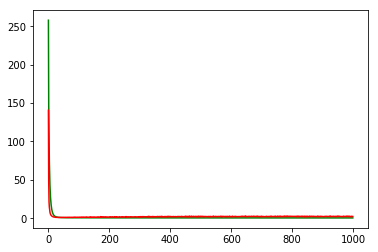

working on d,u and l,le 0.5 64 0.05 0.0001


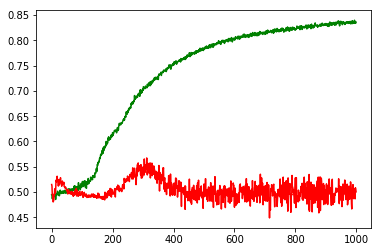

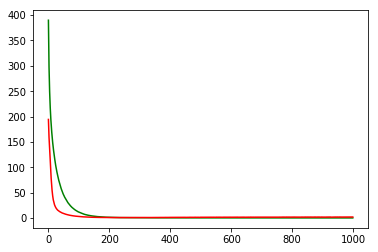

working on d,u and l,le 0.5 64 0.05 1e-05


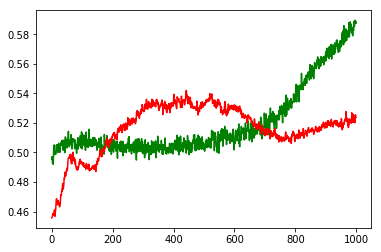

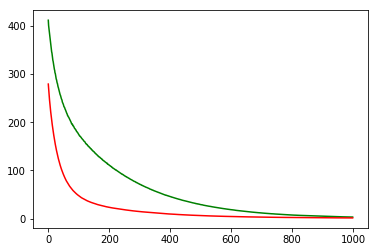

working on d,u and l,le 0.5 128 0.01 0.001


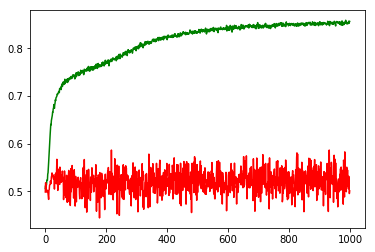

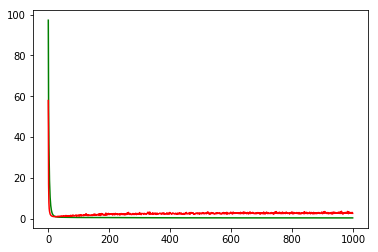

working on d,u and l,le 0.5 128 0.01 0.0001


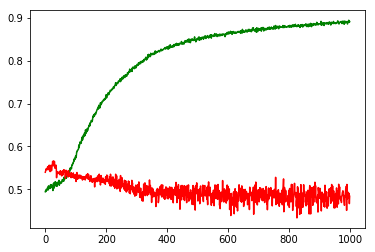

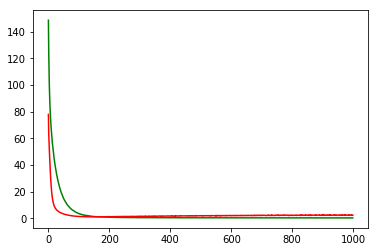

working on d,u and l,le 0.5 128 0.01 1e-05


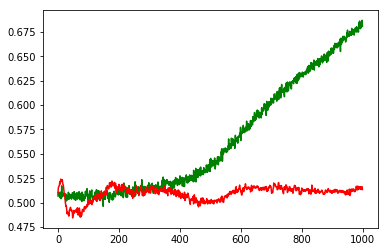

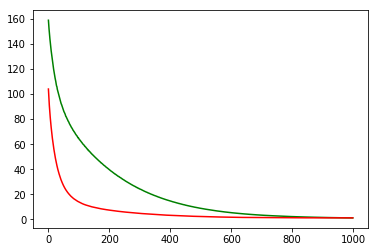

working on d,u and l,le 0.5 128 0.05 0.001


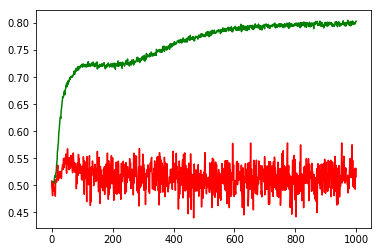

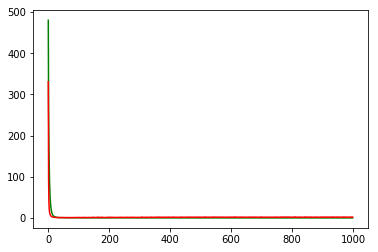

working on d,u and l,le 0.5 128 0.05 0.0001


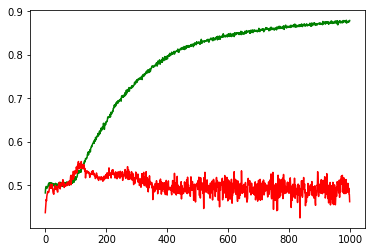

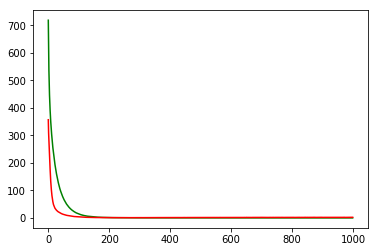

working on d,u and l,le 0.5 128 0.05 1e-05


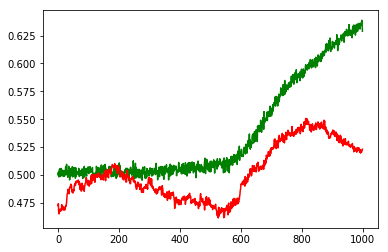

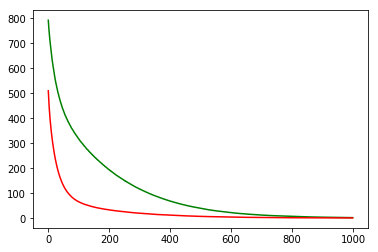

working on d,u and l,le 0.5 256 0.01 0.001


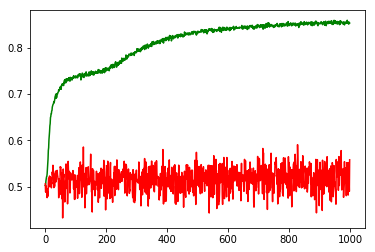

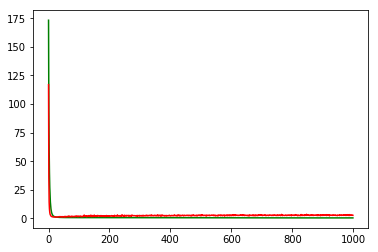

working on d,u and l,le 0.5 256 0.01 0.0001


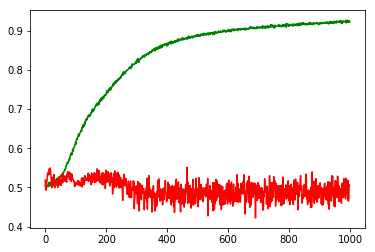

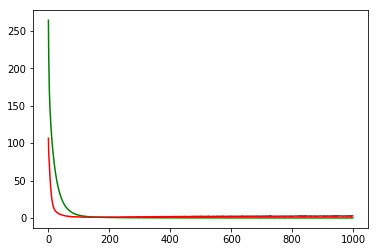

working on d,u and l,le 0.5 256 0.01 1e-05


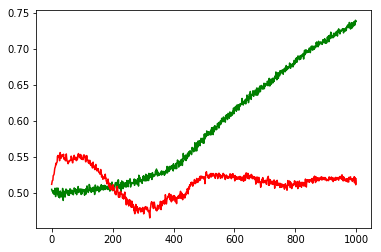

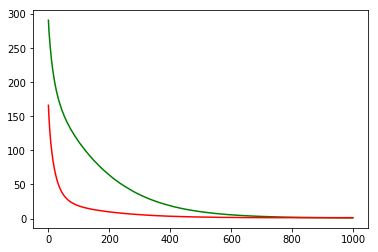

working on d,u and l,le 0.5 256 0.05 0.001


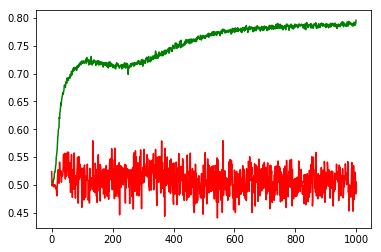

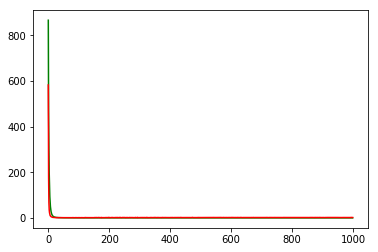

working on d,u and l,le 0.5 256 0.05 0.0001


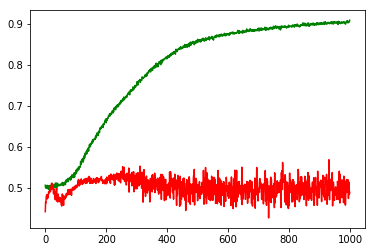

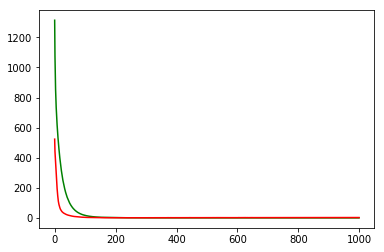

working on d,u and l,le 0.5 256 0.05 1e-05


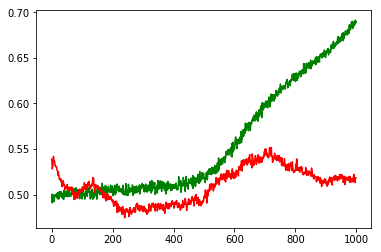

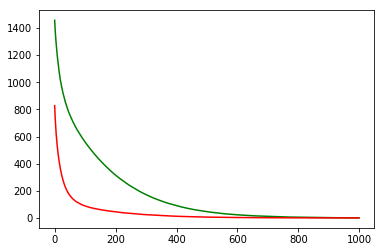

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: NVDA


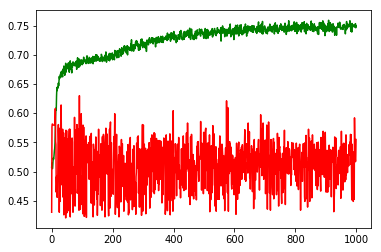

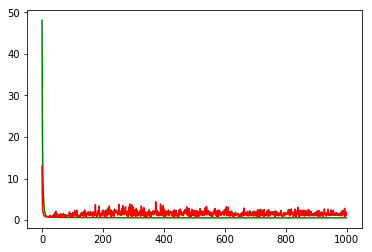

F1,score 0.4259681093394077
G-score: 0.5139071995565907
Accuracy 0.5547703167574987
Window: 140
[[441  35]
 [469 187]]
Vol pos 3.9033534314274223
Vol neg 3.6080138756275617
Real Percentage of gain: 76.68985955577563
Percentage of gain: 0.5590697540813869
Total gain: 632.86696162013
000000000000000000000000000000000000000000000000
Percentile:  0
[[290  22]
 [217  29]]
558/558 [==============================] - 0s 29us/step
[1.4429881313154775, 0.5716845871727099]
Percentile:  1
[[111   7]
 [152  68]]
338/338 [==============================] - 0s 27us/step
[0.9690952783990541, 0.5295857988165681]
Percentile:  2
[[26  5]
 [67  5]]
103/103 [==============================] - 0s 34us/step
[1.30722038259784, 0.30097087378640774]
Percentile:  3
[[14  1]
 [23 42]]
80/80 [==============================] - 0s 49us/step
[0.5584988236427307, 0.7]
Percentile:  4
[[ 0  0]
 [ 9 42]]
51/51 [==============================] - 0s 67us/step
[0.4967346518647437, 0.8235294222831726]
0000000000000000000000000

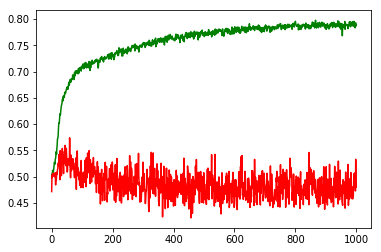

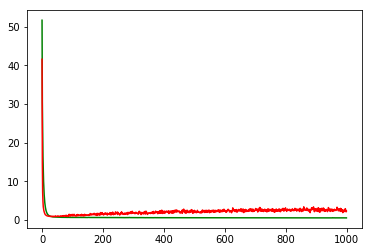

working on d,u and l,le 0.5 64 0.01 0.0001


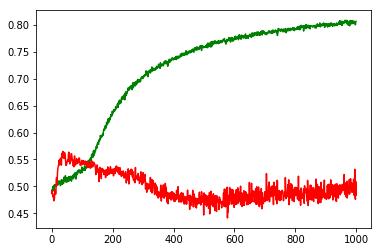

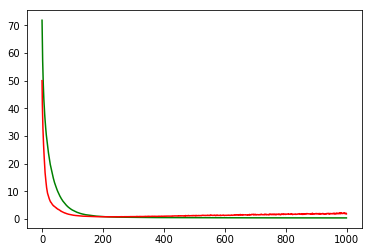

working on d,u and l,le 0.5 64 0.01 1e-05


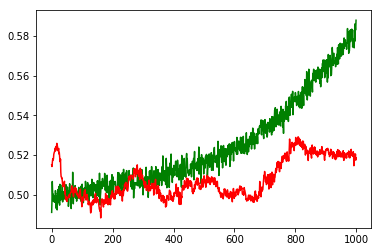

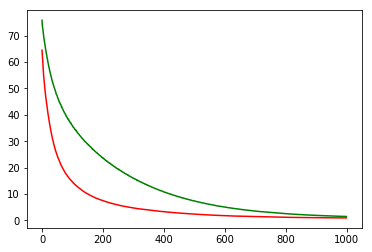

working on d,u and l,le 0.5 64 0.05 0.001


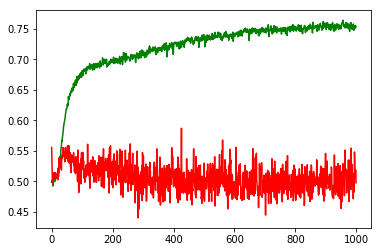

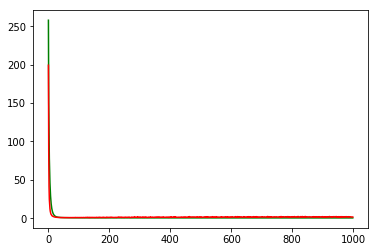

working on d,u and l,le 0.5 64 0.05 0.0001


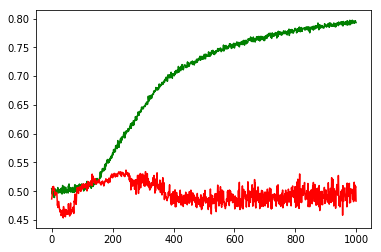

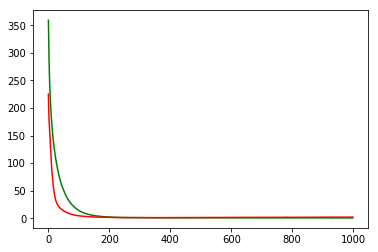

working on d,u and l,le 0.5 64 0.05 1e-05


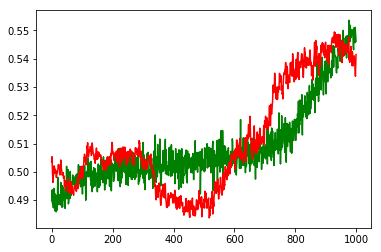

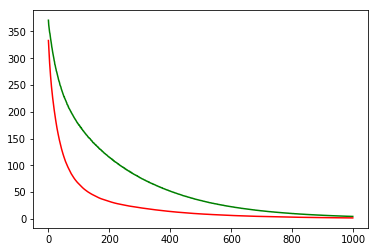

working on d,u and l,le 0.5 128 0.01 0.001


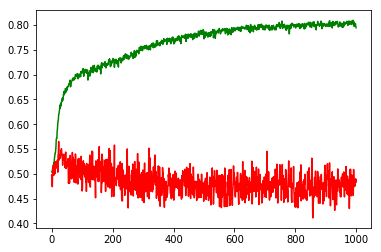

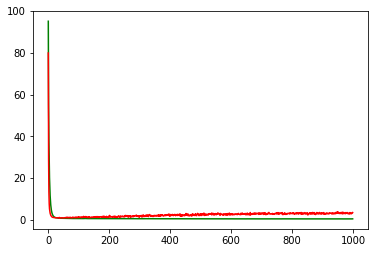

working on d,u and l,le 0.5 128 0.01 0.0001


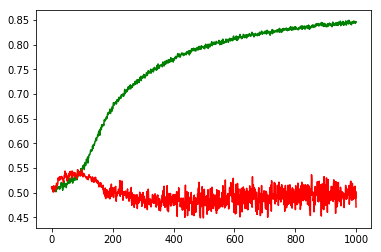

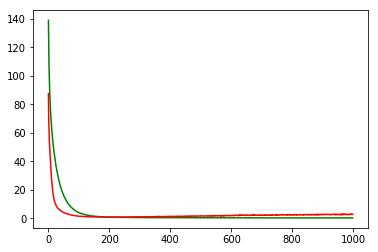

working on d,u and l,le 0.5 128 0.01 1e-05


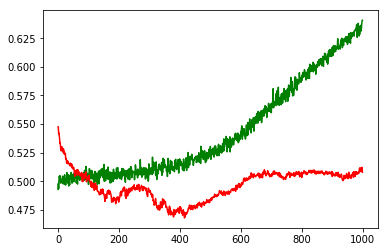

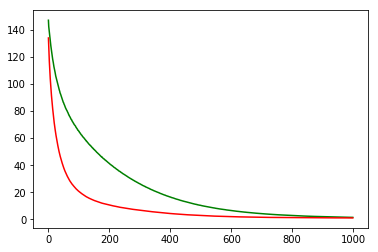

working on d,u and l,le 0.5 128 0.05 0.001


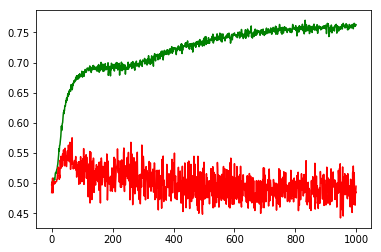

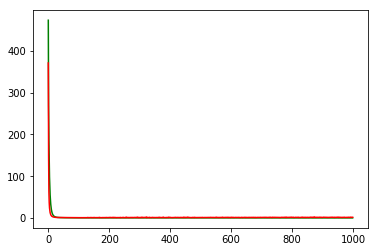

working on d,u and l,le 0.5 128 0.05 0.0001


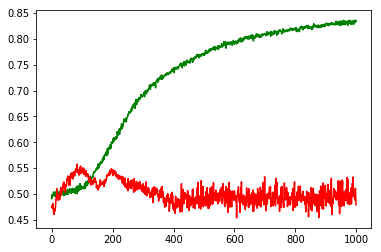

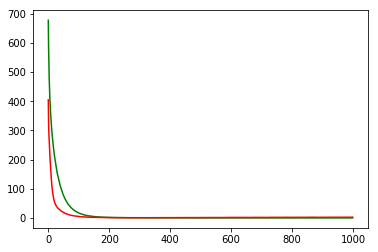

working on d,u and l,le 0.5 128 0.05 1e-05


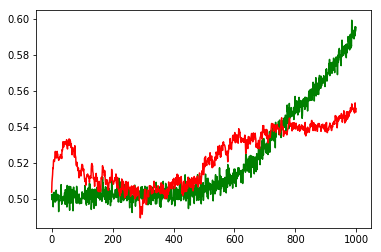

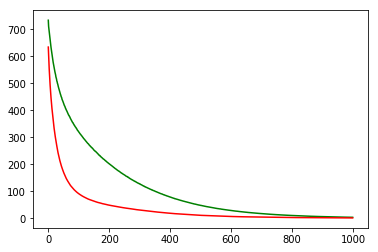

working on d,u and l,le 0.5 256 0.01 0.001


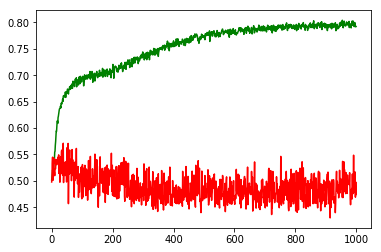

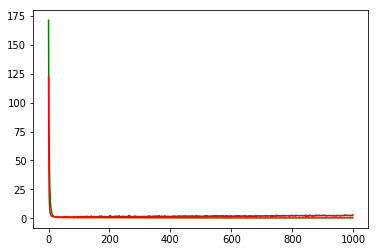

working on d,u and l,le 0.5 256 0.01 0.0001


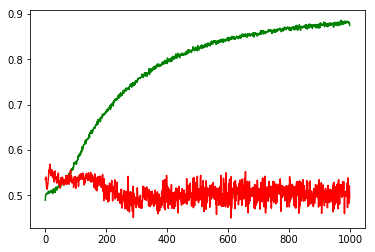

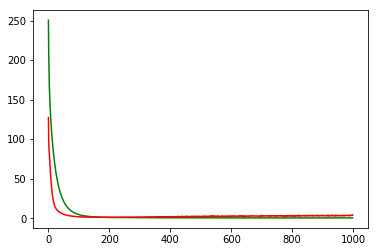

working on d,u and l,le 0.5 256 0.01 1e-05


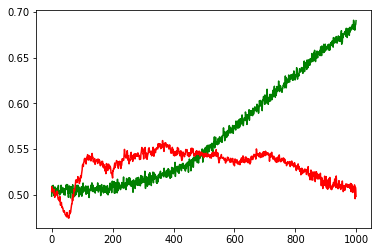

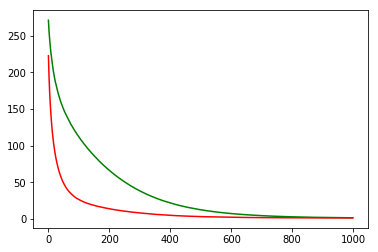

working on d,u and l,le 0.5 256 0.05 0.001


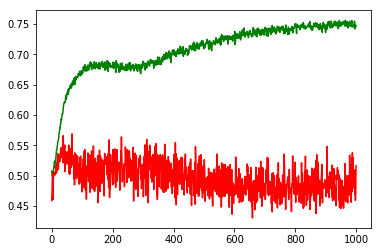

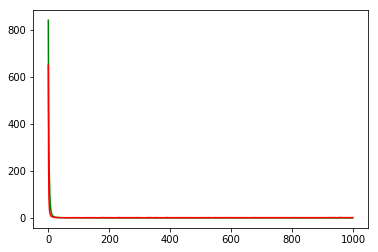

working on d,u and l,le 0.5 256 0.05 0.0001


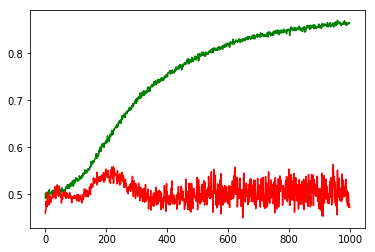

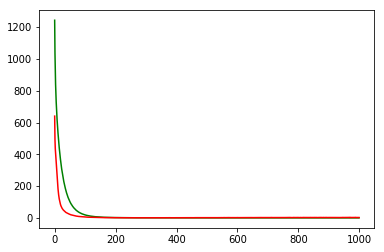

working on d,u and l,le 0.5 256 0.05 1e-05


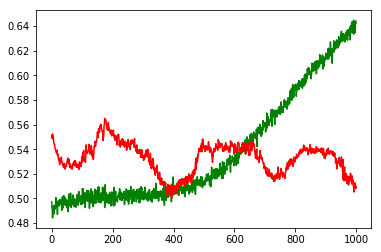

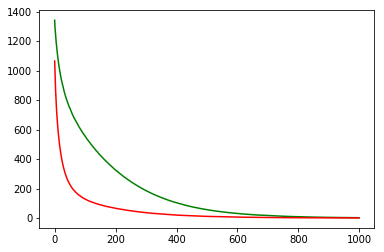

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: NFLX


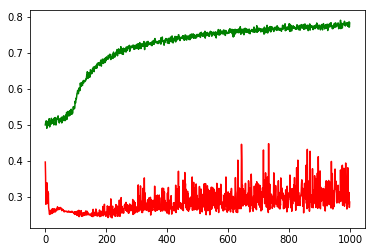

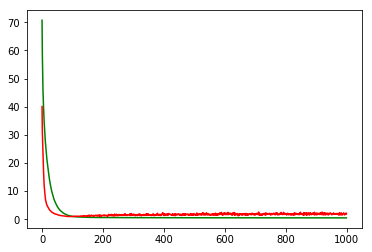

F1,score 0.22731614135625597
G-score: 0.31287229078996465
Accuracy 0.2853356891249178
Window: 140
[[204  93]
 [716 119]]
Vol pos 3.0614159256446487
Vol neg 4.848402038657863
Real Percentage of gain: -322.0799978918887
Percentage of gain: -2.5914486795856795
Total gain: -2933.5199052909893
000000000000000000000000000000000000000000000000
Percentile:  0
[[125  45]
 [218  72]]
460/460 [==============================] - 0s 25us/step
[1.6108349281808605, 0.42826086963000504]
Percentile:  1
[[ 44  16]
 [237  31]]
328/328 [==============================] - 0s 30us/step
[1.7212352171176817, 0.22865853658536586]
Percentile:  2
[[ 20  18]
 [194   1]]
233/233 [==============================] - 0s 32us/step
[2.8376883652077214, 0.09012875536480687]
Percentile:  3
[[13 14]
 [55 15]]
97/97 [==============================] - 0s 45us/step
[2.2225692235317425, 0.28865979381443296]
Percentile:  4
[[ 1  0]
 [11  0]]
12/12 [==============================] - 0s 48us/step
[3.312505006790161, 0.0833333358168

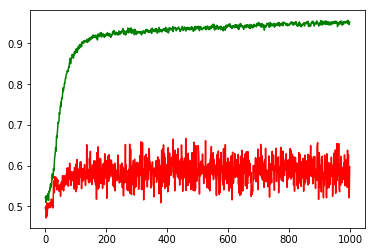

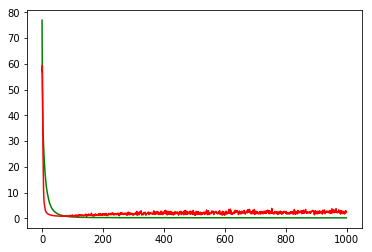

working on d,u and l,le 0.5 64 0.01 0.0001


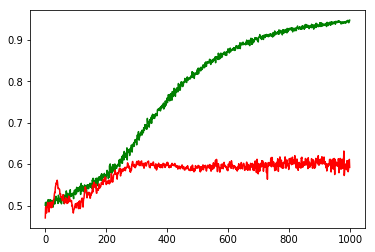

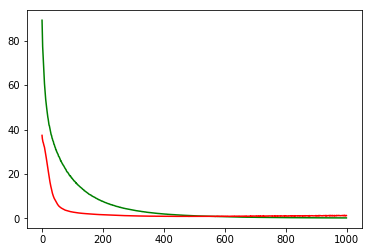

working on d,u and l,le 0.5 64 0.01 1e-05


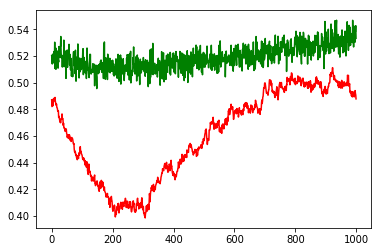

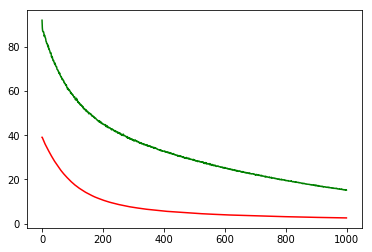

working on d,u and l,le 0.5 64 0.05 0.001


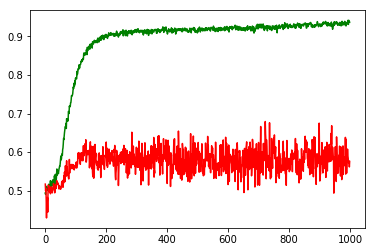

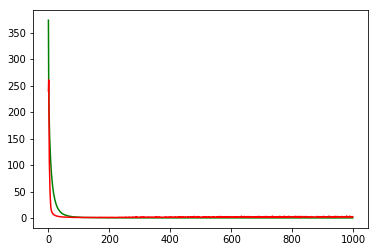

working on d,u and l,le 0.5 64 0.05 0.0001


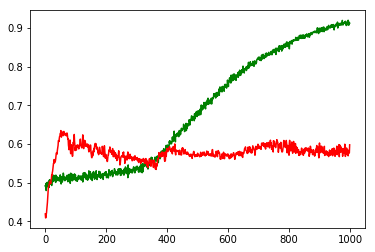

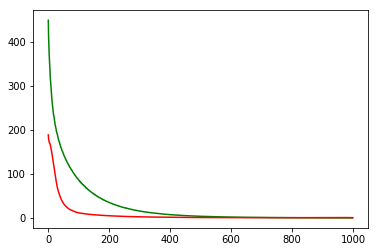

working on d,u and l,le 0.5 64 0.05 1e-05


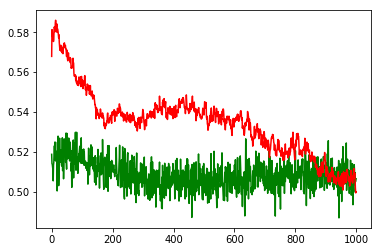

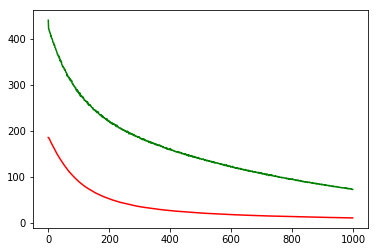

working on d,u and l,le 0.5 128 0.01 0.001


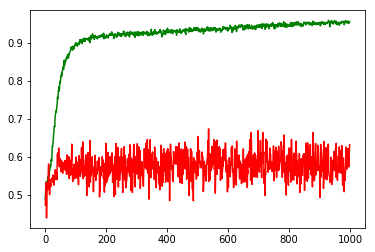

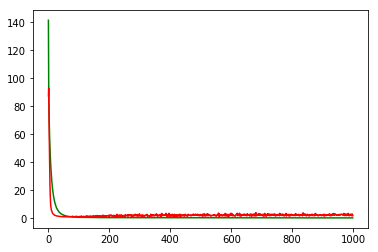

working on d,u and l,le 0.5 128 0.01 0.0001


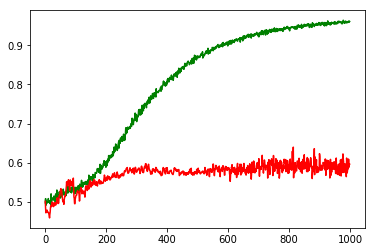

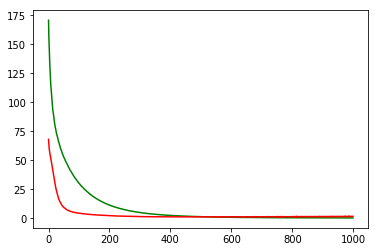

working on d,u and l,le 0.5 128 0.01 1e-05


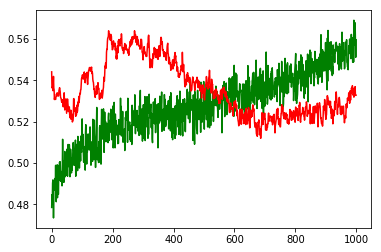

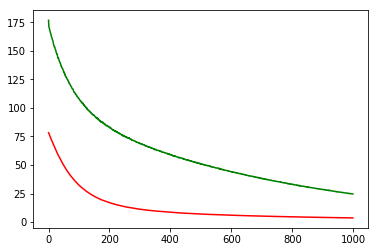

working on d,u and l,le 0.5 128 0.05 0.001


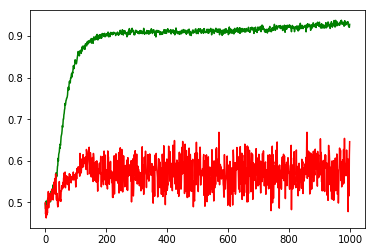

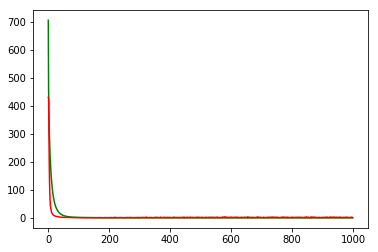

working on d,u and l,le 0.5 128 0.05 0.0001


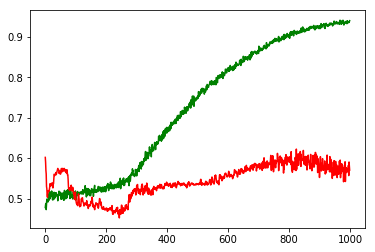

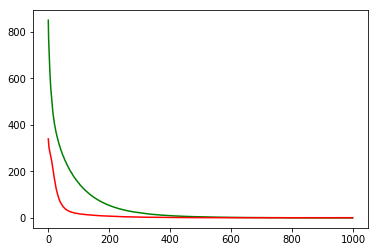

working on d,u and l,le 0.5 128 0.05 1e-05


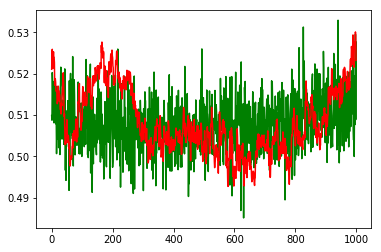

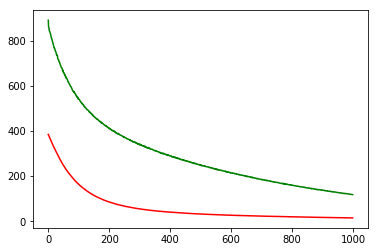

working on d,u and l,le 0.5 256 0.01 0.001


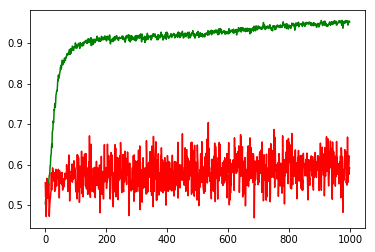

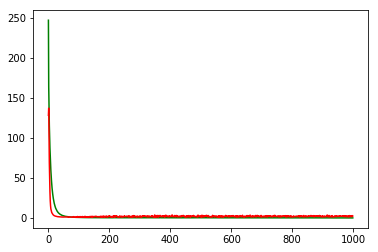

working on d,u and l,le 0.5 256 0.01 0.0001


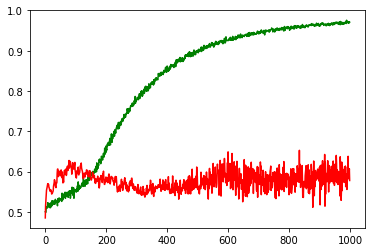

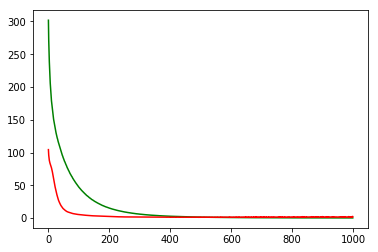

working on d,u and l,le 0.5 256 0.01 1e-05


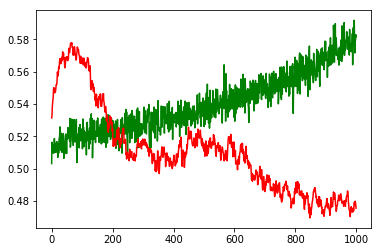

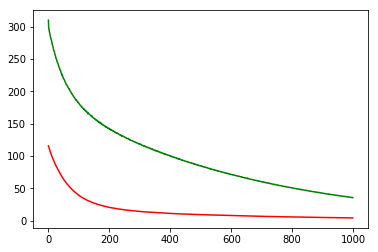

working on d,u and l,le 0.5 256 0.05 0.001


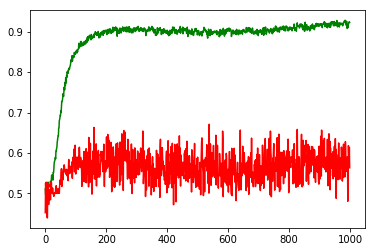

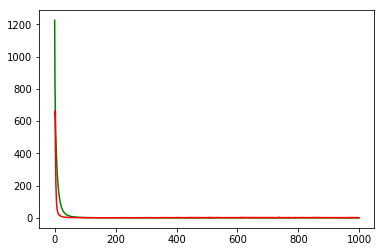

working on d,u and l,le 0.5 256 0.05 0.0001


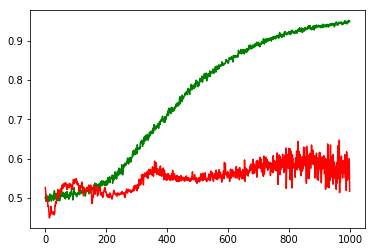

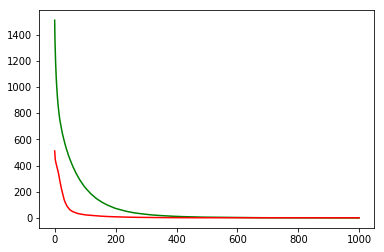

working on d,u and l,le 0.5 256 0.05 1e-05


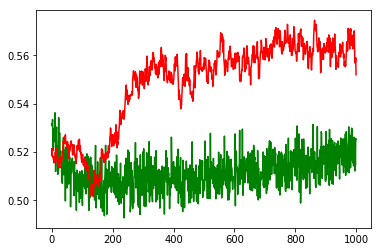

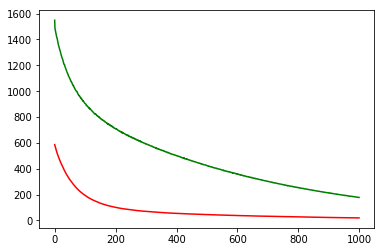

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: BKNG


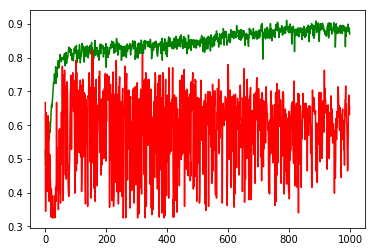

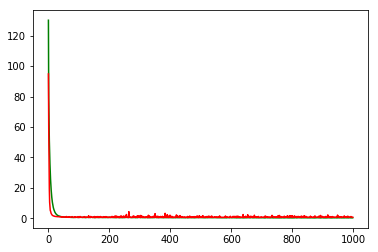

F1,score 0.710204081632653
G-score: 0.6639505529113923
Accuracy 0.6528117373986466
Window: 140
[[ 93  40]
 [102 174]]
Vol pos 1.2457487167043895
Vol neg 0.8226481209495711
Real Percentage of gain: 110.24334638528282
Percentage of gain: 0.5276256092548481
Total gain: 215.7988741852329
000000000000000000000000000000000000000000000000
Percentile:  0
[[71 28]
 [57 40]]
196/196 [==============================] - 0s 31us/step
[0.7992460739855863, 0.5663265306122449]
Percentile:  1
[[16 10]
 [28 44]]
98/98 [==============================] - 0s 46us/step
[0.8078328510936426, 0.6122448979591837]
Percentile:  2
[[ 5  2]
 [16 59]]
82/82 [==============================] - 0s 39us/step
[0.5122416571872991, 0.7804878077855925]
Percentile:  3
[[ 0  0]
 [ 1 18]]
19/19 [==============================] - 0s 34us/step
[0.1810837835073471, 0.9473684430122375]
Percentile:  4
[[ 0  0]
 [ 0 12]]
12/12 [==============================] - 0s 77us/step
[0.03486768901348114, 1.0]
000000000000000000000000000000000

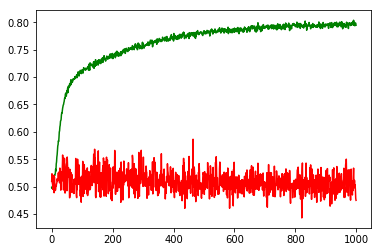

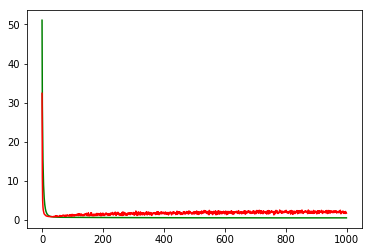

working on d,u and l,le 0.5 64 0.01 0.0001


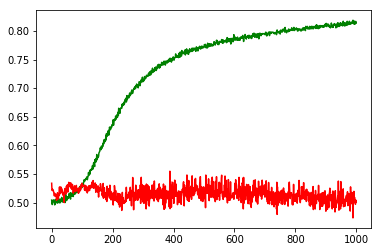

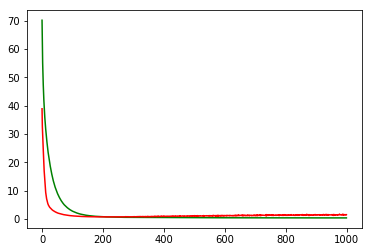

working on d,u and l,le 0.5 64 0.01 1e-05


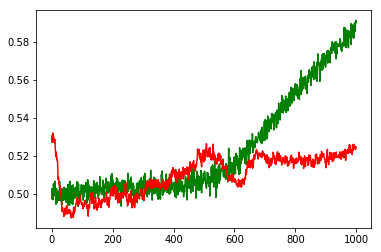

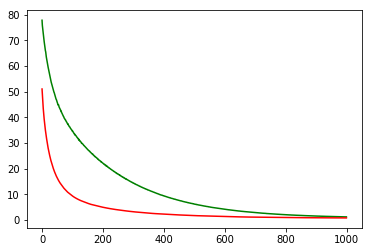

working on d,u and l,le 0.5 64 0.05 0.001


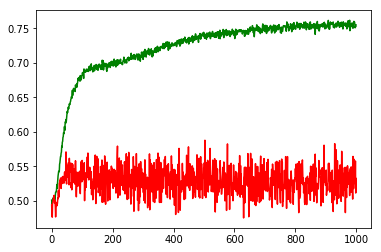

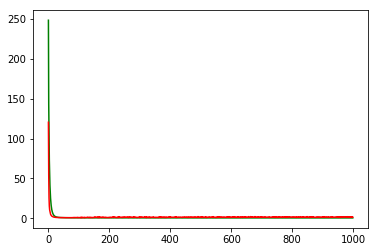

working on d,u and l,le 0.5 64 0.05 0.0001


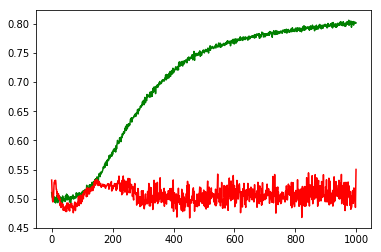

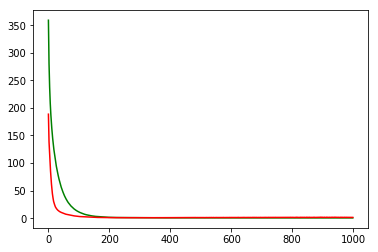

working on d,u and l,le 0.5 64 0.05 1e-05


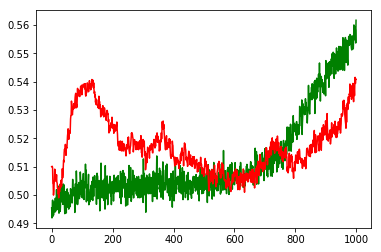

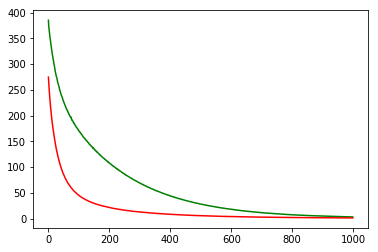

working on d,u and l,le 0.5 128 0.01 0.001


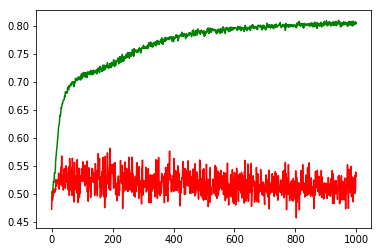

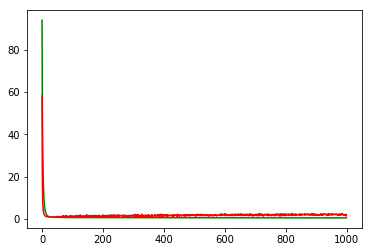

working on d,u and l,le 0.5 128 0.01 0.0001


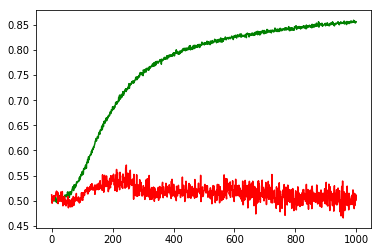

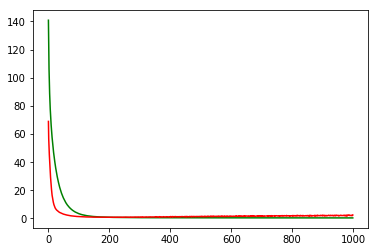

working on d,u and l,le 0.5 128 0.01 1e-05


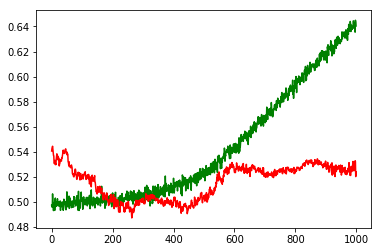

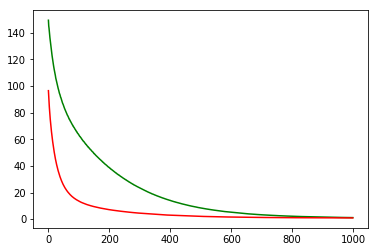

working on d,u and l,le 0.5 128 0.05 0.001


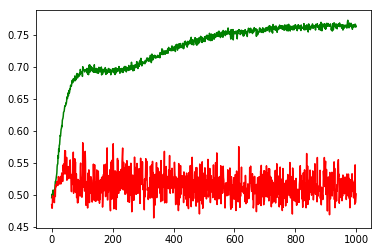

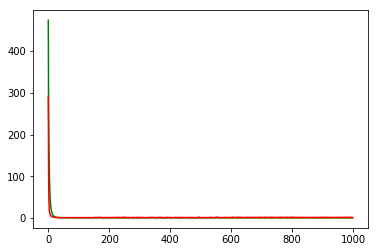

working on d,u and l,le 0.5 128 0.05 0.0001


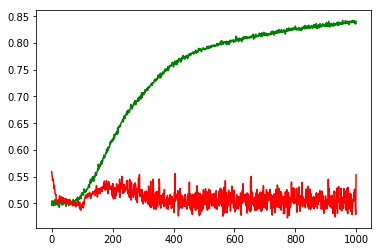

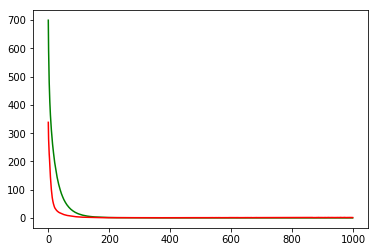

working on d,u and l,le 0.5 128 0.05 1e-05


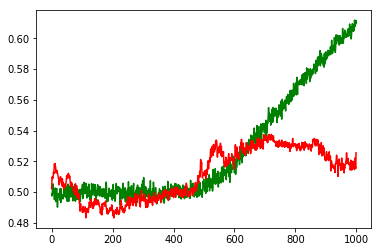

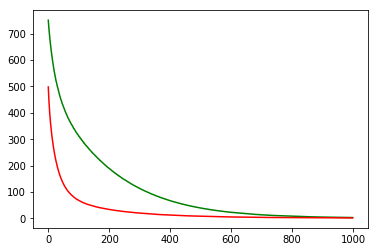

working on d,u and l,le 0.5 256 0.01 0.001


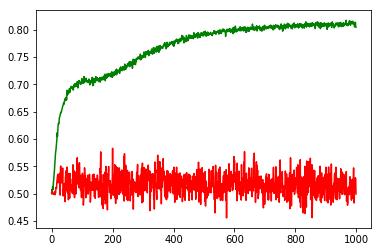

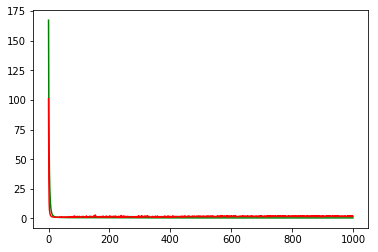

working on d,u and l,le 0.5 256 0.01 0.0001


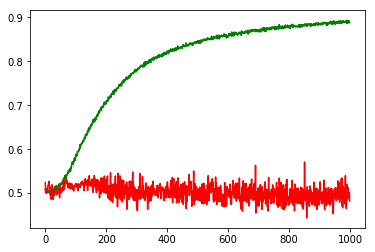

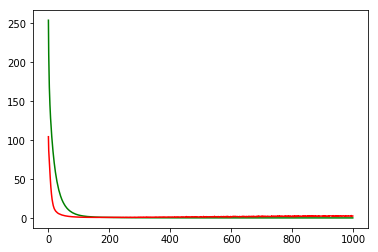

working on d,u and l,le 0.5 256 0.01 1e-05


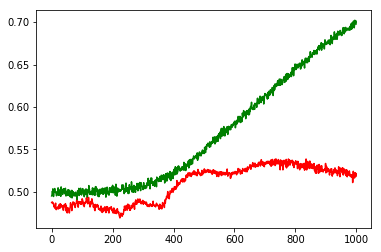

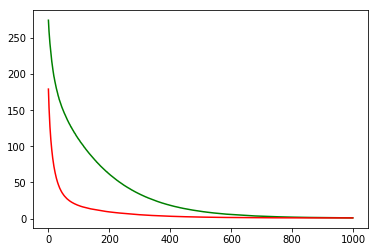

working on d,u and l,le 0.5 256 0.05 0.001


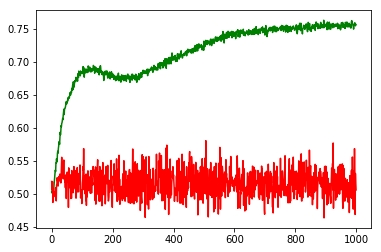

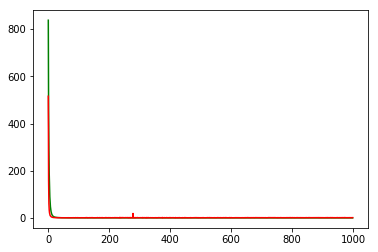

working on d,u and l,le 0.5 256 0.05 0.0001


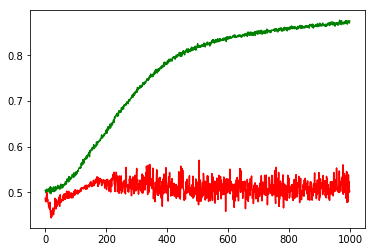

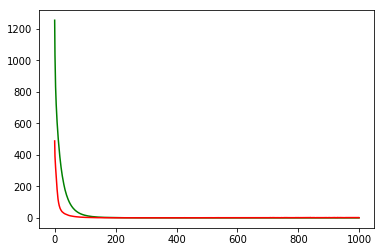

working on d,u and l,le 0.5 256 0.05 1e-05


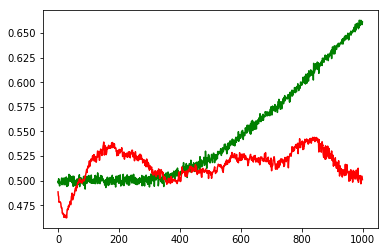

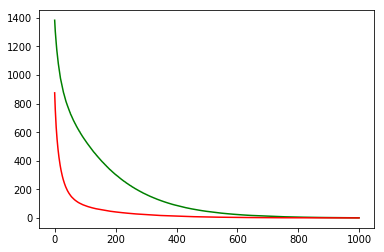

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.0001
Chart for BEST MODEL FOR: ADBE


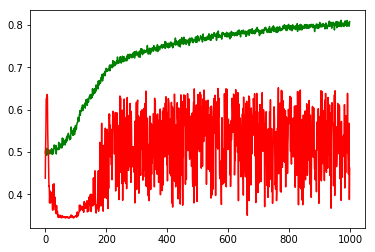

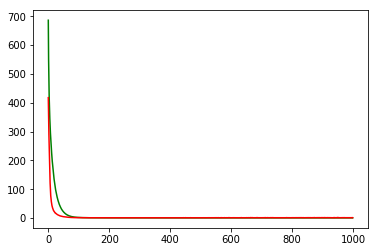

F1,score 0.48170212765957443
G-score: 0.4835933768171095
Accuracy 0.4620141338543841
Window: 140
[[240 153]
 [456 283]]
Vol pos 2.638461566169929
Vol neg 2.6387640489271993
Real Percentage of gain: -35.40889513802707
Percentage of gain: -0.20061122499098177
Total gain: -227.09190668979136
000000000000000000000000000000000000000000000000
Percentile:  0
[[152 115]
 [175 107]]
549/549 [==============================] - 0s 35us/step
[1.3030629253561163, 0.4717668488431715]
Percentile:  1
[[ 45  33]
 [176  85]]
339/339 [==============================] - 0s 30us/step
[1.4177424872519344, 0.38348082701365155]
Percentile:  2
[[21  4]
 [61 72]]
158/158 [==============================] - 0s 40us/step
[0.7916093423396726, 0.5886075949367089]
Percentile:  3
[[22  1]
 [28 15]]
66/66 [==============================] - 0s 49us/step
[0.8223597569899126, 0.5606060606060606]
Percentile:  4
[[ 0  0]
 [16  2]]
18/18 [==============================] - 0s 42us/step
[1.414795994758606, 0.1111111119389534]
00

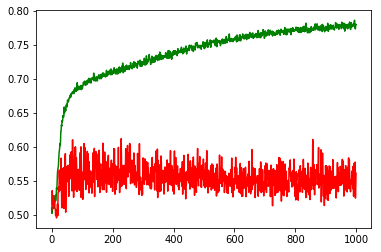

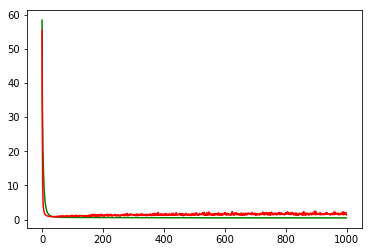

working on d,u and l,le 0.5 64 0.01 0.0001


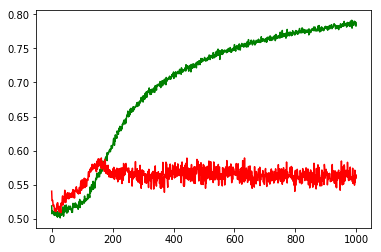

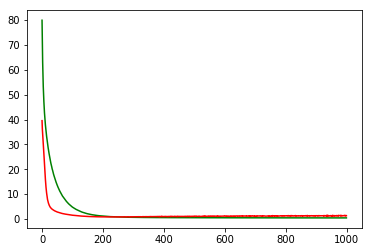

working on d,u and l,le 0.5 64 0.01 1e-05


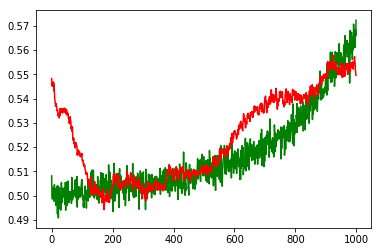

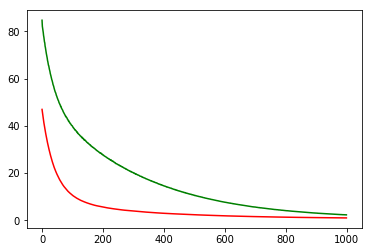

working on d,u and l,le 0.5 64 0.05 0.001


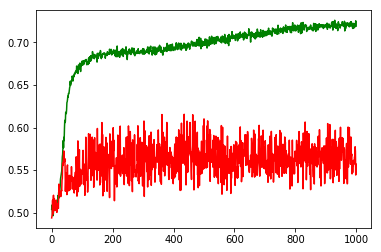

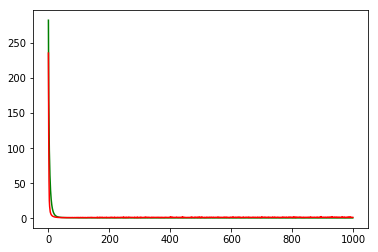

working on d,u and l,le 0.5 64 0.05 0.0001


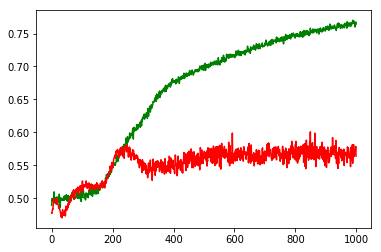

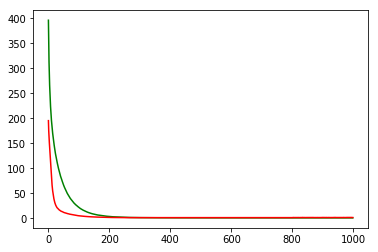

working on d,u and l,le 0.5 64 0.05 1e-05


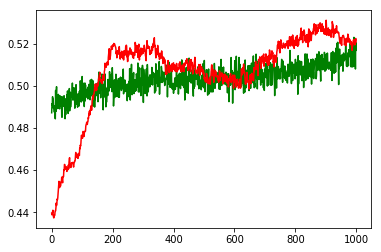

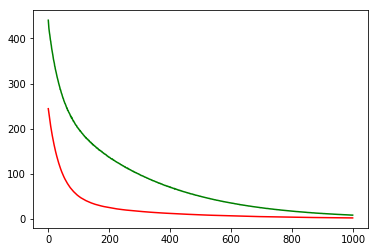

working on d,u and l,le 0.5 128 0.01 0.001


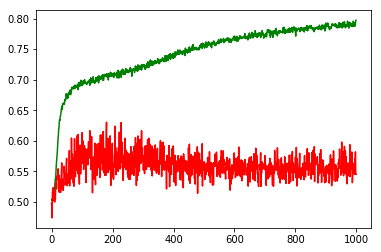

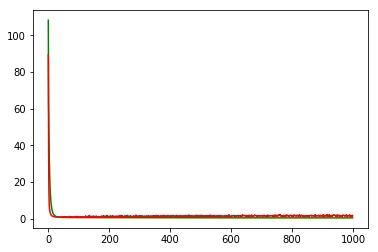

working on d,u and l,le 0.5 128 0.01 0.0001


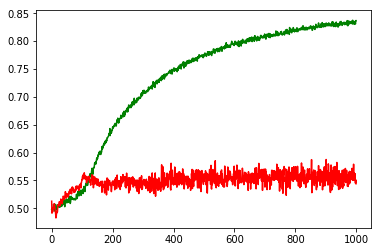

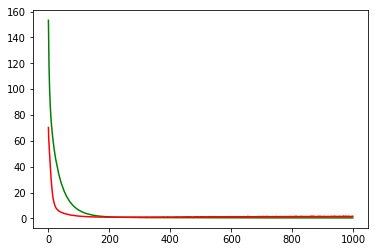

working on d,u and l,le 0.5 128 0.01 1e-05


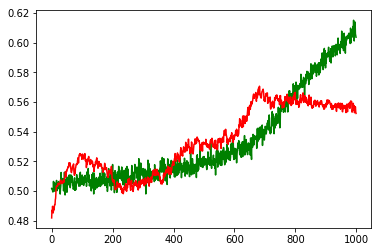

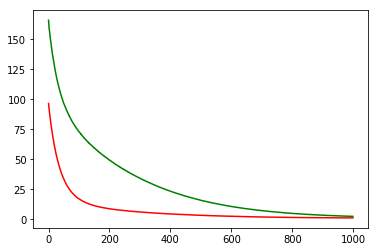

working on d,u and l,le 0.5 128 0.05 0.001


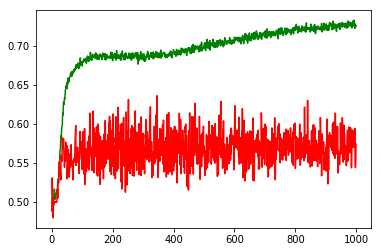

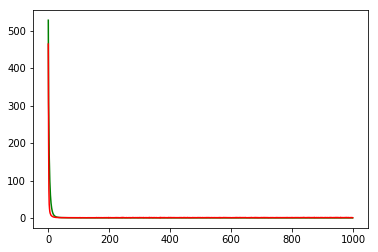

working on d,u and l,le 0.5 128 0.05 0.0001


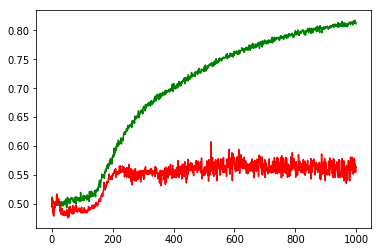

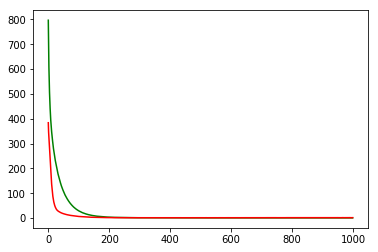

working on d,u and l,le 0.5 128 0.05 1e-05


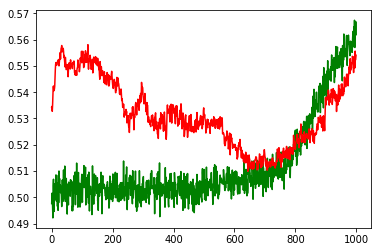

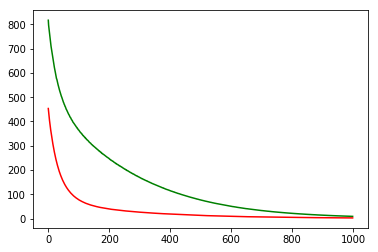

working on d,u and l,le 0.5 256 0.01 0.001


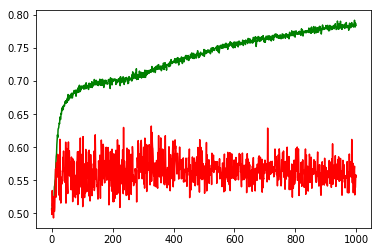

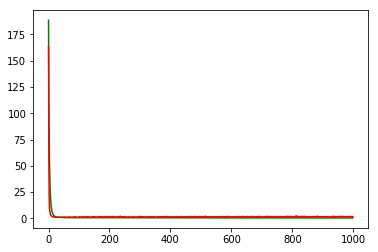

working on d,u and l,le 0.5 256 0.01 0.0001


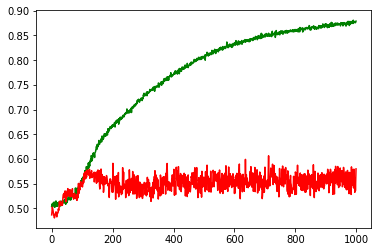

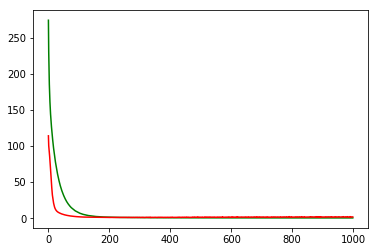

working on d,u and l,le 0.5 256 0.01 1e-05


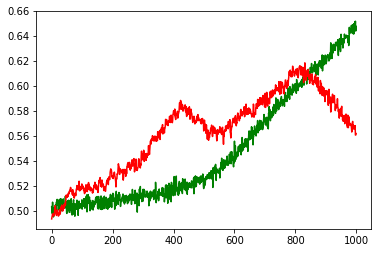

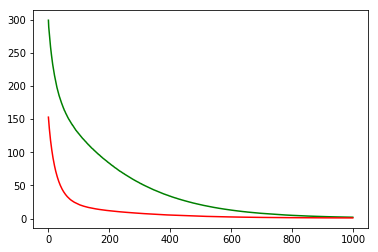

working on d,u and l,le 0.5 256 0.05 0.001


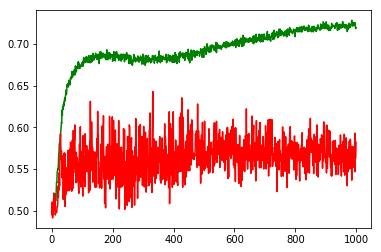

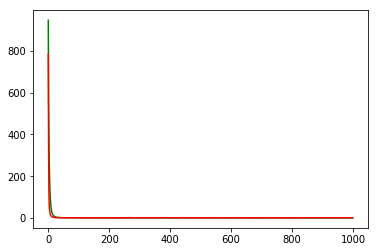

working on d,u and l,le 0.5 256 0.05 0.0001


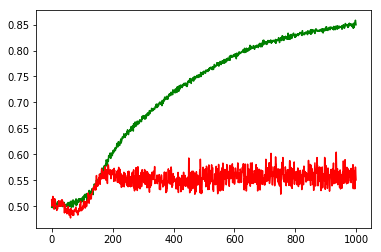

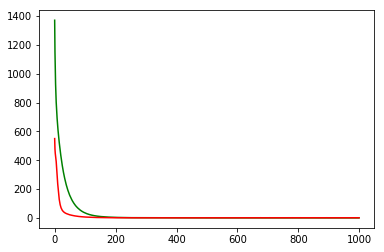

working on d,u and l,le 0.5 256 0.05 1e-05


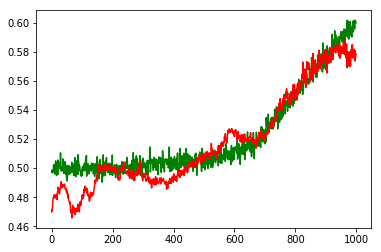

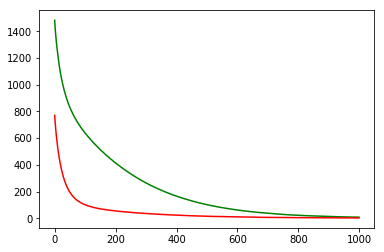

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.0001
Chart for BEST MODEL FOR: AMGN


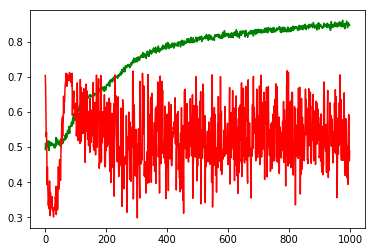

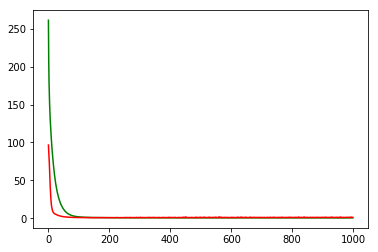

F1,score 0.5656414103525881
G-score: 0.5062922115751088
Accuracy 0.4885159000069851
Window: 140
[[176 142]
 [437 377]]
Vol pos 2.019589149485079
Vol neg 1.7812440750814422
Real Percentage of gain: 123.45139252455776
Percentage of gain: 0.07552339239672577
Total gain: 85.49248019309357
000000000000000000000000000000000000000000000000
Percentile:  0
[[111  52]
 [207 102]]
472/472 [==============================] - 0s 34us/step
[1.2792083045183602, 0.451271186440678]
Percentile:  1
[[ 17  38]
 [119 126]]
300/300 [==============================] - 0s 39us/step
[1.237859525680542, 0.4766666666666667]
Percentile:  2
[[  8  18]
 [ 87 100]]
213/213 [==============================] - 0s 41us/step
[0.9817324524194422, 0.5070422538709193]
Percentile:  3
[[32 24]
 [24 45]]
125/125 [==============================] - 0s 66us/step
[0.6747060384750366, 0.6159999989271164]
Percentile:  4
[[8 9]
 [0 3]]
20/20 [==============================] - 0s 63us/step
[0.8045805096626282, 0.550000011920929]
0000000

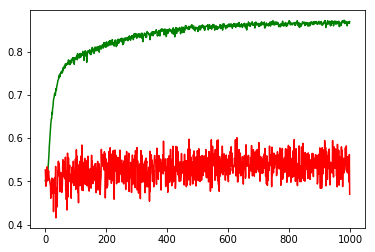

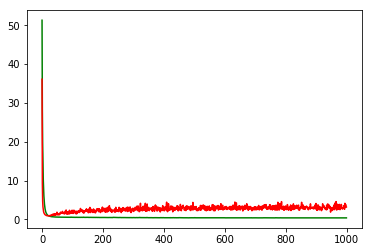

working on d,u and l,le 0.5 64 0.01 0.0001


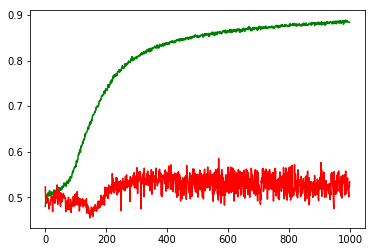

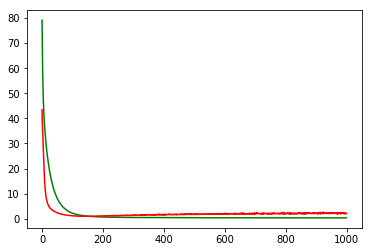

working on d,u and l,le 0.5 64 0.01 1e-05


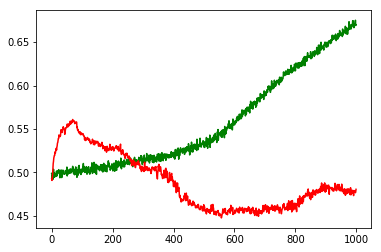

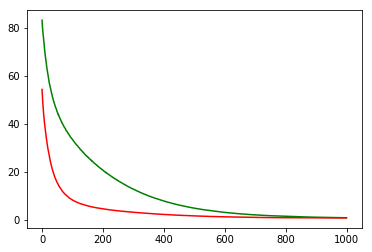

working on d,u and l,le 0.5 64 0.05 0.001


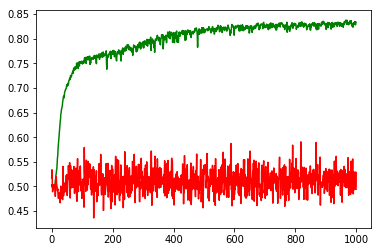

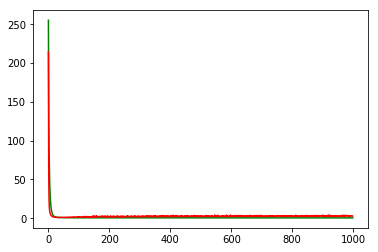

working on d,u and l,le 0.5 64 0.05 0.0001


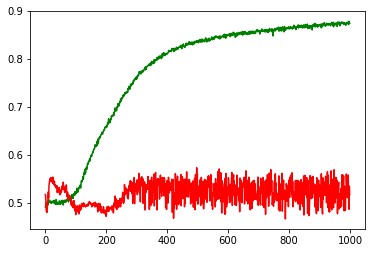

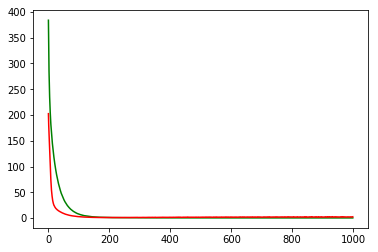

working on d,u and l,le 0.5 64 0.05 1e-05


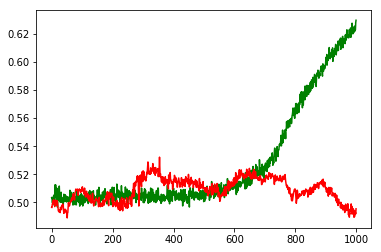

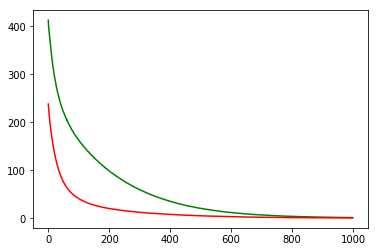

working on d,u and l,le 0.5 128 0.01 0.001


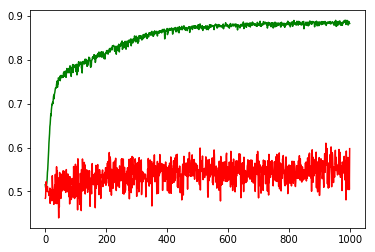

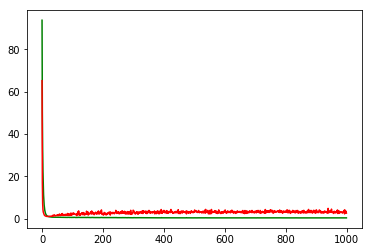

working on d,u and l,le 0.5 128 0.01 0.0001


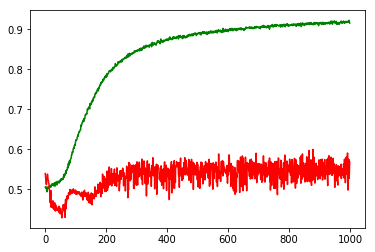

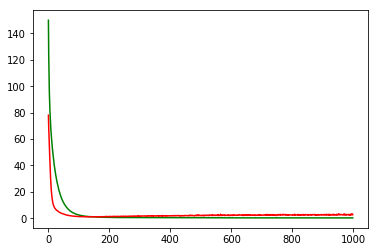

working on d,u and l,le 0.5 128 0.01 1e-05


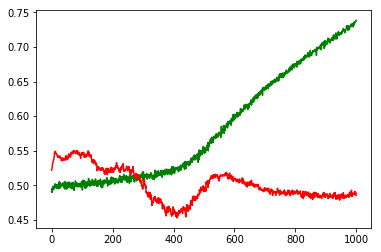

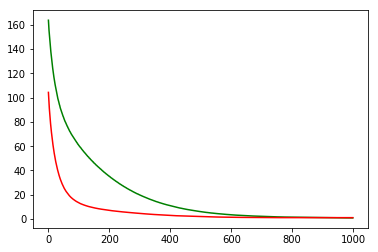

working on d,u and l,le 0.5 128 0.05 0.001


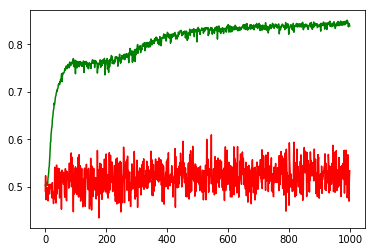

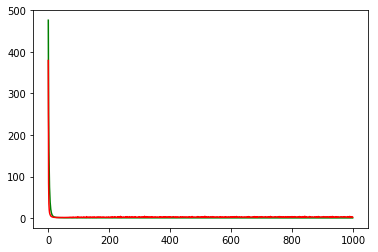

working on d,u and l,le 0.5 128 0.05 0.0001


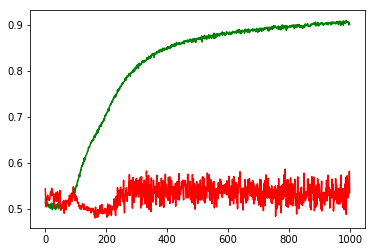

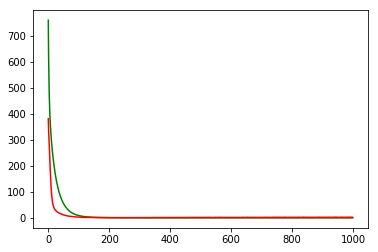

working on d,u and l,le 0.5 128 0.05 1e-05


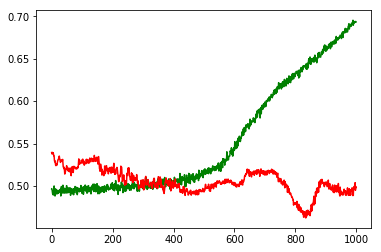

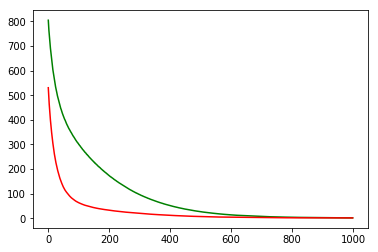

working on d,u and l,le 0.5 256 0.01 0.001


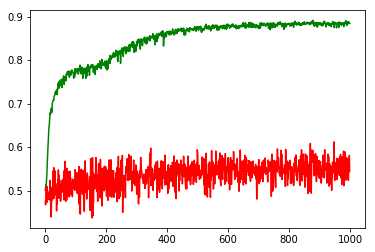

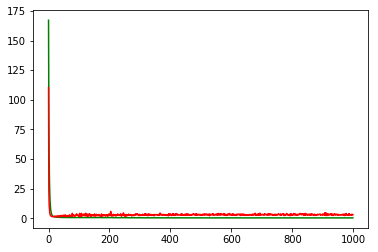

working on d,u and l,le 0.5 256 0.01 0.0001


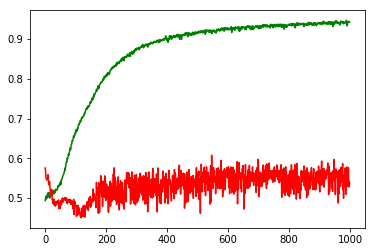

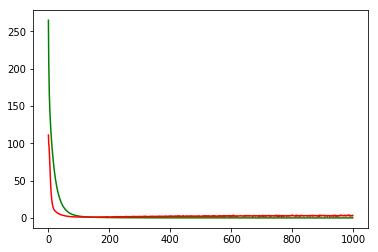

working on d,u and l,le 0.5 256 0.01 1e-05


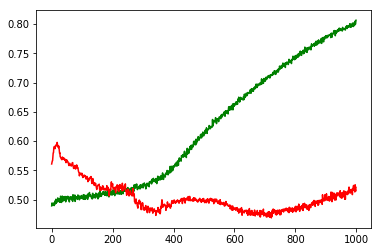

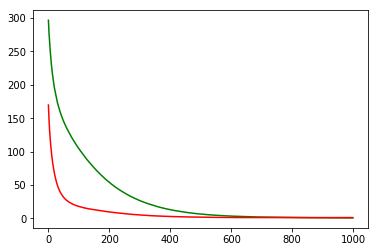

working on d,u and l,le 0.5 256 0.05 0.001


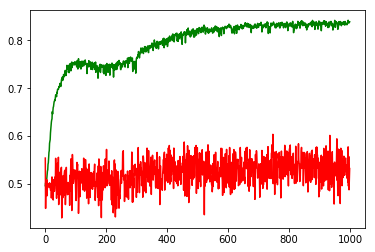

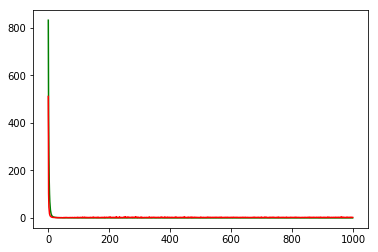

working on d,u and l,le 0.5 256 0.05 0.0001


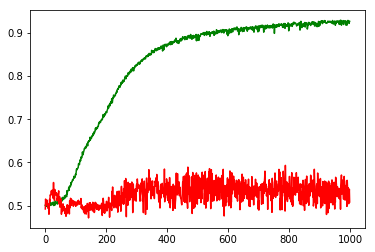

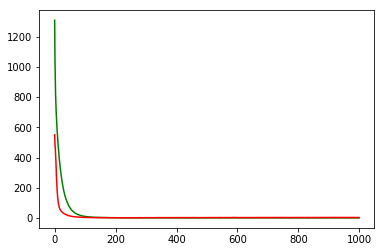

working on d,u and l,le 0.5 256 0.05 1e-05


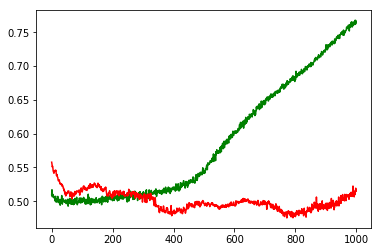

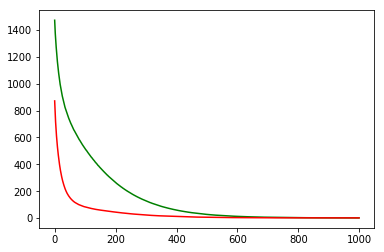

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: TXN


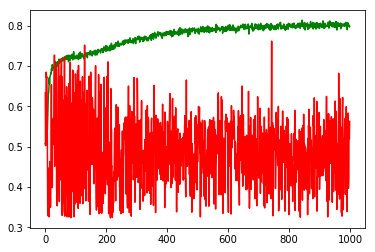

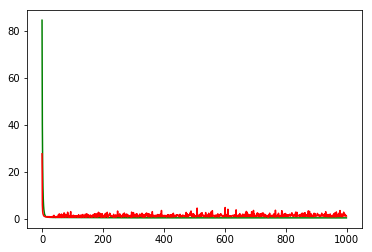

F1,score 0.6745562130177515
G-score: 0.47532873897434375
Accuracy 0.562720848793697
Window: 140
[[124 245]
 [250 513]]
Vol pos 2.8085196077352426
Vol neg 2.0918332393876757
Real Percentage of gain: -11.833883065796854
Percentage of gain: 0.665697470521599
Total gain: 753.5695366304501
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 76 132]
 [101 146]]
455/455 [==============================] - 0s 33us/step
[1.4920658200651735, 0.4879120880103373]
Percentile:  1
[[ 38  92]
 [ 64 141]]
335/335 [==============================] - 0s 35us/step
[1.4198680283418341, 0.5343283582979174]
Percentile:  2
[[  3  11]
 [ 62 116]]
192/192 [==============================] - 0s 37us/step
[0.7003420293331146, 0.6197916666666666]
Percentile:  3
[[ 3  7]
 [21 91]]
122/122 [==============================] - 0s 40us/step
[0.5419332375291919, 0.7704918057215019]
Percentile:  4
[[ 4  3]
 [ 2 17]]
26/26 [==============================] - 0s 25us/step
[0.5826128125190735, 0.807692289352417]
0

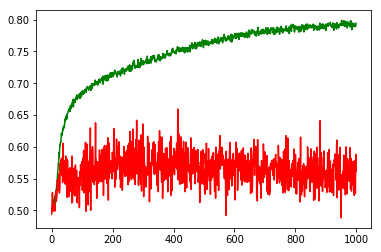

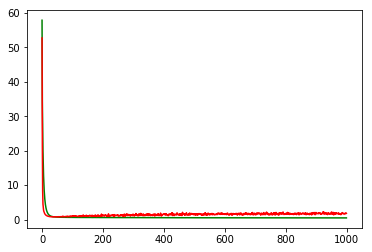

working on d,u and l,le 0.5 64 0.01 0.0001


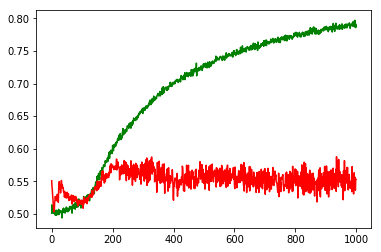

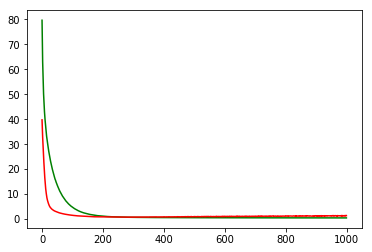

working on d,u and l,le 0.5 64 0.01 1e-05


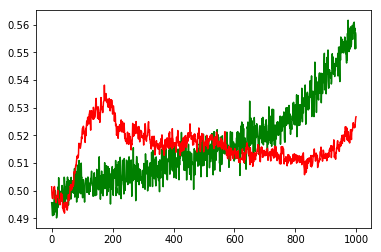

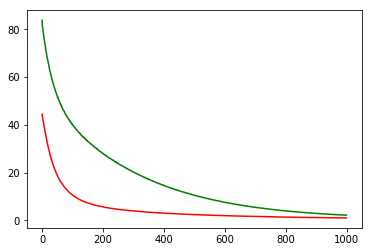

working on d,u and l,le 0.5 64 0.05 0.001


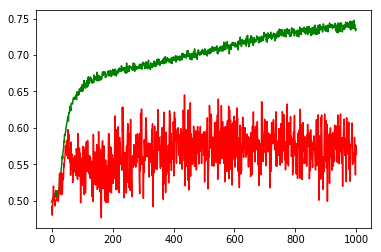

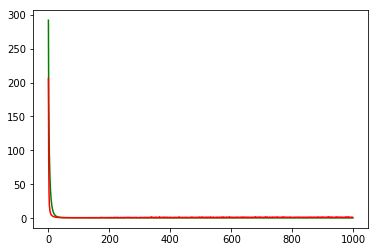

working on d,u and l,le 0.5 64 0.05 0.0001


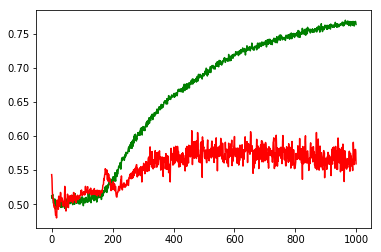

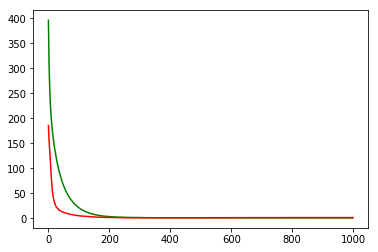

working on d,u and l,le 0.5 64 0.05 1e-05


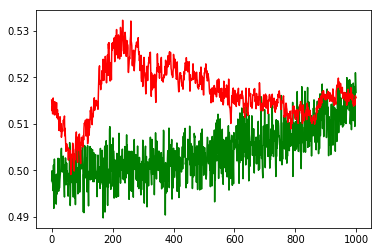

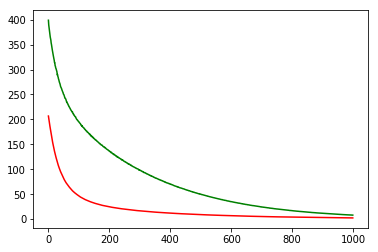

working on d,u and l,le 0.5 128 0.01 0.001


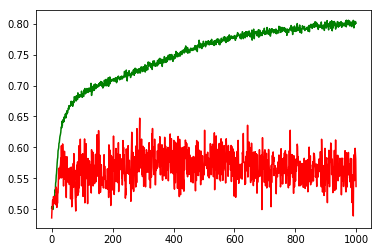

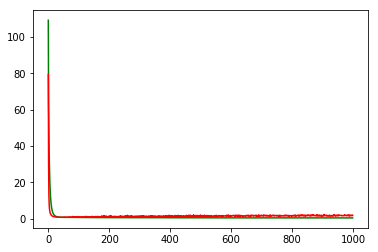

working on d,u and l,le 0.5 128 0.01 0.0001


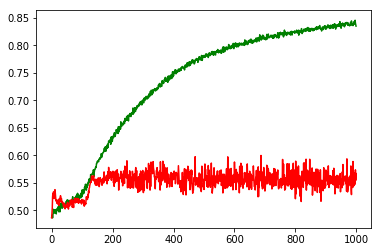

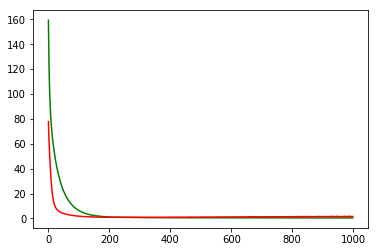

working on d,u and l,le 0.5 128 0.01 1e-05


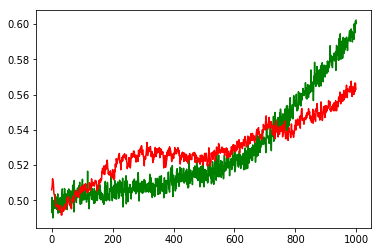

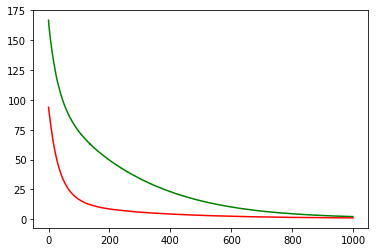

working on d,u and l,le 0.5 128 0.05 0.001


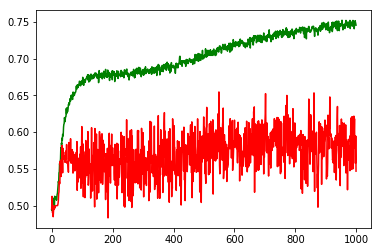

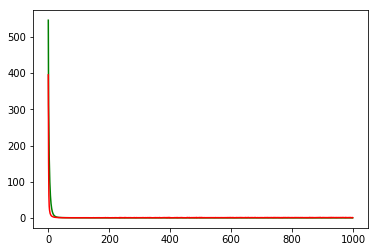

working on d,u and l,le 0.5 128 0.05 0.0001


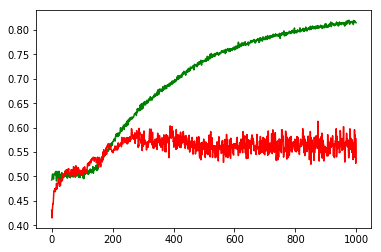

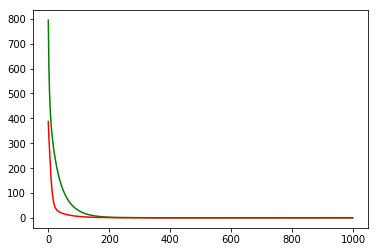

working on d,u and l,le 0.5 128 0.05 1e-05


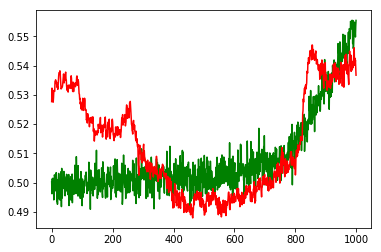

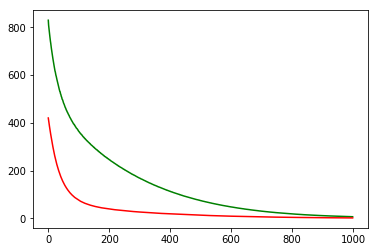

working on d,u and l,le 0.5 256 0.01 0.001


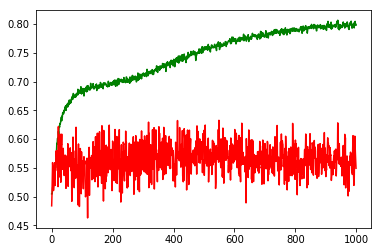

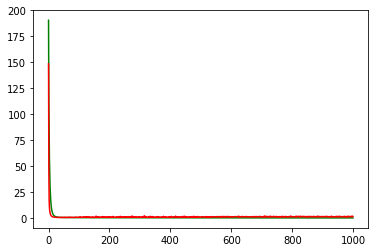

working on d,u and l,le 0.5 256 0.01 0.0001


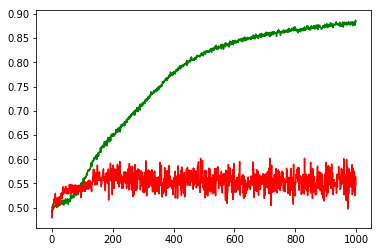

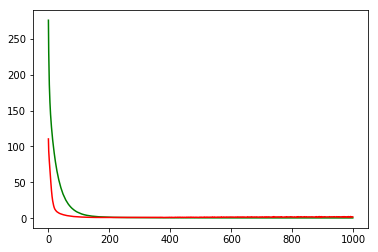

working on d,u and l,le 0.5 256 0.01 1e-05


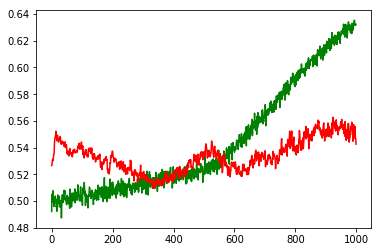

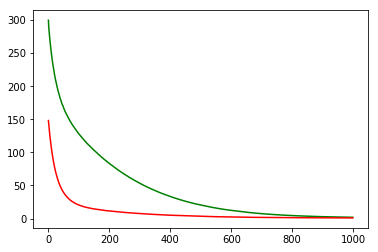

working on d,u and l,le 0.5 256 0.05 0.001


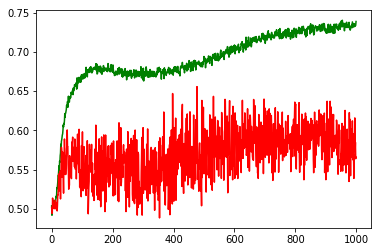

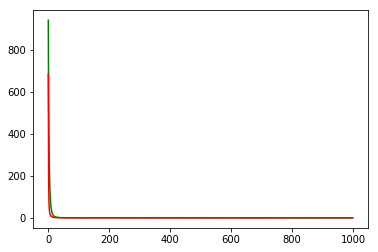

working on d,u and l,le 0.5 256 0.05 0.0001


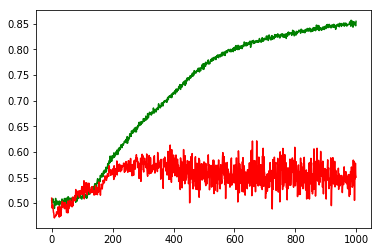

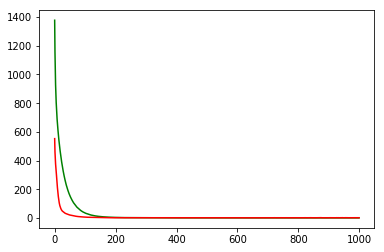

working on d,u and l,le 0.5 256 0.05 1e-05


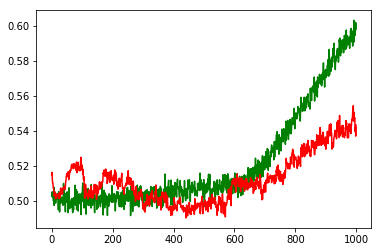

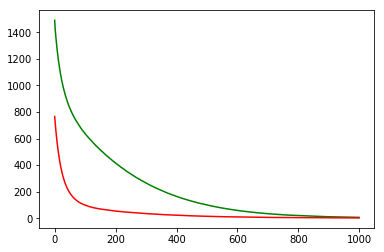

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.0001
Chart for BEST MODEL FOR: AVGO


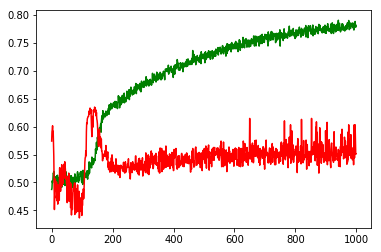

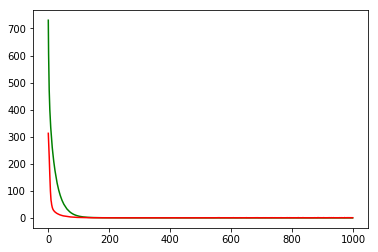

F1,score 0.6572199730094468
G-score: 0.47450000450628854
Accuracy 0.5512367508015448
Window: 140
[[137 274]
 [234 487]]
Vol pos 3.9839852655114547
Vol neg 2.111986993248001
Real Percentage of gain: 79.7870133001166
Percentage of gain: 1.2483369373755862
Total gain: 1413.1174131091634
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 55 151]
 [153 121]]
480/480 [==============================] - 0s 29us/step
[1.7253283470869065, 0.36666666666666664]
Percentile:  1
[[ 31  94]
 [ 39 111]]
275/275 [==============================] - 0s 27us/step
[1.242517313523726, 0.5163636363636364]
Percentile:  2
[[  6  19]
 [ 40 182]]
247/247 [==============================] - 0s 42us/step
[0.5080641527407566, 0.7611336035405093]
Percentile:  3
[[10  7]
 [ 2 61]]
80/80 [==============================] - 0s 39us/step
[0.26536969244480135, 0.8875]
Percentile:  4
[[34  3]
 [ 0 11]]
48/48 [==============================] - 0s 66us/step
[0.37614492575327557, 0.9375]
0000000000000000000000000

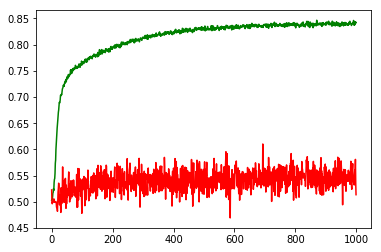

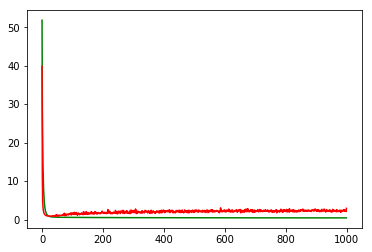

working on d,u and l,le 0.5 64 0.01 0.0001


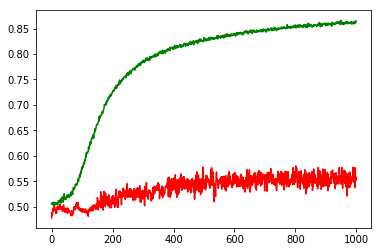

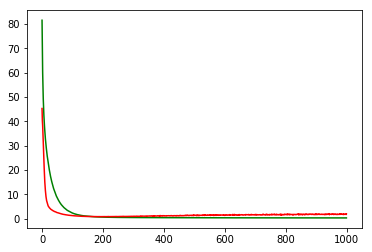

working on d,u and l,le 0.5 64 0.01 1e-05


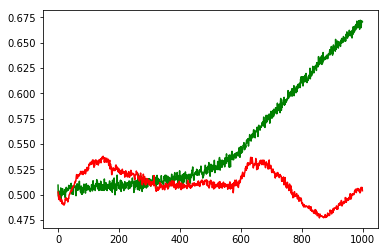

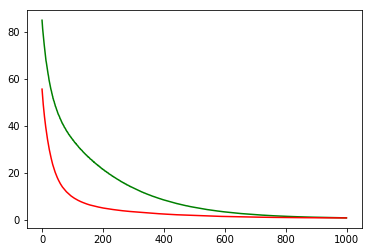

working on d,u and l,le 0.5 64 0.05 0.001


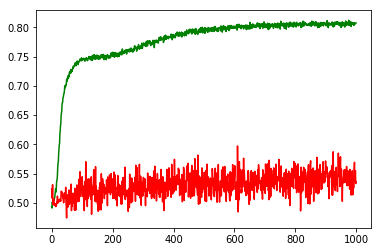

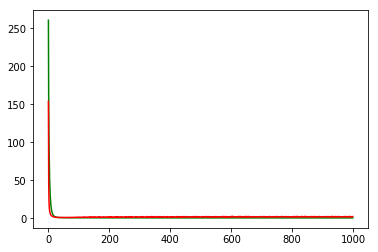

working on d,u and l,le 0.5 64 0.05 0.0001


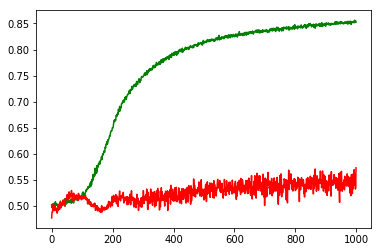

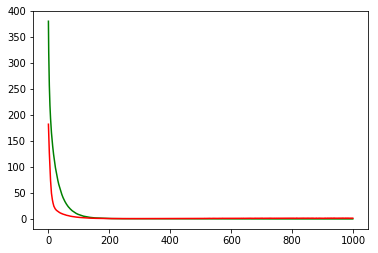

working on d,u and l,le 0.5 64 0.05 1e-05


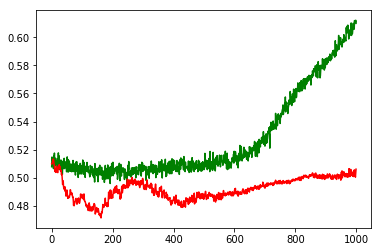

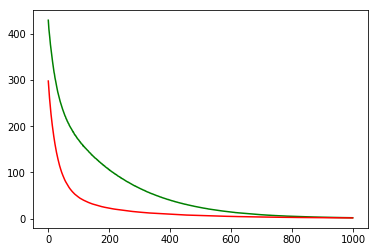

working on d,u and l,le 0.5 128 0.01 0.001


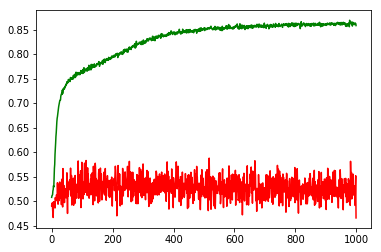

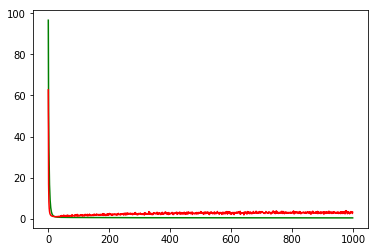

working on d,u and l,le 0.5 128 0.01 0.0001


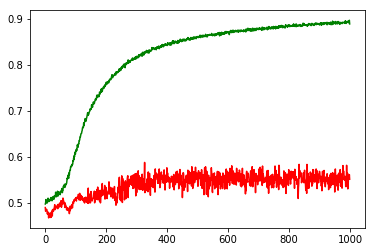

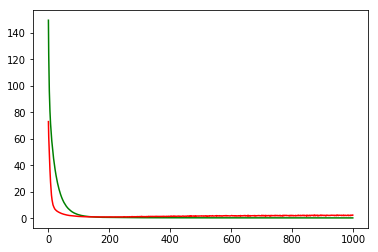

working on d,u and l,le 0.5 128 0.01 1e-05


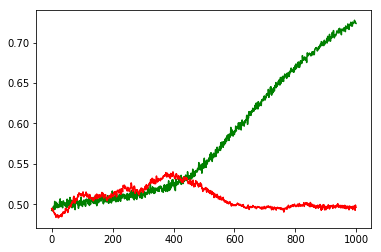

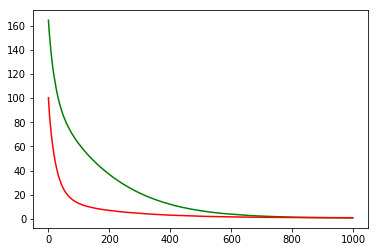

working on d,u and l,le 0.5 128 0.05 0.001


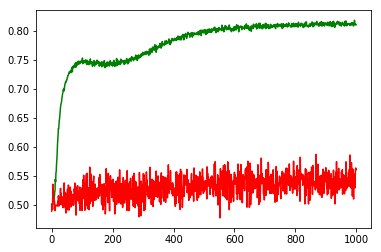

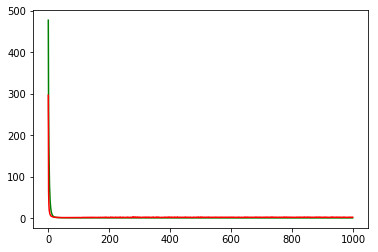

working on d,u and l,le 0.5 128 0.05 0.0001


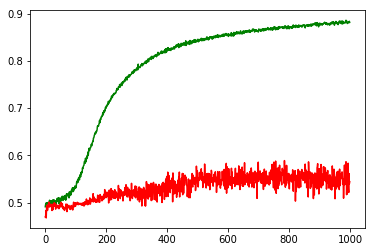

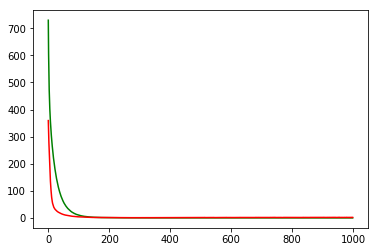

working on d,u and l,le 0.5 128 0.05 1e-05


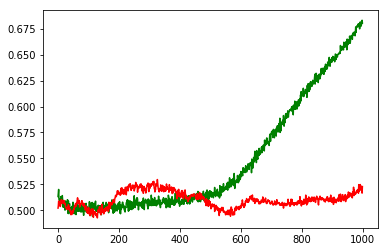

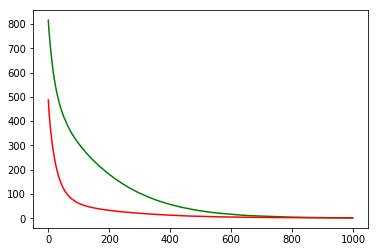

working on d,u and l,le 0.5 256 0.01 0.001


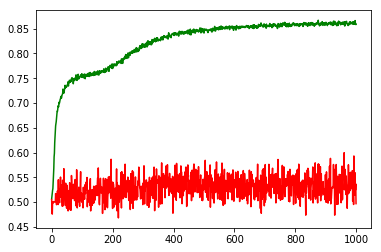

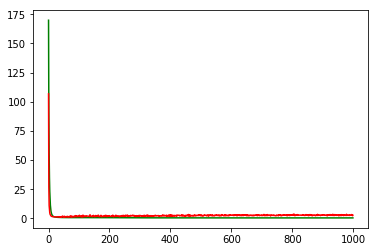

working on d,u and l,le 0.5 256 0.01 0.0001


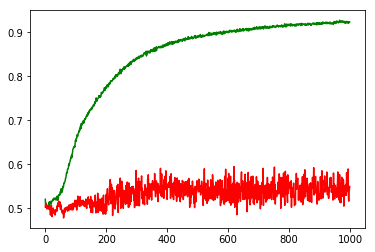

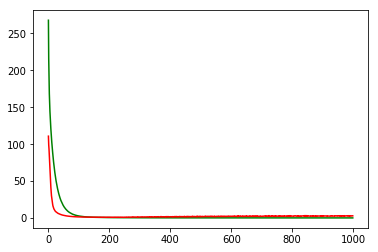

working on d,u and l,le 0.5 256 0.01 1e-05


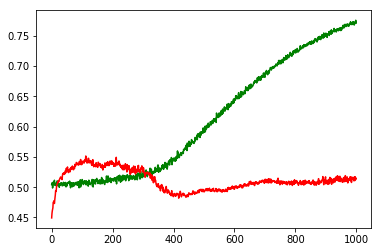

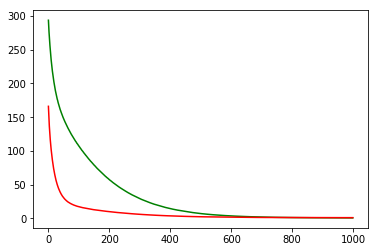

working on d,u and l,le 0.5 256 0.05 0.001


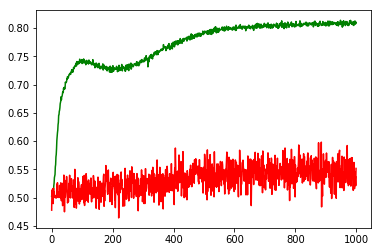

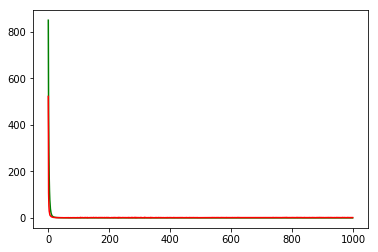

working on d,u and l,le 0.5 256 0.05 0.0001


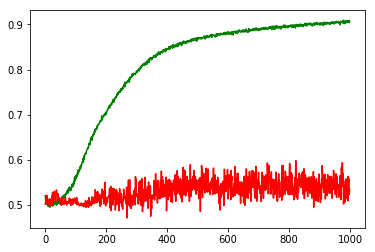

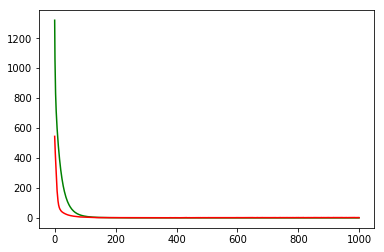

working on d,u and l,le 0.5 256 0.05 1e-05


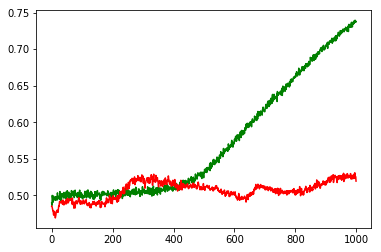

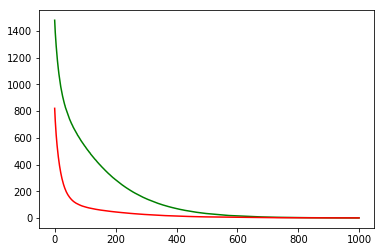

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: PYPL


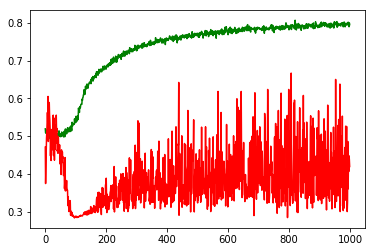

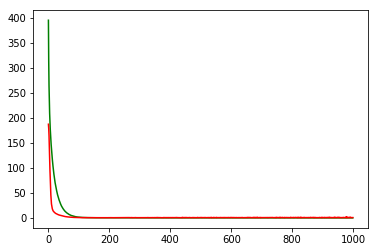

F1,score 0.5100671140939598
G-score: 0.4179996616194585
Accuracy 0.41961130815765463
Window: 140
[[133 188]
 [469 342]]
Vol pos 2.8125377059041545
Vol neg 2.964995259264774
Real Percentage of gain: -83.66642739950784
Percentage of gain: -0.5406770980852325
Total gain: -612.0464750324832
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 58  79]
 [270 175]]
582/582 [==============================] - 0s 29us/step
[1.3399552897489357, 0.4003436426628906]
Percentile:  1
[[ 24  27]
 [126 131]]
308/308 [==============================] - 0s 29us/step
[0.8183938326773705, 0.5032467524726669]
Percentile:  2
[[44 76]
 [41 23]]
184/184 [==============================] - 0s 29us/step
[1.1117143268170564, 0.3641304354304853]
Percentile:  3
[[ 7  6]
 [19 11]]
43/43 [==============================] - 0s 55us/step
[0.9375685245491737, 0.4186046483904816]
Percentile:  4
[[ 0  0]
 [11  1]]
12/12 [==============================] - 0s 61us/step
[1.6389979124069214, 0.0833333358168602]
0000

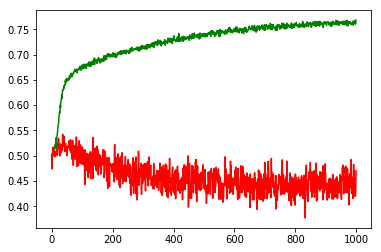

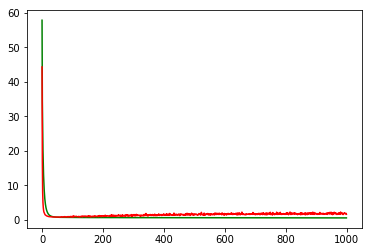

working on d,u and l,le 0.5 64 0.01 0.0001


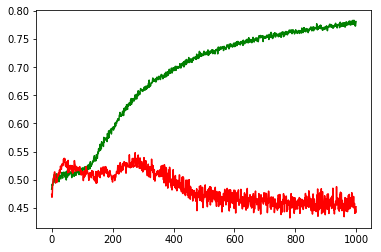

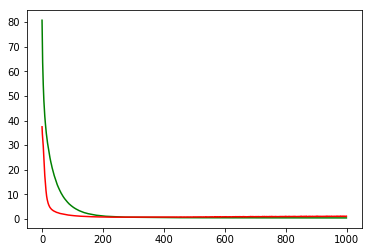

working on d,u and l,le 0.5 64 0.01 1e-05


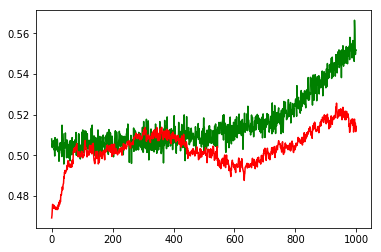

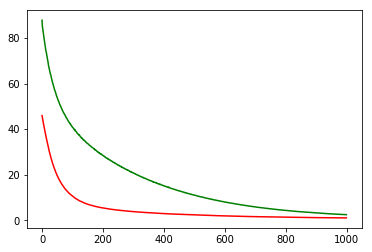

working on d,u and l,le 0.5 64 0.05 0.001


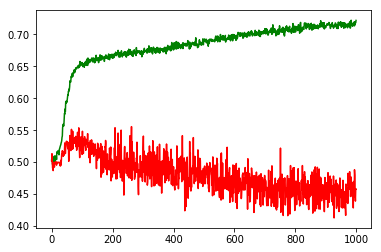

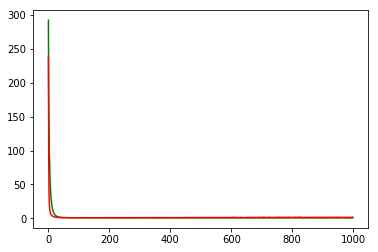

working on d,u and l,le 0.5 64 0.05 0.0001


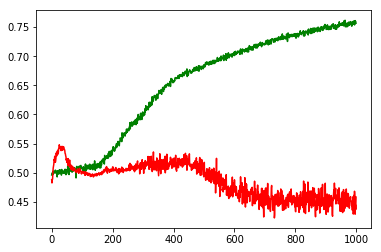

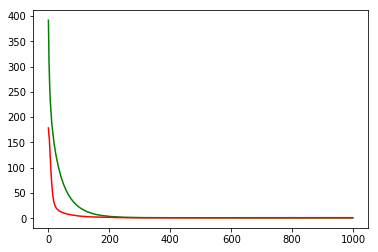

working on d,u and l,le 0.5 64 0.05 1e-05


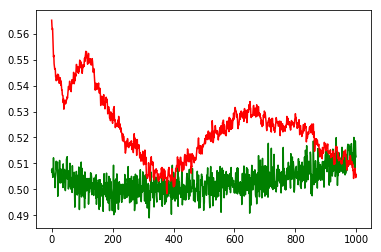

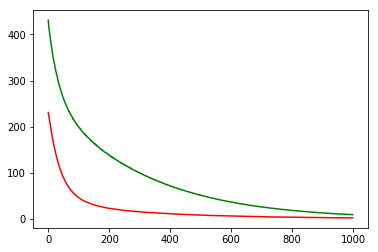

working on d,u and l,le 0.5 128 0.01 0.001


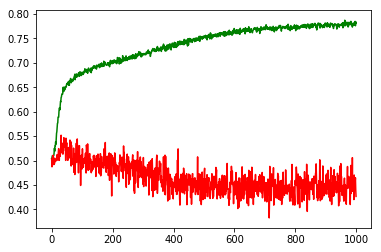

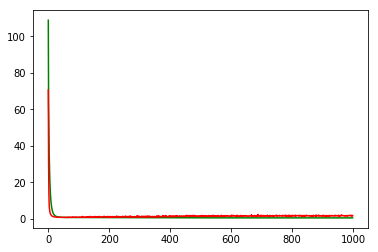

working on d,u and l,le 0.5 128 0.01 0.0001


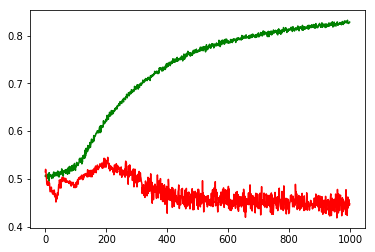

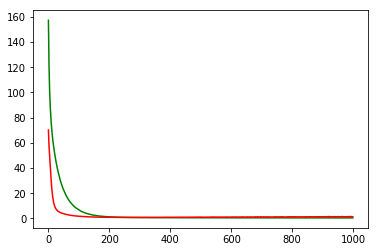

working on d,u and l,le 0.5 128 0.01 1e-05


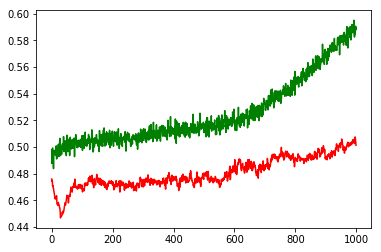

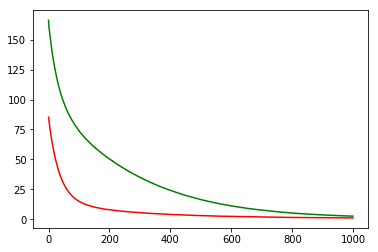

working on d,u and l,le 0.5 128 0.05 0.001


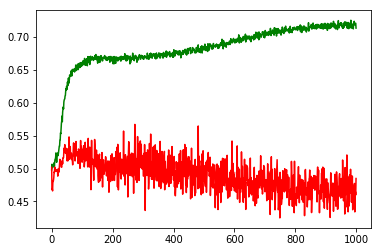

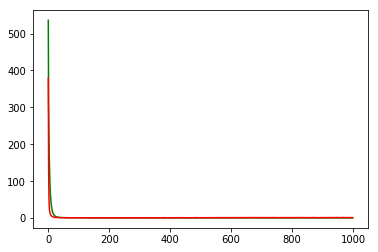

working on d,u and l,le 0.5 128 0.05 0.0001


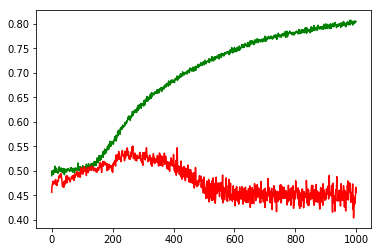

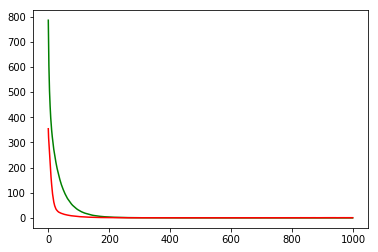

working on d,u and l,le 0.5 128 0.05 1e-05


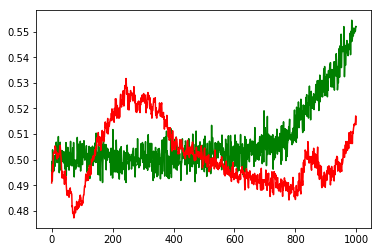

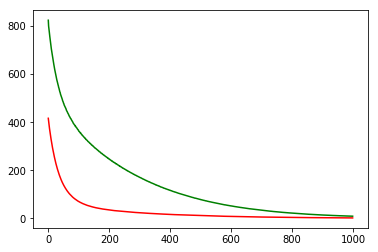

working on d,u and l,le 0.5 256 0.01 0.001


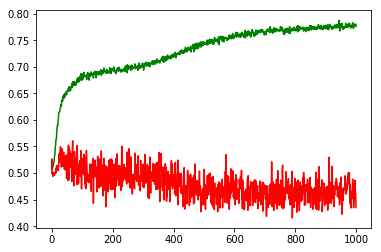

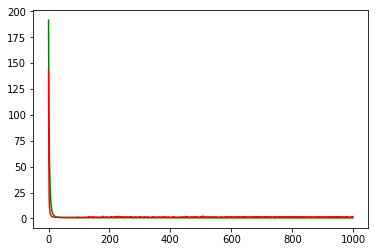

working on d,u and l,le 0.5 256 0.01 0.0001


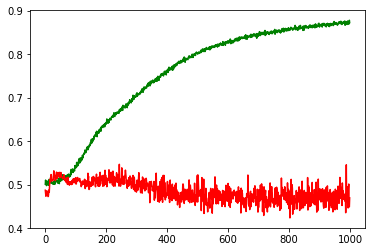

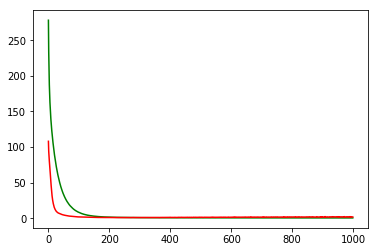

working on d,u and l,le 0.5 256 0.01 1e-05


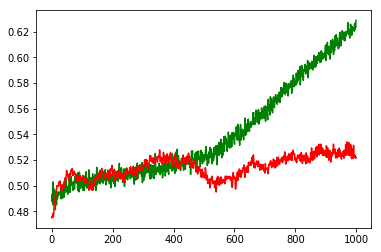

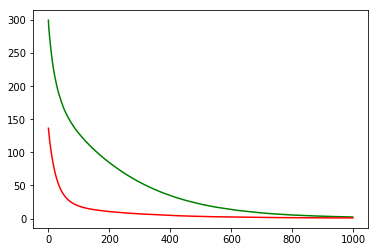

working on d,u and l,le 0.5 256 0.05 0.001


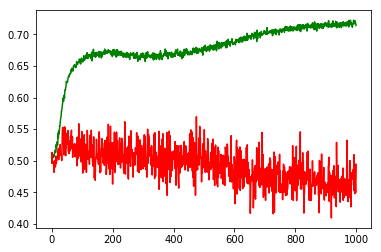

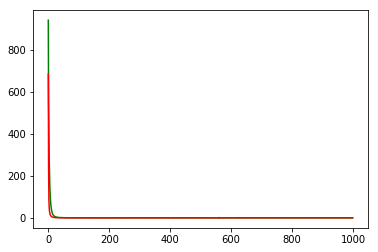

working on d,u and l,le 0.5 256 0.05 0.0001


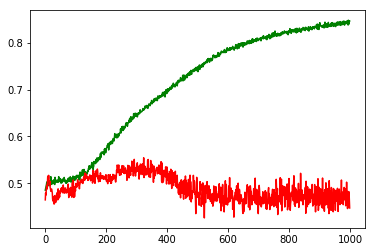

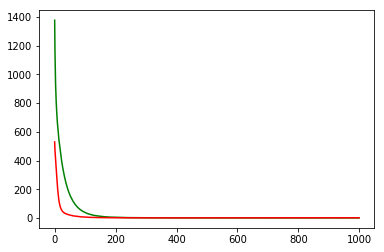

working on d,u and l,le 0.5 256 0.05 1e-05


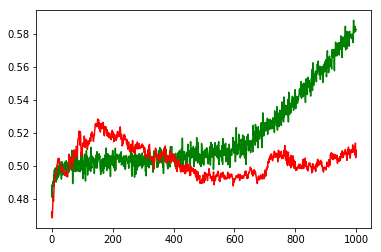

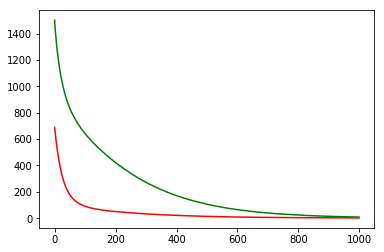

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: GILD


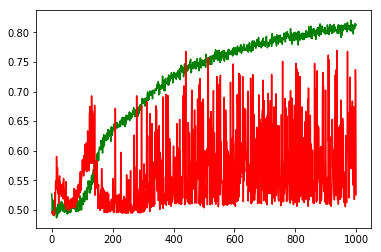

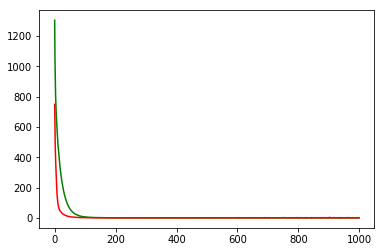

F1,score 0.6707541385652974
G-score: 0.2863005972191326
Accuracy 0.5256183748742296
Window: 140
[[ 48 524]
 [ 13 547]]
Vol pos 2.7903764889038345
Vol neg 3.699514018016445
Real Percentage of gain: -91.10698096101517
Percentage of gain: -0.2883083187076409
Total gain: -326.3650167770495
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 19 310]
 [  5 278]]
612/612 [==============================] - 0s 28us/step
[2.2545019843999077, 0.4852941176470588]
Percentile:  1
[[ 17  86]
 [  3 201]]
307/307 [==============================] - 0s 38us/step
[0.6680555005803559, 0.7100977198697068]
Percentile:  2
[[ 1 11]
 [ 4 66]]
82/82 [==============================] - 0s 74us/step
[0.42646558655471334, 0.8170731649166201]
Percentile:  3
[[ 6 35]
 [ 0  0]]
41/41 [==============================] - 0s 56us/step
[1.969086914527707, 0.14634146341463414]
Percentile:  4
[[ 4 82]
 [ 0  0]]
86/86 [==============================] - 0s 33us/step
[2.6939909624498943, 0.046511628600054006]
0000

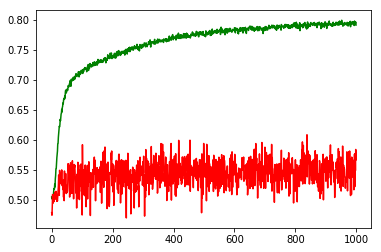

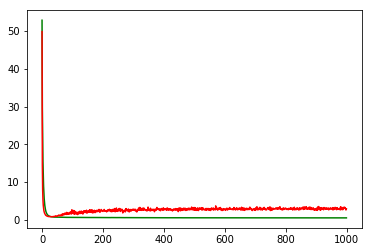

working on d,u and l,le 0.5 64 0.01 0.0001


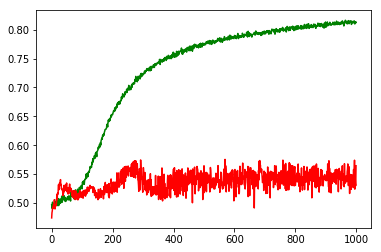

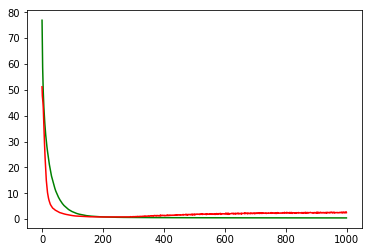

working on d,u and l,le 0.5 64 0.01 1e-05


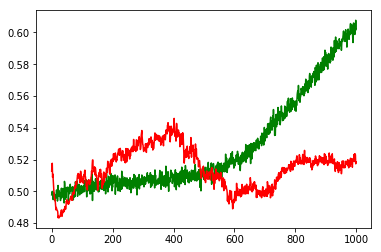

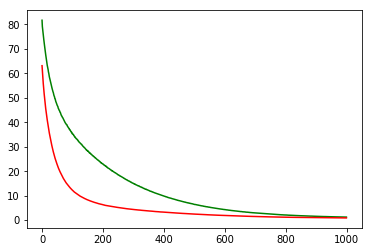

working on d,u and l,le 0.5 64 0.05 0.001


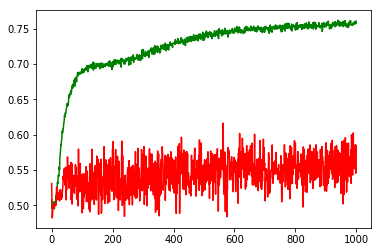

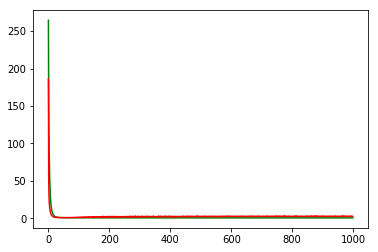

working on d,u and l,le 0.5 64 0.05 0.0001


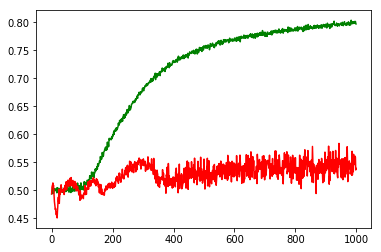

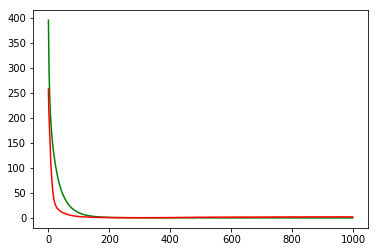

working on d,u and l,le 0.5 64 0.05 1e-05


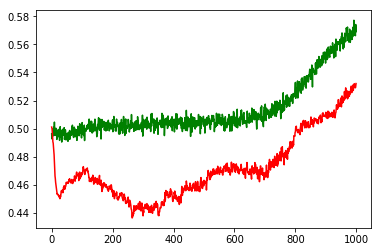

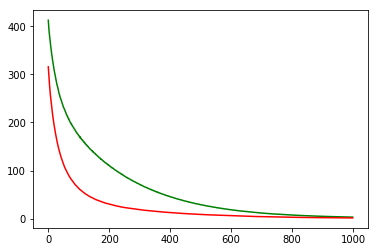

working on d,u and l,le 0.5 128 0.01 0.001


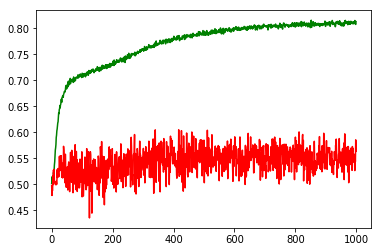

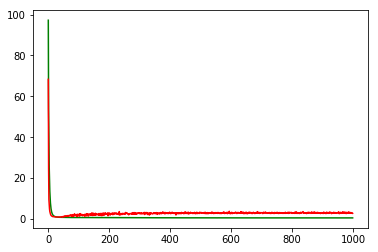

working on d,u and l,le 0.5 128 0.01 0.0001


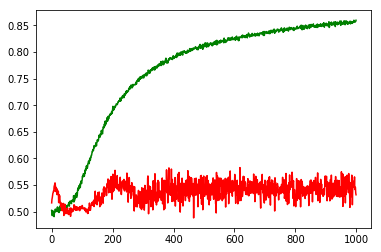

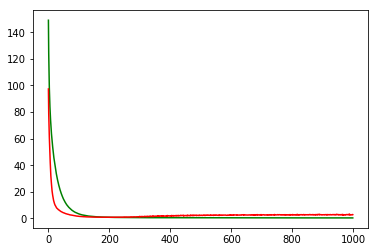

working on d,u and l,le 0.5 128 0.01 1e-05


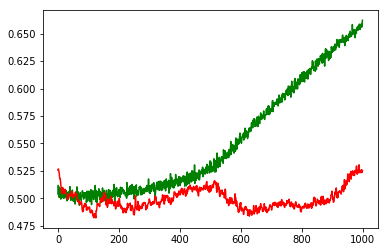

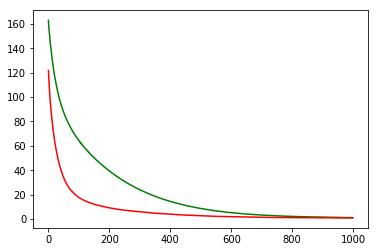

working on d,u and l,le 0.5 128 0.05 0.001


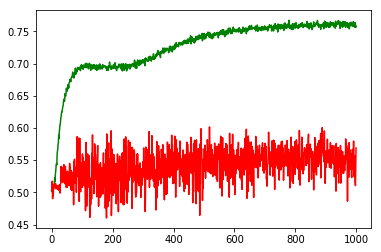

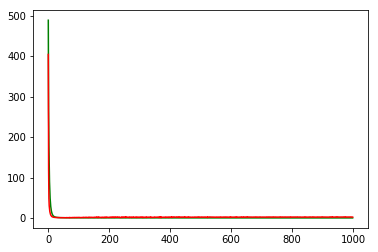

working on d,u and l,le 0.5 128 0.05 0.0001


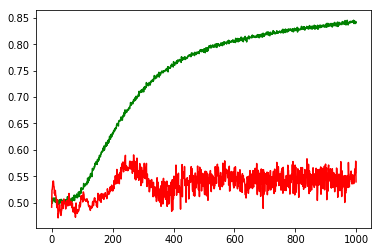

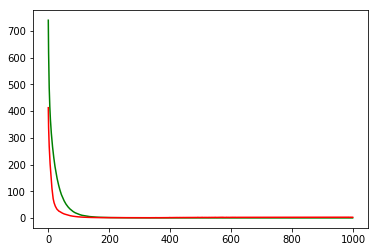

working on d,u and l,le 0.5 128 0.05 1e-05


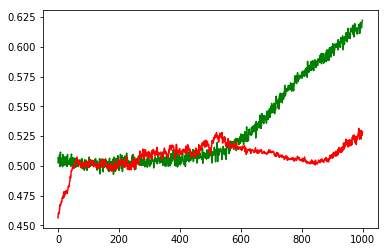

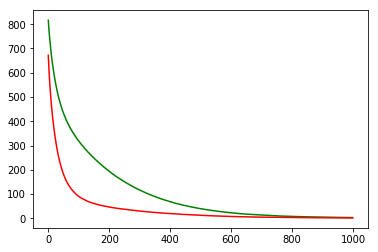

working on d,u and l,le 0.5 256 0.01 0.001


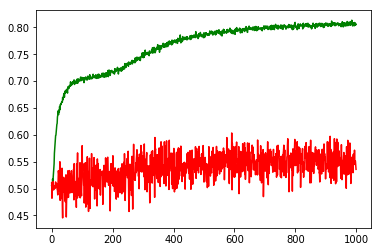

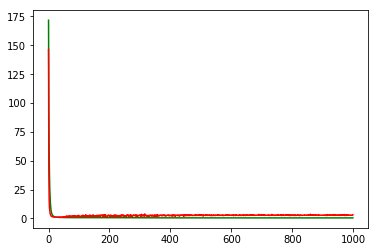

working on d,u and l,le 0.5 256 0.01 0.0001


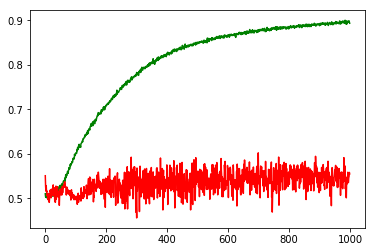

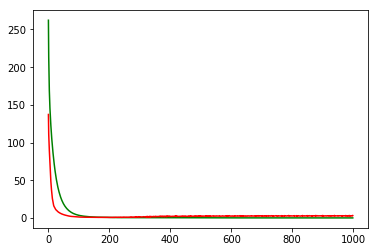

working on d,u and l,le 0.5 256 0.01 1e-05


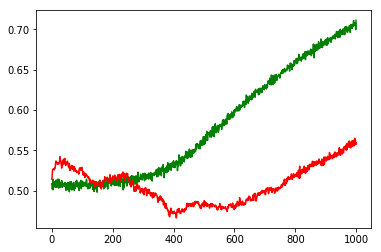

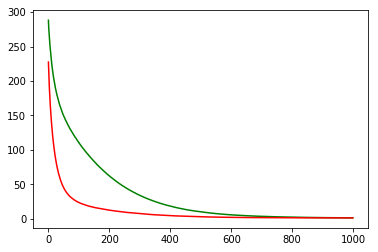

working on d,u and l,le 0.5 256 0.05 0.001


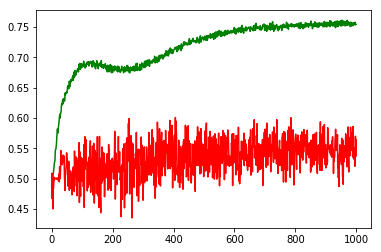

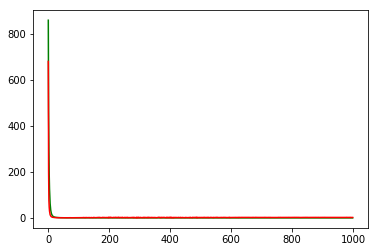

working on d,u and l,le 0.5 256 0.05 0.0001


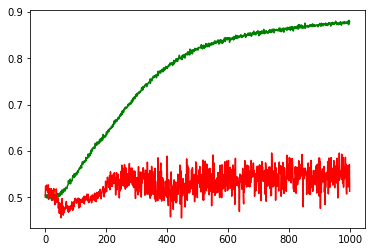

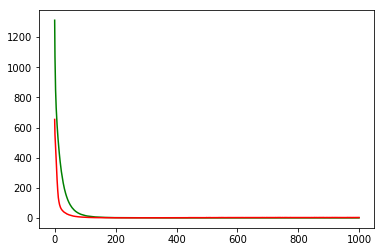

working on d,u and l,le 0.5 256 0.05 1e-05


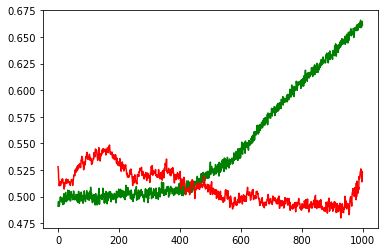

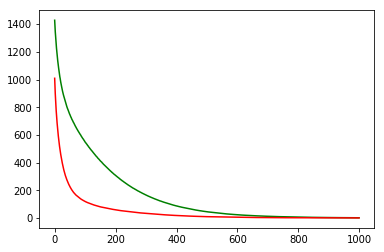

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: COST


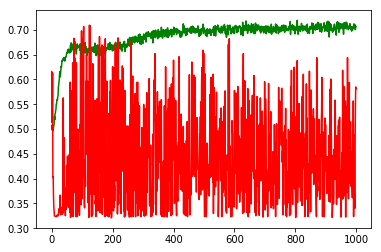

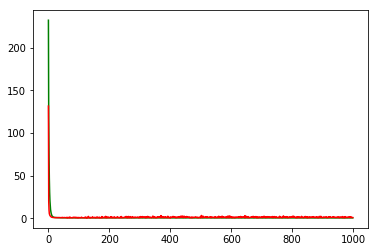

F1,score 0.6735537190082644
G-score: 0.5429287683267295
Accuracy 0.5812720848056537
Window: 140
[[169 197]
 [277 489]]
Vol pos 1.4777851001073192
Vol neg 1.3475433736867817
Real Percentage of gain: 27.204004019282326
Percentage of gain: 0.29474119853629105
Total gain: 333.64703674308146
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 76 112]
 [ 65 120]]
373/373 [==============================] - 0s 19us/step
[1.3425496338839187, 0.5254691698595921]
Percentile:  1
[[ 50  47]
 [ 67 139]]
303/303 [==============================] - 0s 20us/step
[0.754609919789404, 0.6237623762376238]
Percentile:  2
[[ 34  34]
 [ 81 144]]
293/293 [==============================] - 0s 22us/step
[0.7075043180226365, 0.6075085324232082]
Percentile:  3
[[ 8  4]
 [48 38]]
98/98 [==============================] - 0s 31us/step
[0.8735716610538716, 0.46938775510204084]
Percentile:  4
[[ 0  0]
 [16 47]]
63/63 [==============================] - 0s 40us/step
[0.4477444603920929, 0.746031746031746]
0

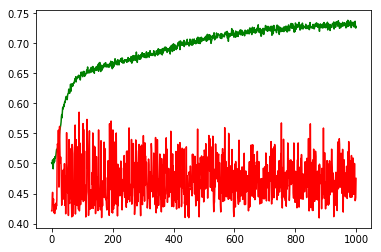

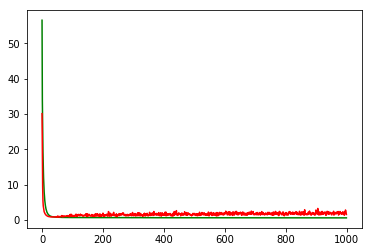

working on d,u and l,le 0.5 64 0.01 0.0001


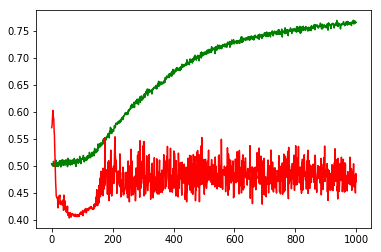

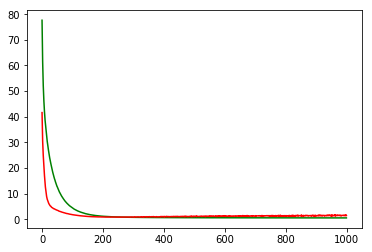

working on d,u and l,le 0.5 64 0.01 1e-05


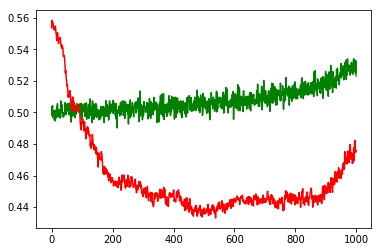

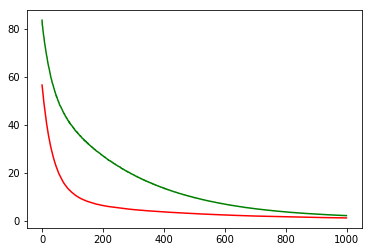

working on d,u and l,le 0.5 64 0.05 0.001


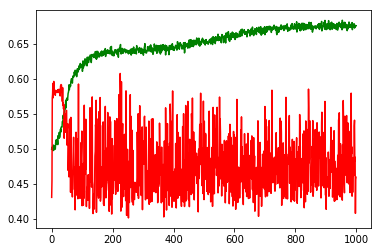

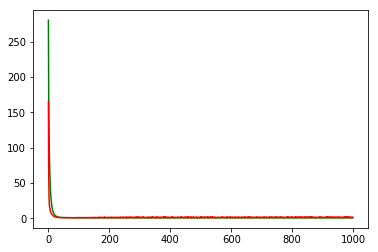

working on d,u and l,le 0.5 64 0.05 0.0001


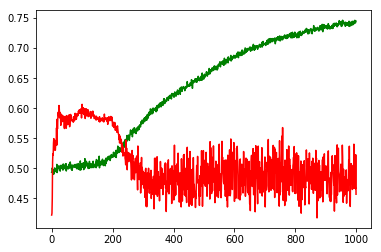

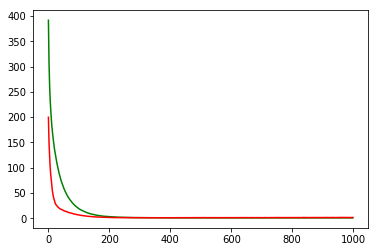

working on d,u and l,le 0.5 64 0.05 1e-05


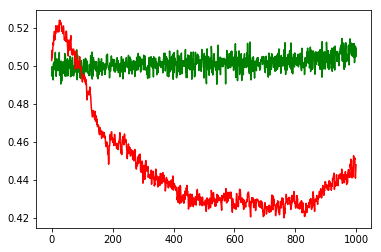

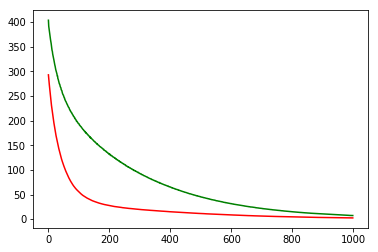

working on d,u and l,le 0.5 128 0.01 0.001


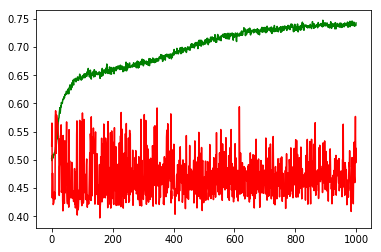

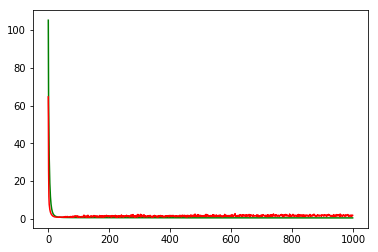

working on d,u and l,le 0.5 128 0.01 0.0001


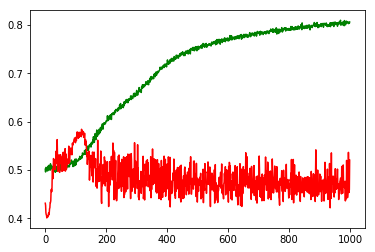

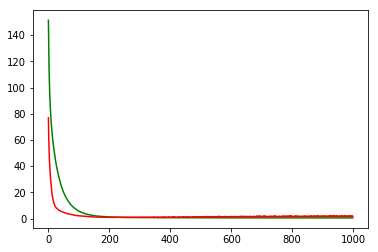

working on d,u and l,le 0.5 128 0.01 1e-05


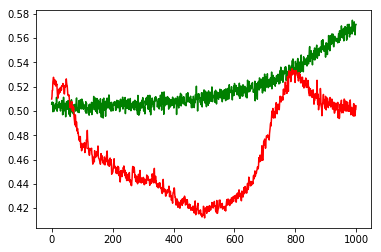

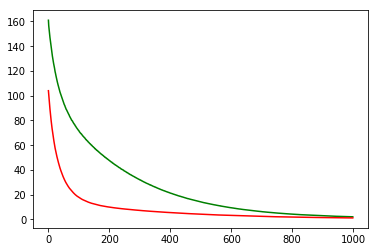

working on d,u and l,le 0.5 128 0.05 0.001


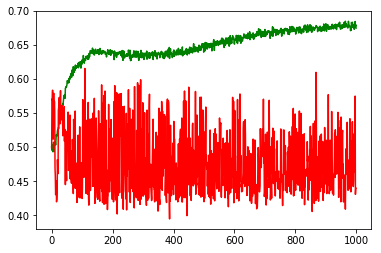

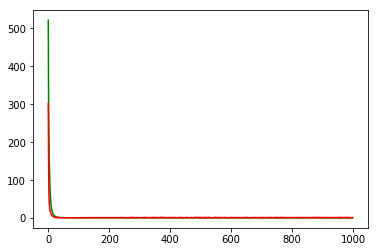

working on d,u and l,le 0.5 128 0.05 0.0001


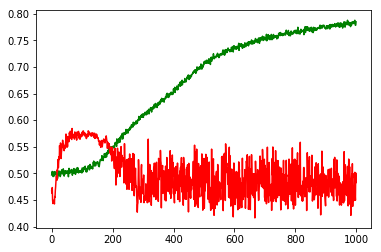

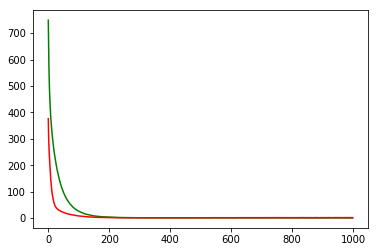

working on d,u and l,le 0.5 128 0.05 1e-05


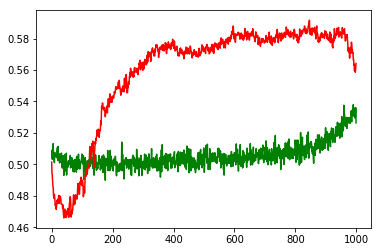

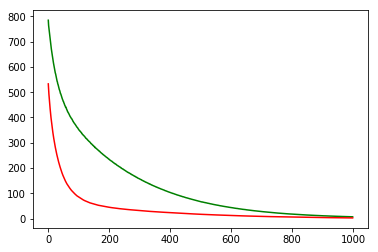

working on d,u and l,le 0.5 256 0.01 0.001


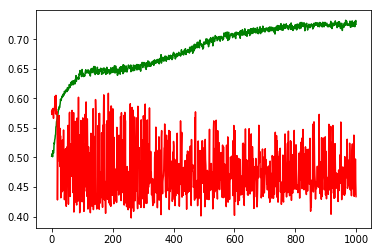

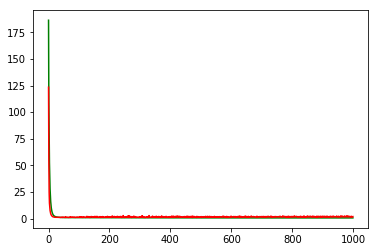

working on d,u and l,le 0.5 256 0.01 0.0001


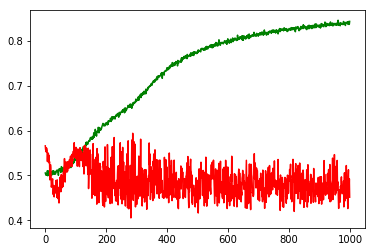

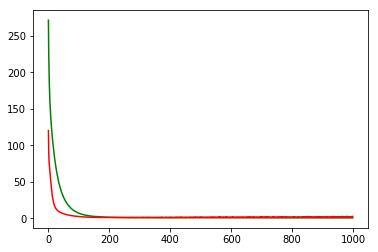

working on d,u and l,le 0.5 256 0.01 1e-05


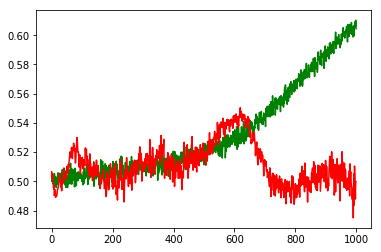

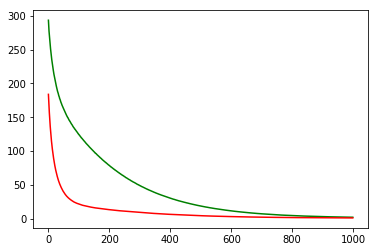

working on d,u and l,le 0.5 256 0.05 0.001


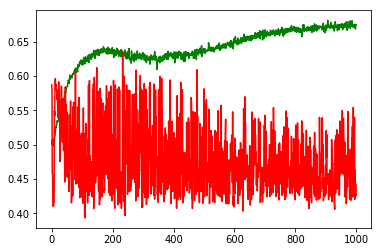

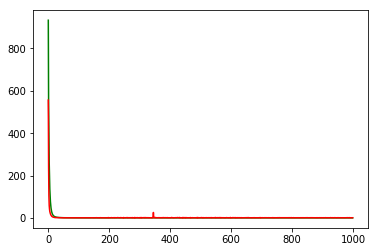

working on d,u and l,le 0.5 256 0.05 0.0001


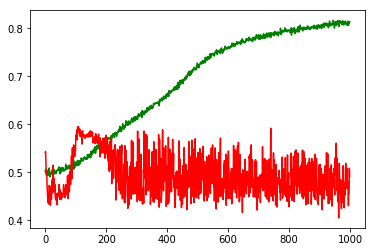

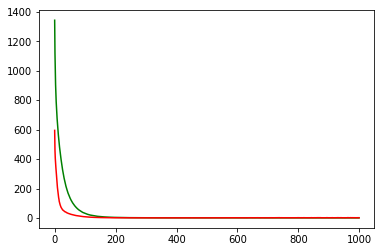

working on d,u and l,le 0.5 256 0.05 1e-05


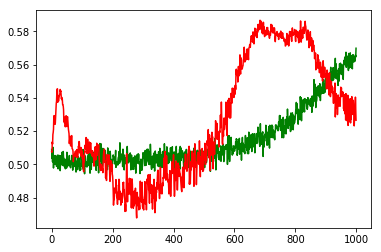

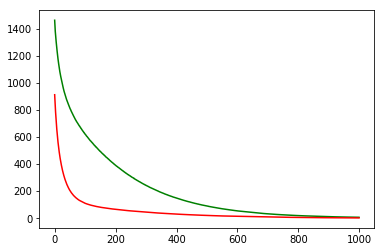

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: QCOM


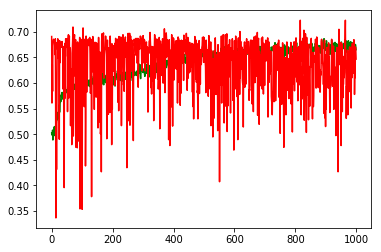

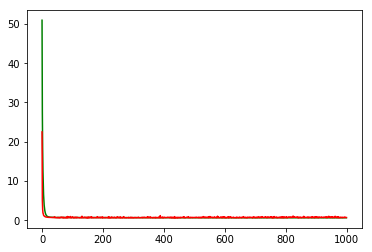

F1,score 0.7679814385150812
G-score: 0.4095643576396344
Accuracy 0.6466431095472178
Window: 140
[[ 70 286]
 [114 662]]
Vol pos 3.3276972754746867
Vol neg 3.3579662850498924
Real Percentage of gain: 102.88883874849566
Percentage of gain: 0.9652719890702417
Total gain: 1092.6878916275136
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 54 179]
 [ 51 248]]
532/532 [==============================] - 0s 20us/step
[0.6699340222473431, 0.5676691729323309]
Percentile:  1
[[ 10  38]
 [ 38 258]]
344/344 [==============================] - 0s 23us/step
[0.6125506176504978, 0.7790697675284951]
Percentile:  2
[[ 5 12]
 [10 80]]
107/107 [==============================] - 0s 41us/step
[0.7120120558783273, 0.794392523364486]
Percentile:  3
[[ 1 10]
 [13 55]]
79/79 [==============================] - 0s 39us/step
[0.7105513871470585, 0.7088607594936709]
Percentile:  4
[[ 0 46]
 [ 2 20]]
68/68 [==============================] - 0s 59us/step
[0.8254286524127511, 0.29411764705882354]
00000

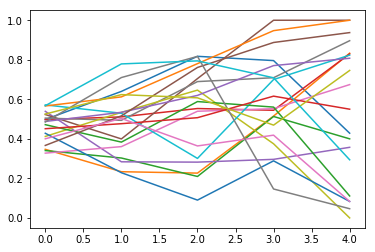

Ecco la matrice generale:
[[4315. 3190.]
 [7737. 6195.]]
Ecco le matrici per percentile
Percentile : 0
[[2562. 1720.]
 [3393. 1952.]]
Percentile : 1
[[ 861.  790.]
 [2503. 2120.]]
Percentile : 2
[[ 475.  348.]
 [1209. 1273.]]
Percentile : 3
[[269. 171.]
 [459. 577.]]
Percentile : 4
[[141. 157.]
 [160. 254.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))
predictionscsv = pd.DataFrame()
for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
   
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(xtemp[i])
        
        y=np.array(y)
        x=np.array(x)
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
    


            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0



                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                           
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph() 
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/price/'+files[o-1]+'.csv')
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                        #labels added later
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp,labels=[0,1])
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        

            

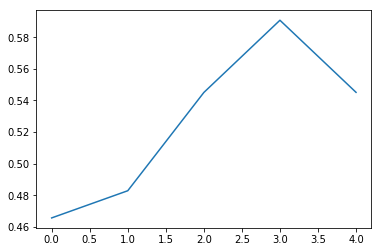

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()